In [1]:
import numpy as np
import pandas as pd
# Seaborn and matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm
# Plotly library
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
from plotly import tools
from scipy import stats 
#import colorlover as cl
# Others
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
init_notebook_mode(connected=True)
import datetime as dt
import calendar
from scipy.stats import skew,kurtosis
#import du module d'EDA automatique
import pandas_profiling
from IPython.display import display
from matplotlib import style
style.use("ggplot")
from sklearn.cluster import KMeans
from datetime import datetime
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from mpl_toolkits.mplot3d import Axes3D

dfOrdersItems = pd.read_csv(r'C:\Users\mehdi\OneDrive\Documents\OpenClassRooms\Projet 4\brazilian-ecommerce\olist_order_items_dataset.csv')
dfOrders = pd.read_csv(r'C:\Users\mehdi\OneDrive\Documents\OpenClassRooms\Projet 4\brazilian-ecommerce\olist_orders_dataset.csv')
dfProducts = pd.read_csv(r'C:\Users\mehdi\OneDrive\Documents\OpenClassRooms\Projet 4\brazilian-ecommerce\olist_products_dataset.csv')
dfOrdersReviews = pd.read_csv(r'C:\Users\mehdi\OneDrive\Documents\OpenClassRooms\Projet 4\brazilian-ecommerce\olist_order_reviews_dataset.csv')
dfSellers = pd.read_csv(r'C:\Users\mehdi\OneDrive\Documents\OpenClassRooms\Projet 4\brazilian-ecommerce\olist_sellers_dataset.csv')
dfCustomers = pd.read_csv(r'C:\Users\mehdi\OneDrive\Documents\OpenClassRooms\Projet 4\brazilian-ecommerce\olist_customers_dataset.csv')
dfGeolocation = pd.read_csv(r'C:\Users\mehdi\OneDrive\Documents\OpenClassRooms\Projet 4\brazilian-ecommerce\olist_geolocation_dataset.csv')
dfTranslation = pd.read_csv(r'C:\Users\mehdi\OneDrive\Documents\OpenClassRooms\Projet 4\brazilian-ecommerce\product_category_name_translation.csv')
dfOrderPay = pd.read_csv(r'C:\Users\mehdi\OneDrive\Documents\OpenClassRooms\Projet 4\brazilian-ecommerce\olist_order_payments_dataset.csv')

In [2]:
df_train = dfOrders.merge(dfOrdersItems, on='order_id', how='left')
df_train = df_train.merge(dfOrderPay, on='order_id', how='outer', validate='m:m')
df_train = df_train.merge(dfOrdersReviews, on='order_id', how='outer')
df_train = df_train.merge(dfProducts, on='product_id', how='outer')
df_train = df_train.merge(dfCustomers, on='customer_id', how='outer')
df_train = df_train.merge(dfSellers, on='seller_id', how='outer')
df_train = df_train.merge(dfTranslation, on='product_category_name', how='outer')
print(df_train.shape)

(119151, 40)


In [3]:
df_train.profile_report()

In [4]:
df_train=df_train.drop_duplicates()

In [5]:
# Function to calculate missing values by column
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [6]:
missing_values_table(df_train)

Your selected dataframe has 40 columns.
There are 27 columns that have missing values.


,Missing Values,% of Total Values
review_comment_title,104962,88.1
review_comment_message,67901,57.0
order_delivered_customer_date,3421,2.9
product_category_name_english,2567,2.2
product_category_name,2542,2.1
product_name_lenght,2542,2.1
product_photos_qty,2542,2.1
product_description_lenght,2542,2.1
order_delivered_carrier_date,2086,1.8
product_width_cm,853,0.7


In [7]:
# Get the columns with > 50% missing
missing_df = missing_values_table(df_train);
missing_columns= list(missing_df[missing_df['% of Total Values'] > 50].index)
print('We will remove %d columns.' % len(missing_columns))

Your selected dataframe has 40 columns.
There are 27 columns that have missing values.
We will remove 2 columns.


In [8]:
# Drop the columns
df_train = df_train.drop(columns = list(missing_columns))

In [9]:
df_train.dropna(inplace=True)

In [10]:
def resumetable(df):
    print(f"Dataset Shape: {df.shape}")
    summary = pd.DataFrame(df.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = df.isnull().sum().values    
    summary['Uniques'] = df.nunique().values
    summary['First Value'] = df.loc[0].values
    summary['Second Value'] = df.loc[1].values
    summary['Third Value'] = df.loc[2].values

    for name in summary['Name'].value_counts().index:
        summary.loc[summary['Name'] == name, 'Entropy'] = round(stats.entropy(df[name].value_counts(normalize=True), base=2),2) 

    return summary

def cross_heatmap(df, cols, normalize=False, values=None, aggfunc=None):
    temp = cols
    cm = sns.light_palette("green", as_cmap=True)
    return pd.crosstab(df[temp[0]], df[temp[1]], 
                       normalize=normalize, values=values, aggfunc=aggfunc).style.background_gradient(cmap = cm)



In [11]:
resumetable(df_train)

Dataset Shape: (114050, 38)


,Name,dtypes,Missing,Uniques,First Value,Second Value,Third Value,Entropy
0,order_id,object,0,95109,e481f51cbdc54678b7cc49136f2d6af7,e481f51cbdc54678b7cc49136f2d6af7,e481f51cbdc54678b7cc49136f2d6af7,16.39
1,customer_id,object,0,95109,9ef432eb6251297304e76186b10a928d,9ef432eb6251297304e76186b10a928d,9ef432eb6251297304e76186b10a928d,16.39
2,order_status,object,0,2,delivered,delivered,delivered,0.00
3,order_purchase_timestamp,object,0,94605,2017-10-02 10:56:33,2017-10-02 10:56:33,2017-10-02 10:56:33,16.38
4,order_approved_at,object,0,87112,2017-10-02 11:07:15,2017-10-02 11:07:15,2017-10-02 11:07:15,16.22
5,order_delivered_carrier_date,object,0,78909,2017-10-04 19:55:00,2017-10-04 19:55:00,2017-10-04 19:55:00,15.99
6,order_delivered_customer_date,object,0,94321,2017-10-10 21:25:13,2017-10-10 21:25:13,2017-10-10 21:25:13,16.38
7,order_estimated_delivery_date,object,0,444,2017-10-18 00:00:00,2017-10-18 00:00:00,2017-10-18 00:00:00,8.46
8,order_item_id,float64,0,21,1,1,1,0.72
9,product_id,object,0,31614,87285b34884572647811a353c7ac498a,87285b34884572647811a353c7ac498a,87285b34884572647811a353c7ac498a,13.57


In [12]:
id_cols = ['order_id', 'seller_id', 'customer_id', 'order_item_id', 'product_id', 
           'review_id', 'customer_unique_id', 'seller_zip_code_prefix']
#categorical columns
cat_cols = df_train.nunique()[df_train.nunique() <= 27].keys().tolist()
# cat_cols = [x for x in cat_cols if x not in target_col]

#numerical columns
num_cols = [x for x in df_train.columns if x not in cat_cols + id_cols]

#Binary columns with 2 values
bin_cols = df_train.nunique()[df_train.nunique() == 2].keys().tolist()

#Columns more than 2 values
multi_cols = [i for i in cat_cols if i not in bin_cols]

In [13]:
print("Total number of orders in the database:",df_train['order_id'].nunique())
print("Total Number of customers:",df_train['customer_id'].nunique())
print("Total Number of unique customers:",df_train['customer_unique_id'].nunique())

Total number of orders in the database: 95109
Total Number of customers: 95109
Total Number of unique customers: 92062


In [14]:
status=df_train.groupby('order_status')['order_id'].nunique().sort_values(ascending=False)
status

order_status
delivered    95103
canceled         6
Name: order_id, dtype: int64

In [15]:
#quantité commandée par commande
df_train['order_item_qty'] = df_train.groupby(['order_id','order_item_id']).order_id.transform('count')

In [16]:
#prix total = prix + frais de port
df_train['Total_price'] = df_train['price'] + df_train['freight_value']

In [17]:
## Executive Summary:
print("Maximum order value is:",df_train['payment_value'].max(),"BRL")
print("Minimum order value is:",df_train['payment_value'].min(),"BRL")
print("Average order value is:",df_train['payment_value'].mean(),"BRL")
print("Median order value is:",df_train['payment_value'].median(),"BRL")

Maximum order value is: 13664.08 BRL
Minimum order value is: 0.0 BRL
Average order value is: 172.1230766330557 BRL
Median order value is: 108.06 BRL


In [18]:
print('The median price is {}'.format((np.median(df_train['price']))))
print('The mean price is {}'.format((np.mean(df_train['price']))))
print('The median TOTAL price is {}'.format((np.median(df_train['Total_price']))))
print('The mean TOTAL price is {}'.format((np.mean(df_train['Total_price']))))

The median price is 74.9
The mean price is 119.99289311705391
The median TOTAL price is 91.79
The mean TOTAL price is 140.00316098202543


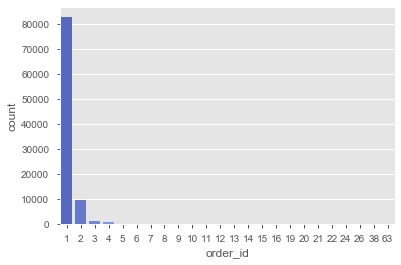

In [19]:
sns.countplot(x=df_train['order_id'].value_counts(),data=df_train,palette = "coolwarm")

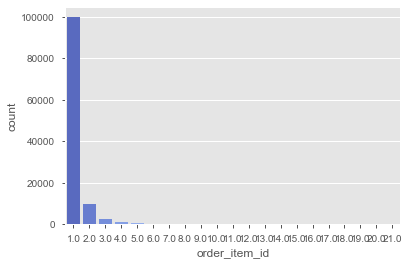

In [20]:
sns.countplot(x=df_train['order_item_id'],data=df_train,palette = "coolwarm")

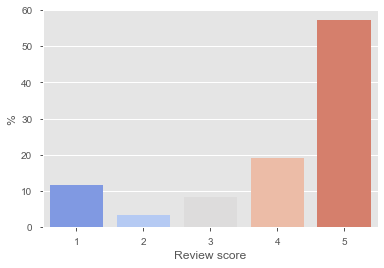

In [21]:
review_counts = df_train['review_score'].value_counts().to_frame().reset_index()
review_counts['score'] = review_counts['index']
review_counts['review_percentage'] = review_counts['review_score']/sum(review_counts['review_score'])*100
sns.barplot(x='score',y='review_percentage',data=review_counts,palette = "coolwarm")
plt.xlabel('Review score')
plt.ylabel('%')
plt.savefig('review_score.eps')

df_train=df_train.drop(columns={'order_id','customer_id','product_id','seller_id','shipping_limit_date','order_purchase_timestamp'})

df_train.drop_duplicates(subset=['customer_unique_id'],inplace=True)

In [22]:
df_train

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,order_item_qty,Total_price
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,3a51803cc0d012c3b5dc8b7528cb05f7,3366,sao paulo,SP,9350.0,maua,SP,housewares,1,37.77
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,ef0996a1a279c26e7ecbd737be23d235,2290,sao paulo,SP,9350.0,maua,SP,housewares,1,37.77
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119144,872b07190c0c9c0f13475d2141c4036a,814605f2161337c56520639099b0199f,delivered,2018-07-03 10:10:12,2018-07-05 16:22:38,2018-07-03 12:00:00,2018-07-10 17:18:49,2018-08-02 00:00:00,2.0,97de49733ccaac64d122444d8db709d1,...,c5df80808db02b2e08abd92b9d964b9b,66033,belem,PA,5201.0,sao paulo,SP,books_imported,1,84.36
119145,522eec5aa38ae3153b1c1a94e013947e,39eda8beee70b851aa9ba9040fb44615,delivered,2018-07-05 16:25:40,2018-07-06 02:35:18,2018-07-06 10:27:00,2018-07-09 18:16:53,2018-07-27 00:00:00,1.0,5b668636d65ddf4e4109c6d8fb13ea56,...,9790c90c5b3a1a5237c11433331af1cb,83206,paranagua,PR,5201.0,sao paulo,SP,books_imported,1,63.41
119147,1dbff949801376b8795a093d31cfe205,0cbd2df3d6e9d8b1eaf5cfefc44886bc,delivered,2018-05-16 14:50:54,2018-05-16 15:18:42,2018-05-18 12:10:00,2018-05-21 17:14:08,2018-05-28 00:00:00,1.0,90797f195eb7bb9dae050697a25f35ce,...,1de8fb735d8252498d9a2f82a68c57e0,9411,ribeirao pires,SP,5201.0,sao paulo,SP,books_imported,1,66.38
119148,6775b950cdc4da0ce39b261032f92c84,c4d135422be0d4333f506acde8af9419,delivered,2018-06-13 12:19:26,2018-06-13 17:39:14,2018-06-15 13:09:00,2018-06-16 17:48:30,2018-06-28 00:00:00,1.0,3e72533d34a1779d818ac8a73403387c,...,5f684afb3d1a02f2787e80cb0eee6e02,2927,sao paulo,SP,5201.0,sao paulo,SP,books_imported,1,31.42


In [23]:
df_train_save=df_train.copy()

In [24]:
#prix moyen TOTAL depensé par client
average_total_price_spent_by_customer=df_train.groupby('customer_unique_id').agg(average_total_price_spent_by_customer=('Total_price','mean')).reset_index().sort_values('average_total_price_spent_by_customer',ascending = False)
average_total_price_spent_by_customer

,customer_unique_id,average_total_price_spent_by_customer
79360,dc4802a71eae9be1dd28f5d788ceb526,6929.310000
25085,459bef486812aa25204be022145caa62,6922.210000
91792,ff4159b92c40ebe40454e3e6a7c35ed6,6726.660000
85951,eebb5dda148d3893cdaf5b5ca3040ccb,4764.340000
26277,48e1ac109decbb87765a3eade6854098,4681.780000
...,...,...
14597,2878e5b88167faab17d4fb83a986d38b,11.630000
64573,b33336f46234b24a613ad9064d13106d,10.890000
68090,bd06ce0e06ad77a7f681f1a4960a3cc6,10.070000
17851,317cfc692e3f86c45c95697c61c853a6,9.590000


In [25]:
df_train=df_train.merge(average_total_price_spent_by_customer,on=['customer_unique_id'])
df_train

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,customer_zip_code_prefix,customer_city,customer_state,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,order_item_qty,Total_price,average_total_price_spent_by_customer
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,3149,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71,40.06
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,3149,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71,40.06
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,3149,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71,40.06
3,69923a4e07ce446644394df37a710286,31f31efcb333fcbad2b1371c8cf0fa84,delivered,2017-09-04 11:26:38,2017-09-04 11:43:25,2017-09-04 21:22:15,2017-09-05 19:20:20,2017-09-15 00:00:00,1.0,9abb00920aae319ef9eba674b7d2e6ff,...,3149,sao paulo,SP,7025.0,guarulhos,SP,baby,1,44.11,40.06
4,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,3366,sao paulo,SP,9350.0,maua,SP,housewares,1,37.77,37.77
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114045,872b07190c0c9c0f13475d2141c4036a,814605f2161337c56520639099b0199f,delivered,2018-07-03 10:10:12,2018-07-05 16:22:38,2018-07-03 12:00:00,2018-07-10 17:18:49,2018-08-02 00:00:00,2.0,97de49733ccaac64d122444d8db709d1,...,66033,belem,PA,5201.0,sao paulo,SP,books_imported,1,84.36,84.36
114046,522eec5aa38ae3153b1c1a94e013947e,39eda8beee70b851aa9ba9040fb44615,delivered,2018-07-05 16:25:40,2018-07-06 02:35:18,2018-07-06 10:27:00,2018-07-09 18:16:53,2018-07-27 00:00:00,1.0,5b668636d65ddf4e4109c6d8fb13ea56,...,83206,paranagua,PR,5201.0,sao paulo,SP,books_imported,1,63.41,63.41
114047,1dbff949801376b8795a093d31cfe205,0cbd2df3d6e9d8b1eaf5cfefc44886bc,delivered,2018-05-16 14:50:54,2018-05-16 15:18:42,2018-05-18 12:10:00,2018-05-21 17:14:08,2018-05-28 00:00:00,1.0,90797f195eb7bb9dae050697a25f35ce,...,9411,ribeirao pires,SP,5201.0,sao paulo,SP,books_imported,1,66.38,66.38
114048,6775b950cdc4da0ce39b261032f92c84,c4d135422be0d4333f506acde8af9419,delivered,2018-06-13 12:19:26,2018-06-13 17:39:14,2018-06-15 13:09:00,2018-06-16 17:48:30,2018-06-28 00:00:00,1.0,3e72533d34a1779d818ac8a73403387c,...,2927,sao paulo,SP,5201.0,sao paulo,SP,books_imported,1,31.42,31.42


In [26]:
#review score moyen par client
mean_review_score_by_customer=df_train.groupby('customer_unique_id').agg(mean_review_score_by_customer=('review_score','mean')).reset_index().sort_values('mean_review_score_by_customer',ascending = False)
mean_review_score_by_customer

,customer_unique_id,mean_review_score_by_customer
0,0000366f3b9a7992bf8c76cfdf3221e2,5.0
53204,941aea93899e1ce73d06e2ce13ac5f84,5.0
53182,940dfa70f65363b04ab3442ad629f1fa,5.0
53183,940f79613f505ade14e5954470d25660,5.0
53185,9410c05c403cf6b73c071fa50c8ae641,5.0
...,...,...
56566,9d1f4d137b3e895a7068c74cc1d2711d,1.0
56553,9d0f113059526f40a70dce1859d22b27,1.0
56528,9cfb33b777e28002bb1cca34f17124dc,1.0
56519,9cf60f4109040cf85537b7e9d4f91af9,1.0


In [27]:
df_train=df_train.merge(mean_review_score_by_customer, on=['customer_unique_id']) 
df_train

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,customer_city,customer_state,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,order_item_qty,Total_price,average_total_price_spent_by_customer,mean_review_score_by_customer
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71,40.06,4.25
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71,40.06,4.25
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71,40.06,4.25
3,69923a4e07ce446644394df37a710286,31f31efcb333fcbad2b1371c8cf0fa84,delivered,2017-09-04 11:26:38,2017-09-04 11:43:25,2017-09-04 21:22:15,2017-09-05 19:20:20,2017-09-15 00:00:00,1.0,9abb00920aae319ef9eba674b7d2e6ff,...,sao paulo,SP,7025.0,guarulhos,SP,baby,1,44.11,40.06,4.25
4,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,sao paulo,SP,9350.0,maua,SP,housewares,1,37.77,37.77,4.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114045,872b07190c0c9c0f13475d2141c4036a,814605f2161337c56520639099b0199f,delivered,2018-07-03 10:10:12,2018-07-05 16:22:38,2018-07-03 12:00:00,2018-07-10 17:18:49,2018-08-02 00:00:00,2.0,97de49733ccaac64d122444d8db709d1,...,belem,PA,5201.0,sao paulo,SP,books_imported,1,84.36,84.36,5.00
114046,522eec5aa38ae3153b1c1a94e013947e,39eda8beee70b851aa9ba9040fb44615,delivered,2018-07-05 16:25:40,2018-07-06 02:35:18,2018-07-06 10:27:00,2018-07-09 18:16:53,2018-07-27 00:00:00,1.0,5b668636d65ddf4e4109c6d8fb13ea56,...,paranagua,PR,5201.0,sao paulo,SP,books_imported,1,63.41,63.41,1.00
114047,1dbff949801376b8795a093d31cfe205,0cbd2df3d6e9d8b1eaf5cfefc44886bc,delivered,2018-05-16 14:50:54,2018-05-16 15:18:42,2018-05-18 12:10:00,2018-05-21 17:14:08,2018-05-28 00:00:00,1.0,90797f195eb7bb9dae050697a25f35ce,...,ribeirao pires,SP,5201.0,sao paulo,SP,books_imported,1,66.38,66.38,5.00
114048,6775b950cdc4da0ce39b261032f92c84,c4d135422be0d4333f506acde8af9419,delivered,2018-06-13 12:19:26,2018-06-13 17:39:14,2018-06-15 13:09:00,2018-06-16 17:48:30,2018-06-28 00:00:00,1.0,3e72533d34a1779d818ac8a73403387c,...,sao paulo,SP,5201.0,sao paulo,SP,books_imported,1,31.42,31.42,5.00


In [28]:
#quantité moyenne de produits commandés par client
mean_quantity_of_product_ordered_by_customer=df_train.groupby('customer_unique_id').agg(mean_quantity_of_product_ordered_by_customer=('order_item_qty','mean')).reset_index().sort_values('mean_quantity_of_product_ordered_by_customer',ascending = False).round(0)
mean_quantity_of_product_ordered_by_customer

,customer_unique_id,mean_quantity_of_product_ordered_by_customer
31232,569aa12b73b5f7edeaa6f2a01603e381,26.0
51917,90807fdb59eec2152bc977feeb6e47e7,24.0
13428,2524dcec233c3766f2c2b22f69fd65f4,22.0
55583,9a736b248f67d166d2fbb006bcb877c3,20.0
13346,24f12460aad399ba18f4ed2c2fbab65d,19.0
...,...,...
31155,565fb68ac5d1fdf1721f544362f46c35,1.0
31154,565ed8556b2c4073a68f27f5213cdc5f,1.0
31153,565e2431d09da4c6f5e1fbbfcafe1690,1.0
31152,565c8d0f62d1e0c9e8da045ba0dd0e07,1.0


In [29]:
df_train= df_train.merge(mean_quantity_of_product_ordered_by_customer,on=['customer_unique_id'])
df_train

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,customer_state,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,order_item_qty,Total_price,average_total_price_spent_by_customer,mean_review_score_by_customer,mean_quantity_of_product_ordered_by_customer
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,SP,9350.0,maua,SP,housewares,3,38.71,40.06,4.25,2.0
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,SP,9350.0,maua,SP,housewares,3,38.71,40.06,4.25,2.0
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,SP,9350.0,maua,SP,housewares,3,38.71,40.06,4.25,2.0
3,69923a4e07ce446644394df37a710286,31f31efcb333fcbad2b1371c8cf0fa84,delivered,2017-09-04 11:26:38,2017-09-04 11:43:25,2017-09-04 21:22:15,2017-09-05 19:20:20,2017-09-15 00:00:00,1.0,9abb00920aae319ef9eba674b7d2e6ff,...,SP,7025.0,guarulhos,SP,baby,1,44.11,40.06,4.25,2.0
4,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,SP,9350.0,maua,SP,housewares,1,37.77,37.77,4.00,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114045,872b07190c0c9c0f13475d2141c4036a,814605f2161337c56520639099b0199f,delivered,2018-07-03 10:10:12,2018-07-05 16:22:38,2018-07-03 12:00:00,2018-07-10 17:18:49,2018-08-02 00:00:00,2.0,97de49733ccaac64d122444d8db709d1,...,PA,5201.0,sao paulo,SP,books_imported,1,84.36,84.36,5.00,1.0
114046,522eec5aa38ae3153b1c1a94e013947e,39eda8beee70b851aa9ba9040fb44615,delivered,2018-07-05 16:25:40,2018-07-06 02:35:18,2018-07-06 10:27:00,2018-07-09 18:16:53,2018-07-27 00:00:00,1.0,5b668636d65ddf4e4109c6d8fb13ea56,...,PR,5201.0,sao paulo,SP,books_imported,1,63.41,63.41,1.00,1.0
114047,1dbff949801376b8795a093d31cfe205,0cbd2df3d6e9d8b1eaf5cfefc44886bc,delivered,2018-05-16 14:50:54,2018-05-16 15:18:42,2018-05-18 12:10:00,2018-05-21 17:14:08,2018-05-28 00:00:00,1.0,90797f195eb7bb9dae050697a25f35ce,...,SP,5201.0,sao paulo,SP,books_imported,1,66.38,66.38,5.00,1.0
114048,6775b950cdc4da0ce39b261032f92c84,c4d135422be0d4333f506acde8af9419,delivered,2018-06-13 12:19:26,2018-06-13 17:39:14,2018-06-15 13:09:00,2018-06-16 17:48:30,2018-06-28 00:00:00,1.0,3e72533d34a1779d818ac8a73403387c,...,SP,5201.0,sao paulo,SP,books_imported,1,31.42,31.42,5.00,1.0


In [30]:
#quantité unique de produits commandés par client
number_of_product_ordered_per_customer=df_train.groupby('customer_unique_id').agg(number_of_product_ordered_per_customer=('order_item_qty','count')).reset_index().sort_values('number_of_product_ordered_per_customer',ascending = False)
number_of_product_ordered_per_customer

,customer_unique_id,number_of_product_ordered_per_customer
55583,9a736b248f67d166d2fbb006bcb877c3,75
40258,6fbc7cdadbb522125f4b27ae9dee4060,38
89855,f9ae226291893fda10af7965268fb7f6,35
31232,569aa12b73b5f7edeaa6f2a01603e381,26
48063,85963fd37bfd387aa6d915d8a1065486,24
...,...,...
33094,5b9fd51537337750cd28594c51d63769,1
33093,5b9f3a22a2f637041e498817b1e956cd,1
33092,5b9e2d80a7ebfcf10ed0fa934a6de8f9,1
33091,5b9ded8428365feb7e1eac3fc3085132,1


In [31]:
df_train= df_train.merge(number_of_product_ordered_per_customer,on=['customer_unique_id'])
df_train

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,order_item_qty,Total_price,average_total_price_spent_by_customer,mean_review_score_by_customer,mean_quantity_of_product_ordered_by_customer,number_of_product_ordered_per_customer
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,9350.0,maua,SP,housewares,3,38.71,40.06,4.25,2.0,4
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,9350.0,maua,SP,housewares,3,38.71,40.06,4.25,2.0,4
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,9350.0,maua,SP,housewares,3,38.71,40.06,4.25,2.0,4
3,69923a4e07ce446644394df37a710286,31f31efcb333fcbad2b1371c8cf0fa84,delivered,2017-09-04 11:26:38,2017-09-04 11:43:25,2017-09-04 21:22:15,2017-09-05 19:20:20,2017-09-15 00:00:00,1.0,9abb00920aae319ef9eba674b7d2e6ff,...,7025.0,guarulhos,SP,baby,1,44.11,40.06,4.25,2.0,4
4,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,9350.0,maua,SP,housewares,1,37.77,37.77,4.00,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114045,872b07190c0c9c0f13475d2141c4036a,814605f2161337c56520639099b0199f,delivered,2018-07-03 10:10:12,2018-07-05 16:22:38,2018-07-03 12:00:00,2018-07-10 17:18:49,2018-08-02 00:00:00,2.0,97de49733ccaac64d122444d8db709d1,...,5201.0,sao paulo,SP,books_imported,1,84.36,84.36,5.00,1.0,2
114046,522eec5aa38ae3153b1c1a94e013947e,39eda8beee70b851aa9ba9040fb44615,delivered,2018-07-05 16:25:40,2018-07-06 02:35:18,2018-07-06 10:27:00,2018-07-09 18:16:53,2018-07-27 00:00:00,1.0,5b668636d65ddf4e4109c6d8fb13ea56,...,5201.0,sao paulo,SP,books_imported,1,63.41,63.41,1.00,1.0,1
114047,1dbff949801376b8795a093d31cfe205,0cbd2df3d6e9d8b1eaf5cfefc44886bc,delivered,2018-05-16 14:50:54,2018-05-16 15:18:42,2018-05-18 12:10:00,2018-05-21 17:14:08,2018-05-28 00:00:00,1.0,90797f195eb7bb9dae050697a25f35ce,...,5201.0,sao paulo,SP,books_imported,1,66.38,66.38,5.00,1.0,1
114048,6775b950cdc4da0ce39b261032f92c84,c4d135422be0d4333f506acde8af9419,delivered,2018-06-13 12:19:26,2018-06-13 17:39:14,2018-06-15 13:09:00,2018-06-16 17:48:30,2018-06-28 00:00:00,1.0,3e72533d34a1779d818ac8a73403387c,...,5201.0,sao paulo,SP,books_imported,1,31.42,31.42,5.00,1.0,1


In [32]:
#quantité unique de produits commandés par commande
number_of_product_per_order=df_train.groupby(['order_id']).agg(number_of_product_per_order=('order_item_qty', 'count')).reset_index().sort_values('number_of_product_per_order',ascending = False)
number_of_product_per_order

,order_id,number_of_product_per_order
50852,895ab968e7bb0d5659d16cd74cd1650c,63
94700,fedcd9f7ccdc8cba3a18defedd1a5547,38
76183,ccf804e764ed5650cd8759557269dc13,26
26130,465c2e1bee4561cb39e0db8c5993aafc,24
73711,c6492b842ac190db807c15aff21a7dd6,24
...,...,...
33998,5bd09c25c13fd88f4f9928d25cba13e3,1
33996,5bd04e944fbdeb94cb04e86654501cfb,1
33995,5bcf5ca118d9e81440bf98e26c943255,1
33994,5bcde4ca8f0878aab60dc18cc310fa4d,1


For pandas >= 0.25
The functionality to name returned aggregate columns has been reintroduced in the master branch and is targeted for pandas 0.25. The new syntax is .agg(new_col_name=('col_name', 'agg_func'). Detailed example from the PR linked above:

In [2]: df = pd.DataFrame({'kind': ['cat', 'dog', 'cat', 'dog'],
   ...:                    'height': [9.1, 6.0, 9.5, 34.0],
   ...:                    'weight': [7.9, 7.5, 9.9, 198.0]})
   ...:

In [3]: df
Out[3]:
  kind  height  weight
0  cat     9.1     7.9
1  dog     6.0     7.5
2  cat     9.5     9.9
3  dog    34.0   198.0

In [4]: df.groupby('kind').agg(min_height=('height', 'min'), 
                               max_weight=('weight', 'max'))
Out[4]:
      min_height  max_weight
kind
cat          9.1         9.9
dog          6.0       198.0
It will also be possible to use multiple lambda expressions with this syntax and the two-step rename syntax I suggested earlier (below) as per this PR. Again, copying from the example in the PR:

In [2]: df = pd.DataFrame({"A": ['a', 'a'], 'B': [1, 2], 'C': [3, 4]})

In [3]: df.groupby("A").agg({'B': [lambda x: 0, lambda x: 1]})
Out[3]:
         B
  <lambda> <lambda 1>
A
a        0          1
and then .rename(), or in one go:

In [4]: df.groupby("A").agg(b=('B', lambda x: 0), c=('B', lambda x: 1))
Out[4]:
   b  c
A
a  0  0

In [33]:
#Nombre de produits commandés par client et par catégorie de produits
number_of_product_ordered_by_customer_per_category_name=df_train.groupby(['customer_unique_id','product_category_name_english']).agg(number_of_product_ordered_by_customer_per_category_name=('customer_unique_id','count')).reset_index().sort_values('number_of_product_ordered_by_customer_per_category_name',ascending = False)
number_of_product_ordered_by_customer_per_category_name.drop_duplicates(inplace=True)
number_of_product_ordered_by_customer_per_category_name

,customer_unique_id,product_category_name_english,number_of_product_ordered_by_customer_per_category_name
56941,9a736b248f67d166d2fbb006bcb877c3,bed_bath_table,42
41221,6fbc7cdadbb522125f4b27ae9dee4060,office_furniture,38
92118,f9ae226291893fda10af7965268fb7f6,garden_tools,35
31988,569aa12b73b5f7edeaa6f2a01603e381,bed_bath_table,26
49221,85963fd37bfd387aa6d915d8a1065486,agro_industry_and_commerce,24
...,...,...,...
33592,5adaea6b8fef96ea29207caf25e7d54c,computers_accessories,1
33591,5ad9aa3b3a3f21a4c5ab9e3a8b09642f,computers_accessories,1
33590,5ad96d7a95788923e8ff455366a90015,watches_gifts,1
33589,5ad96d7a95788923e8ff455366a90015,sports_leisure,1


In [34]:
df_train=df_train.drop(columns={'product_category_name_english','Total_price','order_item_qty','product_category_name','order_id','customer_id','order_status','order_purchase_timestamp','order_approved_at','order_delivered_carrier_date','order_delivered_customer_date','order_estimated_delivery_date','order_item_id','product_id','seller_id','shipping_limit_date','price','freight_value','payment_sequential','payment_type','payment_installments','payment_value','review_id','review_score','review_creation_date','review_answer_timestamp','product_name_lenght','product_description_lenght','product_photos_qty','product_weight_g','product_length_cm','product_height_cm','product_width_cm','customer_zip_code_prefix','seller_zip_code_prefix','seller_city','seller_state'})
df_train

,customer_unique_id,customer_city,customer_state,average_total_price_spent_by_customer,mean_review_score_by_customer,mean_quantity_of_product_ordered_by_customer,number_of_product_ordered_per_customer
0,7c396fd4830fd04220f754e42b4e5bff,sao paulo,SP,40.06,4.25,2.0,4
1,7c396fd4830fd04220f754e42b4e5bff,sao paulo,SP,40.06,4.25,2.0,4
2,7c396fd4830fd04220f754e42b4e5bff,sao paulo,SP,40.06,4.25,2.0,4
3,7c396fd4830fd04220f754e42b4e5bff,sao paulo,SP,40.06,4.25,2.0,4
4,3a51803cc0d012c3b5dc8b7528cb05f7,sao paulo,SP,37.77,4.00,1.0,1
...,...,...,...,...,...,...,...
114045,c5df80808db02b2e08abd92b9d964b9b,belem,PA,84.36,5.00,1.0,2
114046,9790c90c5b3a1a5237c11433331af1cb,paranagua,PR,63.41,1.00,1.0,1
114047,1de8fb735d8252498d9a2f82a68c57e0,ribeirao pires,SP,66.38,5.00,1.0,1
114048,5f684afb3d1a02f2787e80cb0eee6e02,sao paulo,SP,31.42,5.00,1.0,1


df_train=df_train.merge(number_of_product_ordered_by_customer_per_category_name,on =['customer_unique_id'])
df_train

In [35]:
df_train.drop_duplicates(inplace=True)
df_train

,customer_unique_id,customer_city,customer_state,average_total_price_spent_by_customer,mean_review_score_by_customer,mean_quantity_of_product_ordered_by_customer,number_of_product_ordered_per_customer
0,7c396fd4830fd04220f754e42b4e5bff,sao paulo,SP,40.060000,4.250000,2.0,4
4,3a51803cc0d012c3b5dc8b7528cb05f7,sao paulo,SP,37.770000,4.000000,1.0,1
5,ef0996a1a279c26e7ecbd737be23d235,sao paulo,SP,37.770000,5.000000,1.0,1
6,e781fdcc107d13d865fc7698711cc572,florianopolis,SC,44.090000,3.000000,1.0,1
7,7a1de9bde89aedca8c5fbad489c5571c,sao paulo,SP,155.666667,2.333333,1.0,3
...,...,...,...,...,...,...,...
114044,c5df80808db02b2e08abd92b9d964b9b,belem,PA,84.360000,5.000000,1.0,2
114046,9790c90c5b3a1a5237c11433331af1cb,paranagua,PR,63.410000,1.000000,1.0,1
114047,1de8fb735d8252498d9a2f82a68c57e0,ribeirao pires,SP,66.380000,5.000000,1.0,1
114048,5f684afb3d1a02f2787e80cb0eee6e02,sao paulo,SP,31.420000,5.000000,1.0,1


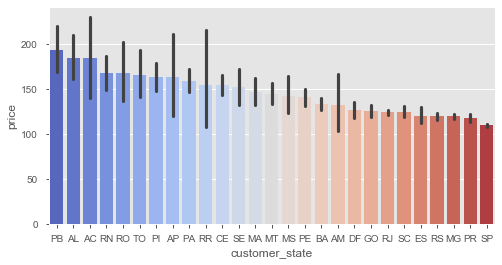

In [36]:
plt.figure(figsize=(8,4))
sns.barplot(x = 'customer_state',y='price',data = df_train_save, order = df_train_save.groupby('customer_state').agg({'price':'mean'}).sort_values('price',ascending = False).index, palette= "coolwarm")
plt.savefig('Orderprice_state.eps',bbox_inches = 'tight')

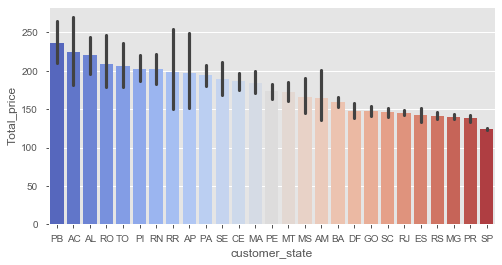

In [37]:
plt.figure(figsize=(8,4))
sns.barplot(x = 'customer_state',y='Total_price',data = df_train_save, order = df_train_save.groupby('customer_state').agg({'Total_price':'mean'}).sort_values('Total_price',ascending = False).index, palette= "coolwarm")

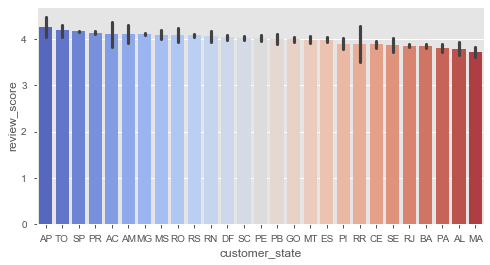

In [38]:
plt.figure(figsize=(8,4))
sns.barplot(x = 'customer_state',y='review_score',data = df_train_save, order = df_train_save.groupby('customer_state').agg({'review_score':'mean'}).sort_values('review_score',ascending = False).index, palette= "coolwarm")

In [39]:
df_train_save = df_train_save.astype({"order_status" : 'category', \
                       "order_purchase_timestamp" : 'datetime64[ns]', 
                        "order_approved_at" : 'datetime64[ns]', \
                       "order_delivered_carrier_date" : 'datetime64[ns]', 
                        "order_delivered_customer_date" : 'datetime64[ns]', \
                       "order_estimated_delivery_date" : 'datetime64[ns]', 
                        'review_creation_date':'datetime64[ns]', \
                        "review_answer_timestamp" : 'datetime64[ns]', "shipping_limit_date" : 'datetime64[ns]', \
                        "product_category_name" : 'category', 
                       })

In [40]:
df_train_save

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,order_item_qty,Total_price
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28,1.0,87285b34884572647811a353c7ac498a,...,3a51803cc0d012c3b5dc8b7528cb05f7,3366,sao paulo,SP,9350.0,maua,SP,housewares,1,37.77
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15,1.0,87285b34884572647811a353c7ac498a,...,ef0996a1a279c26e7ecbd737be23d235,2290,sao paulo,SP,9350.0,maua,SP,housewares,1,37.77
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119144,872b07190c0c9c0f13475d2141c4036a,814605f2161337c56520639099b0199f,delivered,2018-07-03 10:10:12,2018-07-05 16:22:38,2018-07-03 12:00:00,2018-07-10 17:18:49,2018-08-02,2.0,97de49733ccaac64d122444d8db709d1,...,c5df80808db02b2e08abd92b9d964b9b,66033,belem,PA,5201.0,sao paulo,SP,books_imported,1,84.36
119145,522eec5aa38ae3153b1c1a94e013947e,39eda8beee70b851aa9ba9040fb44615,delivered,2018-07-05 16:25:40,2018-07-06 02:35:18,2018-07-06 10:27:00,2018-07-09 18:16:53,2018-07-27,1.0,5b668636d65ddf4e4109c6d8fb13ea56,...,9790c90c5b3a1a5237c11433331af1cb,83206,paranagua,PR,5201.0,sao paulo,SP,books_imported,1,63.41
119147,1dbff949801376b8795a093d31cfe205,0cbd2df3d6e9d8b1eaf5cfefc44886bc,delivered,2018-05-16 14:50:54,2018-05-16 15:18:42,2018-05-18 12:10:00,2018-05-21 17:14:08,2018-05-28,1.0,90797f195eb7bb9dae050697a25f35ce,...,1de8fb735d8252498d9a2f82a68c57e0,9411,ribeirao pires,SP,5201.0,sao paulo,SP,books_imported,1,66.38
119148,6775b950cdc4da0ce39b261032f92c84,c4d135422be0d4333f506acde8af9419,delivered,2018-06-13 12:19:26,2018-06-13 17:39:14,2018-06-15 13:09:00,2018-06-16 17:48:30,2018-06-28,1.0,3e72533d34a1779d818ac8a73403387c,...,5f684afb3d1a02f2787e80cb0eee6e02,2927,sao paulo,SP,5201.0,sao paulo,SP,books_imported,1,31.42


In [41]:
print('Most recent purchase is from:')
print(df_train_save['order_approved_at'].max())

print('Least recent purchase is from :')
print(df_train_save['order_approved_at'].min())


lastDate = df_train_save['order_approved_at'].max()
df_train_save['PurchaseDate'] = df_train_save['order_approved_at']

Most recent purchase is from:
2018-08-29 15:10:26
Least recent purchase is from :
2016-10-04 09:43:32


In [42]:
df_train_save = df_train_save.drop_duplicates()

In [43]:
df_train_save.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 114050 entries, 0 to 119149
Data columns (total 41 columns):
order_id                         114050 non-null object
customer_id                      114050 non-null object
order_status                     114050 non-null category
order_purchase_timestamp         114050 non-null datetime64[ns]
order_approved_at                114050 non-null datetime64[ns]
order_delivered_carrier_date     114050 non-null datetime64[ns]
order_delivered_customer_date    114050 non-null datetime64[ns]
order_estimated_delivery_date    114050 non-null datetime64[ns]
order_item_id                    114050 non-null float64
product_id                       114050 non-null object
seller_id                        114050 non-null object
shipping_limit_date              114050 non-null datetime64[ns]
price                            114050 non-null float64
freight_value                    114050 non-null float64
payment_sequential               114050 non-null flo

In [44]:
df_train_save

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,customer_zip_code_prefix,customer_city,customer_state,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,order_item_qty,Total_price,PurchaseDate
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,3149,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71,2017-10-02 11:07:15
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,3149,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71,2017-10-02 11:07:15
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,3149,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71,2017-10-02 11:07:15
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28,1.0,87285b34884572647811a353c7ac498a,...,3366,sao paulo,SP,9350.0,maua,SP,housewares,1,37.77,2017-08-15 20:05:16
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15,1.0,87285b34884572647811a353c7ac498a,...,2290,sao paulo,SP,9350.0,maua,SP,housewares,1,37.77,2017-08-02 18:43:15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119144,872b07190c0c9c0f13475d2141c4036a,814605f2161337c56520639099b0199f,delivered,2018-07-03 10:10:12,2018-07-05 16:22:38,2018-07-03 12:00:00,2018-07-10 17:18:49,2018-08-02,2.0,97de49733ccaac64d122444d8db709d1,...,66033,belem,PA,5201.0,sao paulo,SP,books_imported,1,84.36,2018-07-05 16:22:38
119145,522eec5aa38ae3153b1c1a94e013947e,39eda8beee70b851aa9ba9040fb44615,delivered,2018-07-05 16:25:40,2018-07-06 02:35:18,2018-07-06 10:27:00,2018-07-09 18:16:53,2018-07-27,1.0,5b668636d65ddf4e4109c6d8fb13ea56,...,83206,paranagua,PR,5201.0,sao paulo,SP,books_imported,1,63.41,2018-07-06 02:35:18
119147,1dbff949801376b8795a093d31cfe205,0cbd2df3d6e9d8b1eaf5cfefc44886bc,delivered,2018-05-16 14:50:54,2018-05-16 15:18:42,2018-05-18 12:10:00,2018-05-21 17:14:08,2018-05-28,1.0,90797f195eb7bb9dae050697a25f35ce,...,9411,ribeirao pires,SP,5201.0,sao paulo,SP,books_imported,1,66.38,2018-05-16 15:18:42
119148,6775b950cdc4da0ce39b261032f92c84,c4d135422be0d4333f506acde8af9419,delivered,2018-06-13 12:19:26,2018-06-13 17:39:14,2018-06-15 13:09:00,2018-06-16 17:48:30,2018-06-28,1.0,3e72533d34a1779d818ac8a73403387c,...,2927,sao paulo,SP,5201.0,sao paulo,SP,books_imported,1,31.42,2018-06-13 17:39:14


In [45]:
rfmTable = df_train_save.groupby('customer_unique_id').agg({'PurchaseDate': lambda x: (lastDate - x.max()).days,
                                                            'Total_price': lambda x: x.sum()})

rfmTable['PurchaseDate'] = rfmTable['PurchaseDate'].astype(int)
rfmTable['PurchaseNo'] = df_train_save.groupby('customer_unique_id').apply(lambda x : len(x))
rfmTable.rename(columns={'PurchaseDate': 'recency', 
                         'PurchaseNo': 'frequency', 
                         'Total_price': 'monetary'}, inplace=True)

rfmTable.head()

,recency,monetary,frequency
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,141.90,1
0000b849f77a49e4a4ce2b2a4ca5be3f,113,27.19,1
0000f46a3911fa3c0805444483337064,536,86.22,1
0000f6ccb0745a6a4b88665a16c9f078,320,43.62,1
0004aac84e0df4da2b147fca70cf8255,287,196.89,1


In [46]:
rfmTable

,recency,monetary,frequency
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,141.90,1
0000b849f77a49e4a4ce2b2a4ca5be3f,113,27.19,1
0000f46a3911fa3c0805444483337064,536,86.22,1
0000f6ccb0745a6a4b88665a16c9f078,320,43.62,1
0004aac84e0df4da2b147fca70cf8255,287,196.89,1
...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,446,2067.42,2
fffea47cd6d3cc0a88bd621562a9d061,261,84.58,1
ffff371b4d645b6ecea244b27531430a,567,112.46,1


In [47]:
rfmTable.sort_values(['monetary'],ascending=False)

,recency,monetary,frequency
customer_unique_id,,,
0a0a92112bd4c708ca5fde585afaa872,330,13664.08,8
c4b224d2c784bae11ae98b6ae9f2454c,457,11111.40,15
85963fd37bfd387aa6d915d8a1065486,189,10553.28,24
be74c431147c32ab2d7c7cef5e4a995f,110,10055.22,7
edf81e1f3070b9dac83ec83dacdbb9bc,497,8389.52,2
...,...,...,...
809ca96e9696b9be5f69cd7ae803049d,456,12.28,1
6f5b9d1cdccc4d28f0483a612edecacf,360,11.63,1
2878e5b88167faab17d4fb83a986d38b,303,11.63,1


In [48]:
rfmTableformerge = rfmTable.copy()
rfmTableformerge

,recency,monetary,frequency
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,141.90,1
0000b849f77a49e4a4ce2b2a4ca5be3f,113,27.19,1
0000f46a3911fa3c0805444483337064,536,86.22,1
0000f6ccb0745a6a4b88665a16c9f078,320,43.62,1
0004aac84e0df4da2b147fca70cf8255,287,196.89,1
...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,446,2067.42,2
fffea47cd6d3cc0a88bd621562a9d061,261,84.58,1
ffff371b4d645b6ecea244b27531430a,567,112.46,1


Now, we have to calculate the scores.

We order the data by frequency in descending mode. Then, we divide the number of buyers on the data set by 5. We assign a number from 5 to 1 to each one of the previously created segments. Same for monetary and recency columns too.

For the recency column, since the most recent orders are better, we will order it as ascending.

# Create f_score

f_score = []
m_score = []
r_score = []

columns = ['frequency', 'monetary']
scores_str = ['f_quartile', 'm_quartile']
scores = [f_score, m_score]
N = rfmTable.shape[0] #number of customers

for n in range(len(columns)):
    # Order by column
    rfmTable = rfmTable.sort_values(columns[n], ascending=False)
    
    # Create new index
    refs = np.arange(N)
    rfmTable['refs'] = list(refs)
    
    segment = int(N / 5)
    # Add score
    for i, row in rfmTable.iterrows():
        if row['refs'] <= segment:
            scores[n].append(5)
        elif row['refs'] > segment and row['refs'] <= segment*2:
            scores[n].append(4)
        elif row['refs'] > segment*2 and row['refs'] <= segment*3:
            scores[n].append(3)
        elif row['refs'] > segment*3 and row['refs'] <= segment*4:
            scores[n].append(2)
        else: 
            scores[n].append(1)

    # Create f_score column
    rfmTable[scores_str[n]] = scores[n]
    
# For recency, we do the opposite: most recents are better, so we order as ascending
rfmTable = rfmTable.sort_values('recency', ascending=True)
    
# Recreate index
refs = np.arange(N)
rfmTable['refs'] = refs
    
# Add score
for i, row in rfmTable.iterrows():
    if row['refs'] <= segment:
        r_score.append(5)
    elif row['refs'] > segment and row['refs'] <= segment*2:
        r_score.append(4)
    elif row['refs'] > segment*2 and row['refs'] <= segment*3:
        r_score.append(3)
    elif row['refs'] > segment*3 and row['refs'] <= segment*4:
        r_score.append(2)
    else: 
        r_score.append(1)

# Create r_score column
rfmTable['r_quartile'] = r_score

In [49]:
r_labels = range(5, 0, -1)
r_quartiles = pd.qcut(rfmTable['recency'], 5, labels = r_labels)
rfmTable = rfmTable.assign(R = r_quartiles.values)

The problem is that pandas.qcut chooses the bins so that you have the same number of records in each bin/quantile, but the same value cannot fall in multiple bins/quantiles.

The solutions are:

1 - Use pandas >= 0.20.0 that has this fix. They added an option duplicates='raise'|'drop' to control whether to raise on duplicated edges or to drop them, which would result in less bins than specified, and some larger (with more elements) than others.

2 - Use pandas.cut that chooses the bins to be evenly spaced according to the values themselves, while pandas.qcut chooses the bins so that you have the same number of records in each bin

3 - Decrease the number of quantiles. Less quantiles means more elements per quantile

4 - Specify a custom quantiles range, e.g. [0, .50, .75, 1.] to get unequal number of items per quantile

5 - Rank your data with DataFrame.rank(method='first'). The ranking assigns a unique value to each element in the dataframe (the rank) while keeping the order of the elements (except for identical values, which will be ranked in order they appear in the array, see method='first'). This fixes the issue but you might have that identical (pre-ranking) values go into different quantiles, which can be correct or not depending on your intent.

In [50]:
f_labels = range(1,6)
m_labels = range(1,6)
f_quartiles = pd.qcut(rfmTable['frequency'].rank(method='first'), 5, labels = f_labels, duplicates='drop')
m_quartiles = pd.qcut(rfmTable['monetary'].rank(method='first'), 5, labels = m_labels, duplicates='drop')
rfmTable = rfmTable.assign(F = f_quartiles.values)
rfmTable = rfmTable.assign(M = m_quartiles.values)

In [51]:
rfmTable

,recency,monetary,frequency,R,F,M
customer_unique_id,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,141.90,1,4,1,4
0000b849f77a49e4a4ce2b2a4ca5be3f,113,27.19,1,4,1,1
0000f46a3911fa3c0805444483337064,536,86.22,1,1,1,2
0000f6ccb0745a6a4b88665a16c9f078,320,43.62,1,2,1,1
0004aac84e0df4da2b147fca70cf8255,287,196.89,1,2,1,4
...,...,...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,446,2067.42,2,1,5,5
fffea47cd6d3cc0a88bd621562a9d061,261,84.58,1,3,5,2
ffff371b4d645b6ecea244b27531430a,567,112.46,1,1,5,3


In [52]:
def join_rfm(x): return str(x['R']) + str(x['F']) + str(x['M'])
rfmTable['RFM_Segment'] = rfmTable.apply(join_rfm, axis=1)
rfmTable['RFM_Score'] = rfmTable[['R','F','M']].sum(axis=1)
rfmTable = rfmTable[['recency','frequency','monetary','R','F','M','RFM_Segment','RFM_Score']]

In [53]:
rfmTable

,recency,frequency,monetary,R,F,M,RFM_Segment,RFM_Score
customer_unique_id,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,4,1,4,414,9.0
0000b849f77a49e4a4ce2b2a4ca5be3f,113,1,27.19,4,1,1,411,6.0
0000f46a3911fa3c0805444483337064,536,1,86.22,1,1,2,112,4.0
0000f6ccb0745a6a4b88665a16c9f078,320,1,43.62,2,1,1,211,4.0
0004aac84e0df4da2b147fca70cf8255,287,1,196.89,2,1,4,214,7.0
...,...,...,...,...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,446,2,2067.42,1,5,5,155,11.0
fffea47cd6d3cc0a88bd621562a9d061,261,1,84.58,3,5,2,352,10.0
ffff371b4d645b6ecea244b27531430a,567,1,112.46,1,5,3,153,9.0


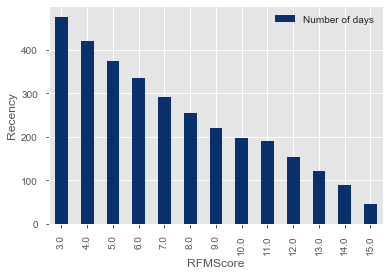

In [54]:
group_data = rfmTable.groupby('RFM_Score').agg('recency').mean().plot(kind='bar', colormap='Blues_r')
_ = group_data.set(xlabel = 'RFMScore', ylabel = 'Recency'), group_data.legend(['Number of days']) # you can add labels and legend
plt.show()

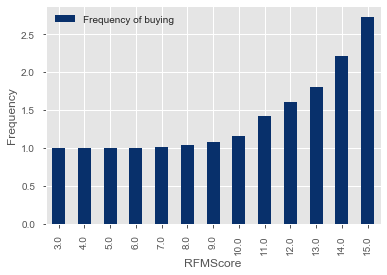

In [55]:
group_data = rfmTable.groupby('RFM_Score').agg('frequency').mean().plot(kind='bar', colormap='Blues_r')
_ = group_data.set(xlabel = 'RFMScore', ylabel = 'Frequency'), group_data.legend(['Frequency of buying']) # you can add labels and legend
plt.show()

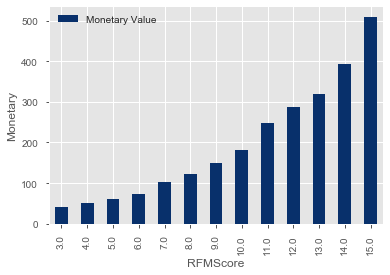

In [56]:
group_data = rfmTable.groupby('RFM_Score').agg('monetary').mean().plot(kind='bar', colormap='Blues_r')
_ = group_data.set(xlabel = 'RFMScore', ylabel = 'Monetary'), group_data.legend(['Monetary Value']) # you can add labels and legend
plt.show()

In [57]:
#top 10 buyers
top10 = rfmTable[rfmTable['RFM_Segment'] == '555'].sort_values('monetary', ascending=False).head(10)

In [58]:
top10

,recency,frequency,monetary,R,F,M,RFM_Segment,RFM_Score
customer_unique_id,,,,,,,,
58483a1c055dfb600f57c5b867174542,85,2,8068.88,5,5,5,555,15.0
301d1ce5a76b7e1bc47e5115bf5eb6ba,63,14,7413.70,5,5,5,555,15.0
763c8b1c9c68a0229c42c9fc6f662b93,43,4,7274.88,5,5,5,555,15.0
c8460e4251689ba205045f3ea17884a1,20,24,4655.88,5,5,5,555,15.0
c7794313e2cd53472b116a751350f132,11,2,4646.50,5,5,5,555,15.0
a229eba70ec1c2abef51f04987deb7a5,87,2,4445.50,5,5,5,555,15.0
a22ee6bd65e350c2d1a0d9a12c2e465f,10,2,4029.98,5,5,5,555,15.0
ac32c69c438fa163767f5aa5c4d0b6e1,86,2,3851.54,5,5,5,555,15.0
1a3d1e8b28c0ee27c23333ee108c47e6,60,2,3848.06,5,5,5,555,15.0


In [59]:
#bottom 10 buyers
bottom10 = rfmTable[rfmTable['RFM_Segment'] == '111'].sort_values('monetary', ascending=True).head(10)

In [60]:
bottom10

,recency,frequency,monetary,R,F,M,RFM_Segment,RFM_Score
customer_unique_id,,,,,,,,
0651cfbea51afc6cfa5ec45bca3ee692,468,1,14.78,1,1,1,111,3.0
1b10d58aef8d0d26651c02d40f765cae,573,1,15.29,1,1,1,111,3.0
04544a89f79714c0abcc3ae49e884209,579,1,15.71,1,1,1,111,3.0
1c259d4575f154dccfefa0576b0ca987,596,1,16.62,1,1,1,111,3.0
138a438f32cfcf511ec5d75b693d6a22,512,1,16.96,1,1,1,111,3.0
2a2a3fad75a86811325aa30582b160a2,438,1,17.78,1,1,1,111,3.0
07419d54dffccb90ca99b24abe65e5fc,573,1,18.22,1,1,1,111,3.0
34931d0770cb9c070c594855e05b3fb7,495,1,18.25,1,1,1,111,3.0
2fc88e2d49726199dfbd3b2b86298d72,547,1,18.76,1,1,1,111,3.0


In [61]:
print("Best Buyers: ",len(rfmTable[rfmTable['RFM_Segment'] == '555']))
print('Active Buyers:', len(rfmTable[rfmTable['F'] == 5]))
print("Big Money Spenders: ",len(rfmTable[rfmTable['M']==5]))
print('Inactive Buyers: ',len(rfmTable[rfmTable['R']==1]))
print('Inactive and Cheap Buyers: ',len(rfmTable[rfmTable['RFM_Segment']=='111']))
print('Total Number of Buyers : ', rfmTable.shape[0])

Best Buyers:  1398
Active Buyers: 18413
Big Money Spenders:  18413
Inactive Buyers:  18331
Inactive and Cheap Buyers:  866
Total Number of Buyers :  92062


In [62]:
rfmTable.groupby('RFM_Segment').size().sort_values(ascending=False)[:10]

RFM_Segment
455    1407
255    1403
555    1398
355    1369
155    1323
254     927
222     913
354     906
341     902
541     893
dtype: int64

In [63]:
rfmTable.groupby('RFM_Score').agg({
'recency': 'mean',
'frequency': 'mean',
'monetary': ['mean', 'count'] }).round(1)

recency frequency monetary       
             mean      mean     mean  count
RFM_Score                                  
3.0         475.8       1.0     39.8    866
4.0         420.0       1.0     50.8   2531
5.0         374.8       1.0     61.6   4931
6.0         335.2       1.0     73.5   7952
7.0         291.5       1.0    102.1  11032
8.0         253.5       1.0    123.5  12735
9.0         220.9       1.1    149.7  13130
10.0        195.9       1.2    181.9  12131
11.0        190.1       1.4    248.8  10427
12.0        153.5       1.6    286.5   7326
13.0        121.2       1.8    319.4   4786
14.0         88.6       2.2    393.9   2817
15.0         46.3       2.7    509.9   1398

In [64]:
def segment_me(df):
    if df['RFM_Score'] >= 9:
        return '1.Gold'
    elif (df['RFM_Score'] >= 5) and (df['RFM_Score'] < 9):
        return '2.Silver'
    else:
        return '3.Bronze'

In [65]:
rfmTable['General_Segment'] = rfmTable.apply(segment_me, axis=1)

In [66]:
rfmTable.groupby('General_Segment').agg({
'recency': 'mean',
'frequency': 'mean',
'monetary': ['mean', 'count']
}).sort_values('General_Segment',ascending=True).round(1)

recency frequency monetary       
                   mean      mean     mean  count
General_Segment                                  
1.Gold            178.4       1.4    234.9  52015
2.Silver          299.0       1.0     97.9  36650
3.Bronze          434.2       1.0     48.0   3397

In [67]:
rfmTable.describe()

,recency,frequency,monetary,RFM_Score
count,92062.000000,92062.000000,92062.000000,92062.000000
mean,235.823130,1.238839,173.441382,9.003802
std,152.588041,0.847712,259.032565,2.592775
min,0.000000,1.000000,10.070000,3.000000
25%,112.000000,1.000000,64.000000,7.000000
50%,217.000000,1.000000,110.320000,9.000000
75%,344.000000,1.000000,188.720000,11.000000
max,694.000000,75.000000,13664.080000,15.000000


In [68]:
rfmTable.info()

<class 'pandas.core.frame.DataFrame'>
Index: 92062 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 9 columns):
recency            92062 non-null int32
frequency          92062 non-null int64
monetary           92062 non-null float64
R                  92062 non-null category
F                  92062 non-null category
M                  92062 non-null category
RFM_Segment        92062 non-null object
RFM_Score          92062 non-null float64
General_Segment    92062 non-null object
dtypes: category(3), float64(2), int32(1), int64(1), object(2)
memory usage: 7.3+ MB


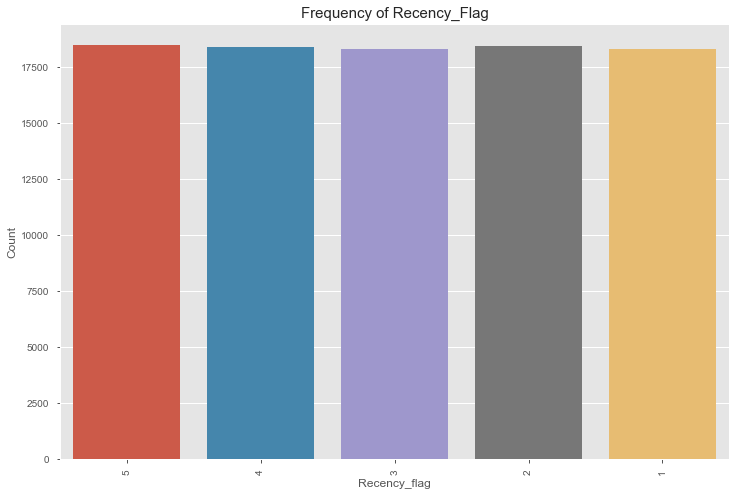

In [69]:
plt.figure(figsize=(12,8))
sns.countplot(x='R', data=rfmTable)
plt.ylabel('Count', fontsize=12)
plt.xlabel('Recency_flag', fontsize=12)
plt.xticks(rotation='vertical')
plt.title('Frequency of Recency_Flag', fontsize=15)
plt.show()

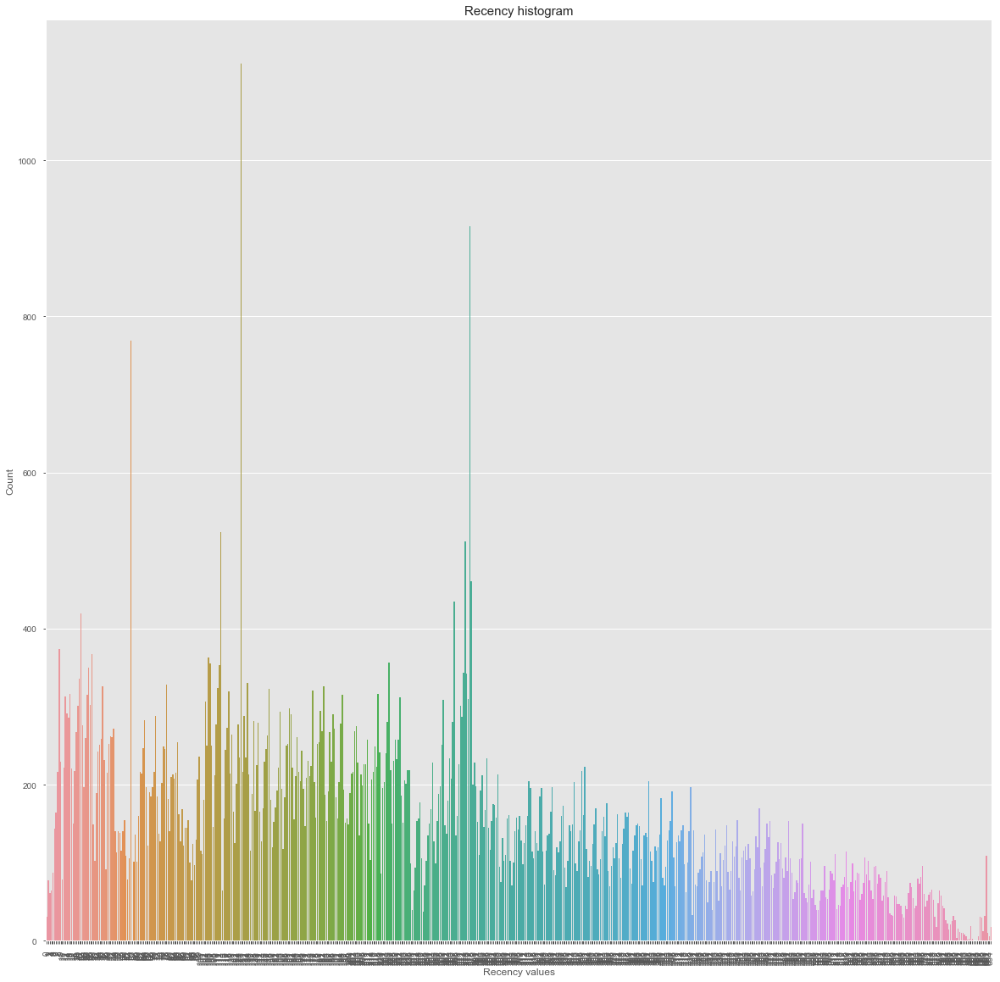

In [70]:
plt.figure(figsize=(20,20))
sns.countplot(x='recency', data=rfmTable)
plt.ylabel('Count', fontsize=12)
plt.xlabel('Recency values', fontsize=12)
plt.xticks(rotation='vertical')
plt.title('Recency histogram', fontsize=15)
plt.show()

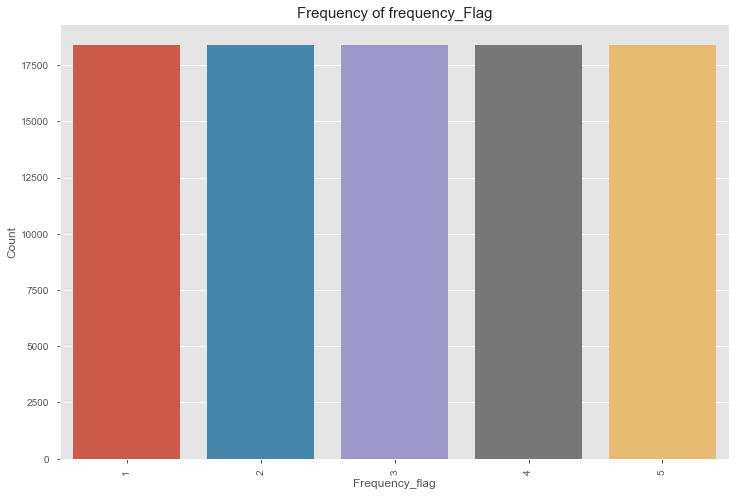

In [71]:
plt.figure(figsize=(12,8))
sns.countplot(x='F', data=rfmTable)
plt.ylabel('Count', fontsize=12)
plt.xlabel('Frequency_flag', fontsize=12)
plt.xticks(rotation='vertical')
plt.title('Frequency of frequency_Flag', fontsize=15)
plt.show()

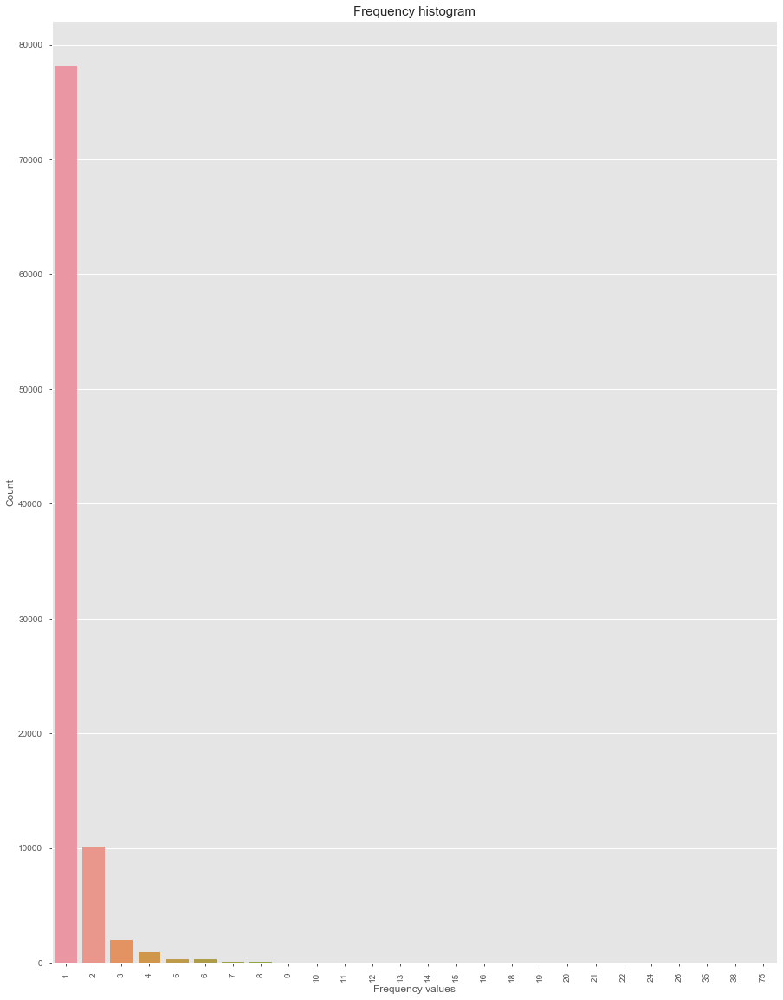

In [72]:
plt.figure(figsize=(15,20))
sns.countplot(x='frequency', data=rfmTable)
plt.ylabel('Count', fontsize=12)
plt.xlabel('Frequency values', fontsize=12)
plt.xticks(rotation='vertical')
plt.title('Frequency histogram', fontsize=15)
plt.show()

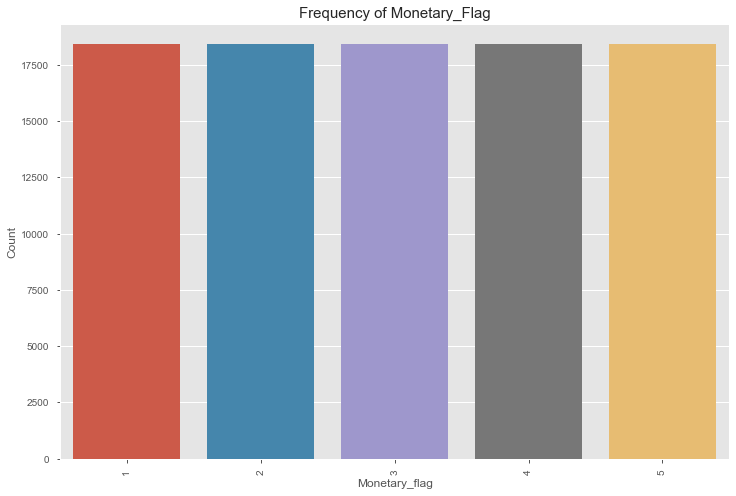

In [73]:
plt.figure(figsize=(12,8))
sns.countplot(x='M', data=rfmTable)
plt.ylabel('Count', fontsize=12)
plt.xlabel('Monetary_flag', fontsize=12)
plt.xticks(rotation='vertical')
plt.title('Frequency of Monetary_Flag', fontsize=15)
plt.show()

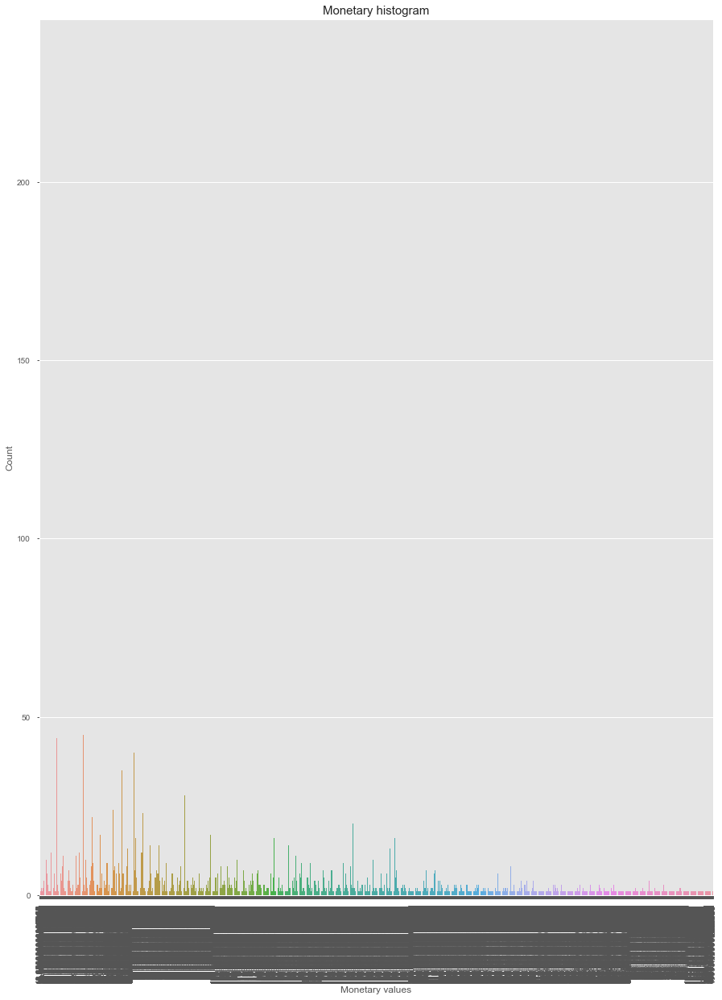

In [74]:
plt.figure(figsize=(15,20))
sns.countplot(x='monetary', data=rfmTable)
plt.ylabel('Count', fontsize=12)
plt.xlabel('Monetary values', fontsize=12)
plt.xticks(rotation='vertical')
plt.title('Monetary histogram', fontsize=15)
plt.show()

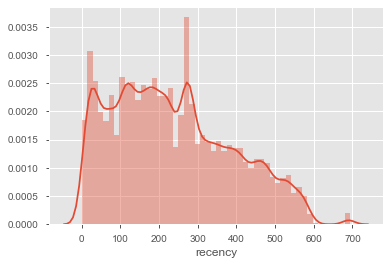

In [75]:
sns.distplot(rfmTable['recency'])
plt.show()

In [76]:
rfmTable[(rfmTable['recency'] > 600) & (rfmTable['recency']<=700)].sort_values(by='recency',ascending=True)

,recency,frequency,monetary,R,F,M,RFM_Segment,RFM_Score,General_Segment
customer_unique_id,,,,,,,,,
f7b981e8a280e455ac3cbe0d5d171bd1,601,2,39.24,1,5,1,151,7.0,2.Silver
7a176e5d88c7acb6000a055e008c055d,684,4,1047.38,1,5,5,155,11.0,1.Gold
1fe76010d06f4c73ed78f3a7d469d93e,685,1,34.42,1,1,1,111,3.0,3.Bronze
4f3865fa2a981933ea86fc691d97f643,686,1,86.92,1,2,2,122,5.0,2.Silver
7965955995b477fd7c304f4caf2c6d26,686,1,40.86,1,3,1,131,5.0,2.Silver
...,...,...,...,...,...,...,...,...,...
3f4f614c632af7fc7508462a7cb55ac2,694,1,18.62,1,2,1,121,4.0,3.Bronze
7390ed59fa1febbfda31a80b4318c8cb,694,1,154.57,1,2,4,124,7.0,2.Silver
4be873e3bf0455763882101d7eccc78c,694,1,214.98,1,2,4,124,7.0,2.Silver


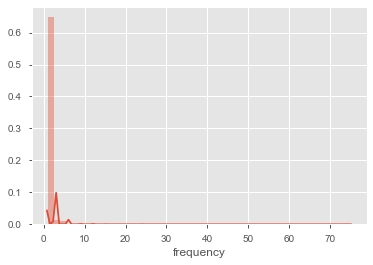

In [77]:
sns.distplot(rfmTable['frequency'])
plt.show()

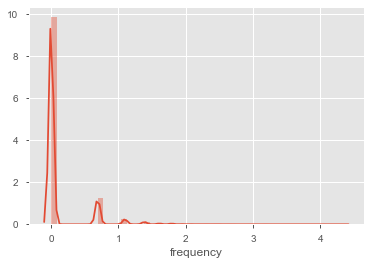

In [78]:
frequency_log= np.log(rfmTable['frequency'])
sns.distplot(frequency_log)
plt.show()

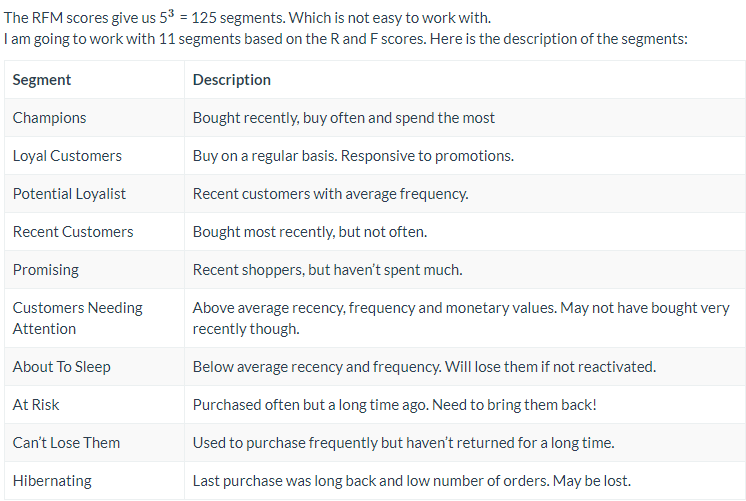

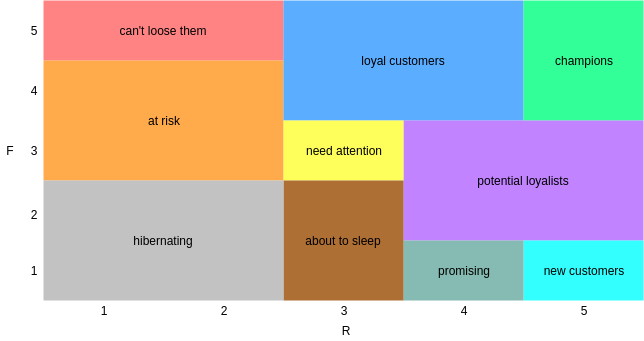

In [79]:
segt_map = {
    r'[1-2][1-2]': 'hibernating',
    r'[1-2][3-4]': 'at risk',
    r'[1-2]5': 'can\'t loose',
    r'3[1-2]': 'about to sleep',
    r'33': 'need attention',
    r'[3-4][4-5]': 'loyal customers',
    r'41': 'promising',
    r'51': 'new customers',
    r'[4-5][2-3]': 'potential loyalists',
    r'5[4-5]': 'champions'
}

rfmTable['Segment'] = rfmTable['R'].astype(str)+rfmTable['F'].astype(str)
rfmTable['Segment'] = rfmTable['Segment'].replace(segt_map, regex=True)
rfmTable.head()

,recency,frequency,monetary,R,F,M,RFM_Segment,RFM_Score,General_Segment,Segment
customer_unique_id,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,4,1,4,414,9.0,1.Gold,promising
0000b849f77a49e4a4ce2b2a4ca5be3f,113,1,27.19,4,1,1,411,6.0,2.Silver,promising
0000f46a3911fa3c0805444483337064,536,1,86.22,1,1,2,112,4.0,3.Bronze,hibernating
0000f6ccb0745a6a4b88665a16c9f078,320,1,43.62,2,1,1,211,4.0,3.Bronze,hibernating
0004aac84e0df4da2b147fca70cf8255,287,1,196.89,2,1,4,214,7.0,2.Silver,hibernating


In [80]:
rfmTable.sort_values('General_Segment',ascending=True)

,recency,frequency,monetary,R,F,M,RFM_Segment,RFM_Score,General_Segment,Segment
customer_unique_id,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,4,1,4,414,9.0,1.Gold,promising
be40dd02e486b93b8b4128f2715cfdfe,139,1,100.46,4,4,3,443,11.0,1.Gold,loyal customers
6a80a86f478a93a5f4c7ba8db6441a6b,398,8,685.50,1,5,5,155,11.0,1.Gold,can't loose
6a80dd4b607ce488b1ee3d586d884776,266,2,92.20,3,5,3,353,11.0,1.Gold,loyal customers
6a81fb4e2dc07a9b711cd73142689ee7,204,2,43.30,3,5,1,351,9.0,1.Gold,loyal customers
...,...,...,...,...,...,...,...,...,...,...
1e2b9640573092012db0906fd256112c,365,1,33.10,2,1,1,211,4.0,3.Bronze,hibernating
3da51adff0de3e116ebdbeecba9a6a6d,523,1,49.51,1,2,1,121,4.0,3.Bronze,hibernating
0d72697a4108378b07a8c32d8c6181fd,435,1,86.73,1,1,2,112,4.0,3.Bronze,hibernating


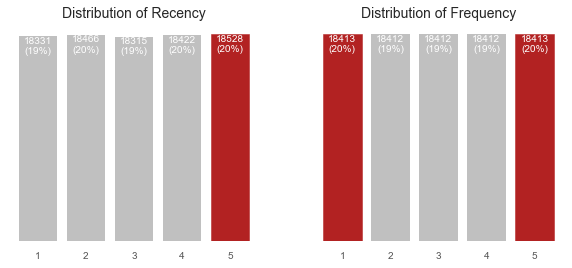

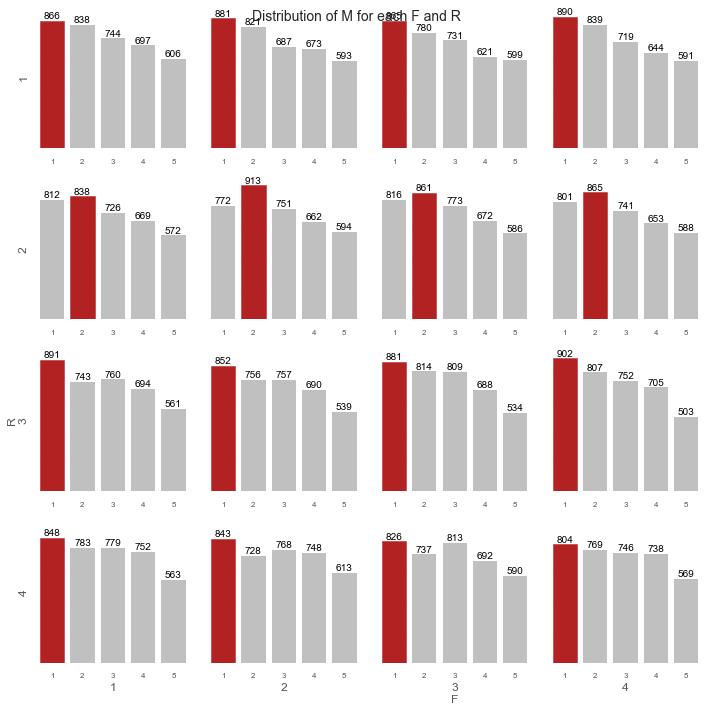

In [81]:
# plot the distribution of customers over R and F
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

for i, p in enumerate(['R', 'F']):
    parameters = {'R':'Recency', 'F':'Frequency'}
    y = rfmTable[p].value_counts().sort_index()
    x = y.index
    ax = axes[i]
    bars = ax.bar(x, y, color='silver')
    ax.set_frame_on(False)
    ax.tick_params(left=False, labelleft=False, bottom=False)
    ax.set_title('Distribution of {}'.format(parameters[p]),
                fontsize=14)
    for bar in bars:
        value = bar.get_height()
        if value == y.max():
            bar.set_color('firebrick')
        ax.text(bar.get_x() + bar.get_width() / 2,
                value - 5,
                '{}\n({}%)'.format(int(value), int(value * 100 / y.sum())),
               ha='center',
               va='top',
               color='w')
        
plt.show()

# plot the distribution of M for RF score
fig, axes = plt.subplots(nrows=4, ncols=4,
                         sharex=False, sharey=True,
                         figsize=(10, 10))

r_range = range(1, 5)
f_range = range(1, 5)
for r in r_range:
    for f in f_range:
        y = rfmTable[(rfmTable['R'] == r) & (rfmTable['F'] == f)]['M'].value_counts().sort_index()
        x = y.index
        ax = axes[r - 1, f - 1]
        bars = ax.bar(x, y, color='silver')
        if r == 4:
            if f == 3:
                ax.set_xlabel('{}\nF'.format(f), va='top')
            else:
                ax.set_xlabel('{}\n'.format(f), va='top')
        if f == 1:
            if r == 3:
                ax.set_ylabel('R\n{}'.format(r))
            else:
                ax.set_ylabel(r)
        ax.set_frame_on(False)
        ax.tick_params(left=False, labelleft=False, bottom=False)
        ax.set_xticks(x)
        ax.set_xticklabels(x, fontsize=8)

        for bar in bars:
            value = bar.get_height()
            if value == y.max():
                bar.set_color('firebrick')
            ax.text(bar.get_x() + bar.get_width() / 2,
                    value,
                    int(value),
                    ha='center',
                    va='bottom',
                    color='k')
fig.suptitle('Distribution of M for each F and R',
             fontsize=14)
plt.tight_layout()
plt.show()

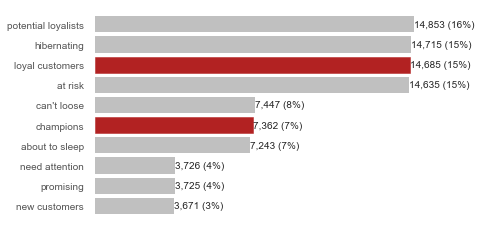

In [82]:
# count the number of customers in each segment
segments_counts = rfmTable['Segment'].value_counts().sort_values(ascending=True)

fig, ax = plt.subplots()

bars = ax.barh(range(len(segments_counts)),
              segments_counts,
              color='silver')
ax.set_frame_on(False)
ax.tick_params(left=False,
               bottom=False,
               labelbottom=False)
ax.set_yticks(range(len(segments_counts)))
ax.set_yticklabels(segments_counts.index)

for i, bar in enumerate(bars):
        value = bar.get_width()
        if segments_counts.index[i] in ['champions', 'loyal customers']:
            bar.set_color('firebrick')
        ax.text(value,
                bar.get_y() + bar.get_height()/2,
                '{:,} ({:}%)'.format(int(value),
                                   int(value*100/segments_counts.sum())),
                va='center',
                ha='left'
               )

plt.show()

In [83]:
rfmTable2=rfmTable.copy()

In [84]:
# define function for the values below 0
def neg_to_zero(x):
    if x <= 0:
        return 1
    else:
        return x
# apply the function to Recency and MonetaryValue column 
rfmTable['recency'] = [neg_to_zero(x) for x in rfmTable.recency]
rfmTable['monetary'] = [neg_to_zero(x) for x in rfmTable.monetary]
# unskew the data
rfm_log = rfmTable[['recency', 'frequency', 'monetary']].apply(np.log, axis = 1).round(3)

In [85]:
# scale the data
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_log)
# transform into a dataframe
rfm_scaled = pd.DataFrame(rfm_scaled, index = rfmTable.index, columns = rfm_log.columns)

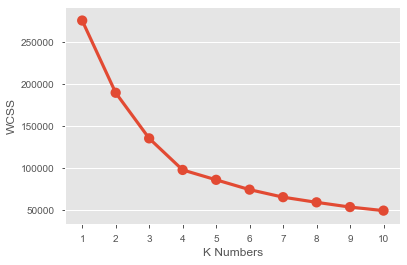

In [86]:
# the Elbow method
wcss = {}
for k in range(1, 11):
    kmeans = KMeans(n_clusters= k, init= 'k-means++', max_iter= 300)
    kmeans.fit(rfm_scaled)
    wcss[k] = kmeans.inertia_
# plot the WCSS values
sns.pointplot(x = list(wcss.keys()), y = list(wcss.values()))
plt.xlabel('K Numbers')
plt.ylabel('WCSS')
plt.show()

In [87]:
# clustering
clus = KMeans(n_clusters= 3, init= 'k-means++', max_iter= 300)
clus.fit(rfm_scaled)
# Assign the clusters to datamart
rfmTable2['K_Cluster'] = clus.labels_
rfmTable2.head()

,recency,frequency,monetary,R,F,M,RFM_Segment,RFM_Score,General_Segment,Segment,K_Cluster
customer_unique_id,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,4,1,4,414,9.0,1.Gold,promising,1
0000b849f77a49e4a4ce2b2a4ca5be3f,113,1,27.19,4,1,1,411,6.0,2.Silver,promising,1
0000f46a3911fa3c0805444483337064,536,1,86.22,1,1,2,112,4.0,3.Bronze,hibernating,1
0000f6ccb0745a6a4b88665a16c9f078,320,1,43.62,2,1,1,211,4.0,3.Bronze,hibernating,1
0004aac84e0df4da2b147fca70cf8255,287,1,196.89,2,1,4,214,7.0,2.Silver,hibernating,1


In [88]:
# assign cluster column 
rfm_scaled['K_Cluster'] = clus.labels_
rfm_scaled['General_Segment'] = rfmTable2.General_Segment
rfm_scaled.reset_index(inplace = True)
# melt the dataframe
rfm_melted = pd.melt(frame= rfm_scaled, id_vars= ['customer_unique_id', 'General_Segment', 'K_Cluster'], var_name = 'Metrics', value_name = 'Value')
rfm_melted.head()

,customer_unique_id,General_Segment,K_Cluster,Metrics,Value
0,0000366f3b9a7992bf8c76cfdf3221e2,1.Gold,1,recency,-0.433509
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2.Silver,1,recency,-0.416148
2,0000f46a3911fa3c0805444483337064,3.Bronze,1,recency,1.173853
3,0000f6ccb0745a6a4b88665a16c9f078,3.Bronze,1,recency,0.646916
4,0004aac84e0df4da2b147fca70cf8255,2.Silver,1,recency,0.535606


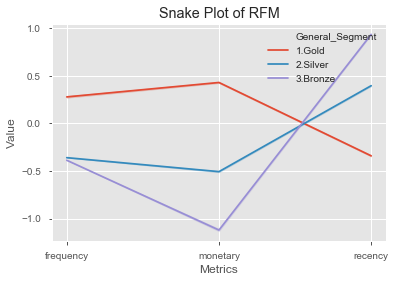

In [89]:
# a snake plot with RFM
sns.lineplot(x = 'Metrics', y = 'Value', hue = 'General_Segment', data = rfm_melted)
plt.title('Snake Plot of RFM')
plt.legend(loc = 'upper right')

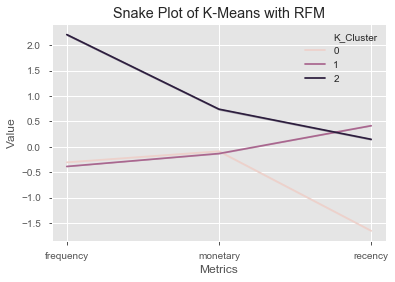

In [90]:
# a snake plot with K-Means
sns.lineplot(x = 'Metrics', y = 'Value', hue = 'K_Cluster', data = rfm_melted)
plt.title('Snake Plot of K-Means with RFM')
plt.legend(loc = 'upper right')

[]

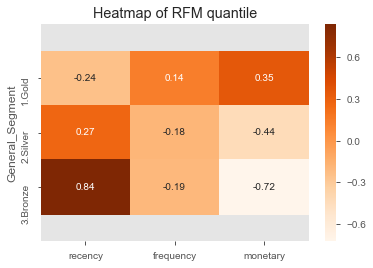

In [91]:
# the mean value in total 
total_avg = rfmTable2.iloc[:, 0:3].mean()
total_avg
# calculate the proportional gap with total mean
cluster_avg = rfmTable2.groupby('General_Segment').mean().iloc[:, 0:3]
prop_rfm = cluster_avg/total_avg - 1
# heatmap with RFM
ax = sns.heatmap(prop_rfm, cmap= 'Oranges', fmt= '.2f', annot = True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.title('Heatmap of RFM quantile')
plt.plot()

[]

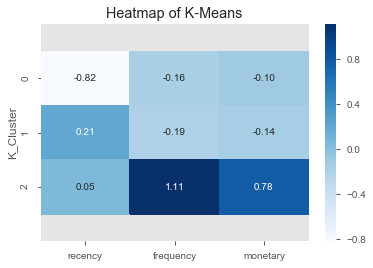

In [92]:
# calculate the proportional gap with total mean
cluster_avg_K = rfmTable2.groupby('K_Cluster').mean().iloc[:, 0:3]
prop_rfm_K = cluster_avg_K/total_avg - 1
# heatmap with K-means
ax = sns.heatmap(prop_rfm_K, cmap= 'Blues', fmt= '.2f', annot = True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.title('Heatmap of K-Means')
plt.plot()

In [93]:
rfmTable2 = rfmTable2.drop(columns={'R','F','M'})

In [94]:
rfmTable2['General_Segment'] = rfmTable2['General_Segment'].astype('category')
rfmTable2['Segment'] = rfmTable2['Segment'].astype('category')


rfmTable2['General_Segment'] = rfmTable2['General_Segment'].cat.codes
rfmTable2['Segment'] = rfmTable2['Segment'].cat.codes
rfmTable2

,recency,frequency,monetary,RFM_Segment,RFM_Score,General_Segment,Segment,K_Cluster
customer_unique_id,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,414,9.0,0,9,1
0000b849f77a49e4a4ce2b2a4ca5be3f,113,1,27.19,411,6.0,1,9,1
0000f46a3911fa3c0805444483337064,536,1,86.22,112,4.0,2,4,1
0000f6ccb0745a6a4b88665a16c9f078,320,1,43.62,211,4.0,2,4,1
0004aac84e0df4da2b147fca70cf8255,287,1,196.89,214,7.0,1,4,1
...,...,...,...,...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,446,2,2067.42,155,11.0,0,2,2
fffea47cd6d3cc0a88bd621562a9d061,261,1,84.58,352,10.0,0,5,1
ffff371b4d645b6ecea244b27531430a,567,1,112.46,153,9.0,0,2,1


In [95]:
df_train_save['payment_value_log'] = df_train_save['payment_value'].apply(lambda x: np.log(x) if x > 0 else 0)
unique_ = df_train_save['order_id'].nunique()
print("DataFrame shape: {}; unique order ids: {}".format(df_train_save.shape, unique_))
df_train_save.head()

DataFrame shape: (114050, 42); unique order ids: 95109


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,customer_city,customer_state,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,order_item_qty,Total_price,PurchaseDate,payment_value_log
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71,2017-10-02 11:07:15,2.897016
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71,2017-10-02 11:07:15,0.693147
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,sao paulo,SP,9350.0,maua,SP,housewares,3,38.71,2017-10-02 11:07:15,2.922624
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28,1.0,87285b34884572647811a353c7ac498a,...,sao paulo,SP,9350.0,maua,SP,housewares,1,37.77,2017-08-15 20:05:16,3.631515
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15,1.0,87285b34884572647811a353c7ac498a,...,sao paulo,SP,9350.0,maua,SP,housewares,1,37.77,2017-08-02 18:43:15,3.631515


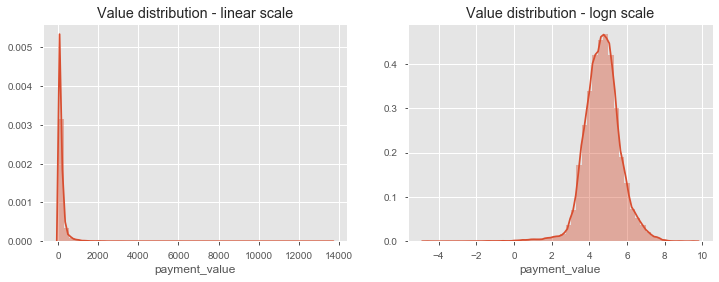

In [96]:
def plot_dist(values, log_values, title, color="#D84E30"):
    fig, axis = plt.subplots(1, 2, figsize=(12,4))
    axis[0].set_title("{} - linear scale".format(title))
    axis[1].set_title("{} - logn scale".format(title))
    ax1 = sns.distplot(values, color=color, ax=axis[0])
    ax2 = sns.distplot(log_values, color=color, ax=axis[1])
log_value = df_train_save.payment_value.apply(lambda x: np.log(x) if x > 0 else 0)
plot_dist(df_train_save.payment_value, log_value, "Value distribution")

In [97]:
df_train_save.describe()

,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,review_score,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_zip_code_prefix,seller_zip_code_prefix,order_item_qty,Total_price,payment_value_log
count,114050.000000,114050.000000,114050.000000,114050.000000,114050.000000,114050.000000,114050.000000,114050.000000,114050.000000,114050.000000,114050.000000,114050.000000,114050.000000,114050.000000,114050.000000,114050.000000,114050.000000,114050.000000,114050.000000
mean,1.197519,119.992893,20.010268,1.090530,2.946611,172.123077,4.067242,48.800815,784.808821,2.206348,2108.469005,30.289698,16.605769,23.105357,35081.035318,24515.543358,1.196107,140.003161,4.681576
std,0.703184,182.356635,15.727301,0.684549,2.781752,266.102671,1.357820,10.017073,650.592971,1.718019,3768.549653,16.158380,13.440306,11.740651,29849.413020,27638.855014,1.198374,189.425775,0.959306
min,1.000000,0.850000,0.000000,1.000000,0.000000,0.000000,1.000000,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000,1003.000000,1001.000000,1.000000,6.080000,-4.605170
25%,1.000000,39.900000,13.080000,1.000000,1.000000,60.952500,4.000000,42.000000,345.000000,1.000000,300.000000,18.000000,8.000000,15.000000,11310.000000,6429.000000,1.000000,55.280000,4.110095
50%,1.000000,74.900000,16.320000,1.000000,2.000000,108.060000,5.000000,52.000000,600.000000,1.000000,700.000000,25.000000,13.000000,20.000000,24320.000000,13660.000000,1.000000,91.790000,4.682687
75%,1.000000,133.000000,21.190000,1.000000,4.000000,189.370000,5.000000,57.000000,983.000000,3.000000,1800.000000,38.000000,20.000000,30.000000,58801.000000,28470.000000,1.000000,157.300000,5.243703
max,21.000000,6735.000000,409.680000,26.000000,24.000000,13664.080000,5.000000,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000,99980.000000,99730.000000,26.000000,6929.310000,9.522526


In [98]:
method_count = df_train_save['payment_type'].value_counts().to_frame().reset_index()
method_value = df_train_save.groupby('payment_type')['payment_value'].sum().to_frame().reset_index()
# Plotly piechart
colors = None
trace1 = go.Pie(labels=method_count['index'], values=method_count['payment_type'],
                domain= {'x': [0, .48]}, marker=dict(colors=colors))
trace2 = go.Pie(labels=method_value['payment_type'], values=method_value['payment_value'],
                domain= {'x': [0.52, 1]}, marker=dict(colors=colors))
layout = dict(title= "Number of payments (left) and Total payments value (right)", 
              height=400, width=800,)
fig = dict(data=[trace1, trace2], layout=layout)
iplot(fig)

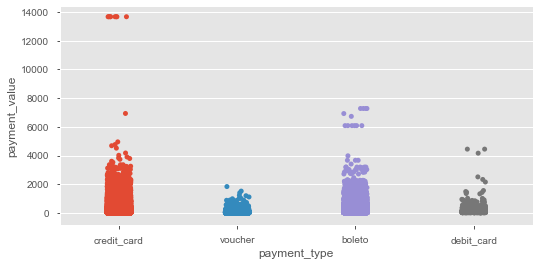

In [99]:
ax = sns.catplot(x="payment_type", y="payment_value",data=df_train_save, aspect=2, height=3.8)

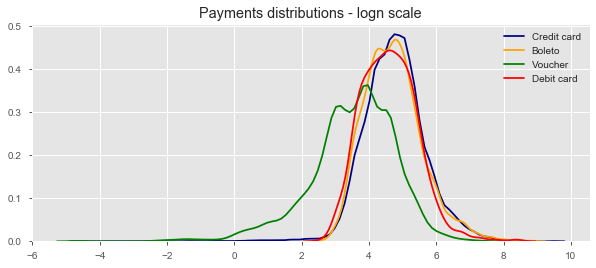

In [100]:
plt.figure(figsize=(10,4))
plt.title("Payments distributions - logn scale")
p1 = sns.kdeplot(df_train_save[df_train_save.payment_type == 'credit_card']['payment_value_log'], color="navy", label='Credit card')
p2 = sns.kdeplot(df_train_save[df_train_save.payment_type == 'boleto']['payment_value_log'], color="orange", label='Boleto')
p3 = sns.kdeplot(df_train_save[df_train_save.payment_type == 'voucher']['payment_value_log'], color="green", label='Voucher')
p4 = sns.kdeplot(df_train_save[df_train_save.payment_type == 'debit_card']['payment_value_log'], color="red", label='Debit card')

In [101]:
#Installments
#Only credit cards can have more than one installment:
df_train_save[df_train_save['payment_installments'] > 1]['payment_type'].value_counts().to_frame()

,payment_type
credit_card,57254


In [102]:
ins_count = df_train_save.groupby('payment_installments').size()
ins_mean = df_train_save.groupby('payment_installments')['payment_value'].mean()

trace0 = go.Bar(
    x=ins_count.index,
    y=ins_count.values,
    name='Number of orders',
    marker=dict(color='rgb(49,130,189)')
)
trace1 = go.Bar(
    x=ins_mean.index,
    y=ins_mean.values,
    name='Mean value',
    marker=dict(color='rgb(204,204,204)')
)
fig = tools.make_subplots(rows=1, cols=2, print_grid=False)
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)

fig['layout'].update(height=400, width=800, title='Number of installments',
                     legend=dict(orientation="h"))
iplot(fig)

In [103]:
pay_one_inst = df_train_save[df_train_save['payment_installments'] == 1]
method_count = pay_one_inst['payment_type'].value_counts().to_frame().reset_index()
method_value = pay_one_inst.groupby('payment_type')['payment_value'].sum().to_frame().reset_index()
# Plotly piechart
colors = None
trace1 = go.Pie(labels=method_count['index'], values=method_count['payment_type'],
                domain= {'x': [0, .48]}, marker=dict(colors=colors))
trace2 = go.Pie(labels=method_value['payment_type'], values=method_value['payment_value'],
                domain= {'x': [0.52, 1]}, marker=dict(colors=colors))
layout = dict(title= "Orders and value for a single installment", 
              height=400, width=800,)
fig = dict(data=[trace1, trace2], layout=layout)
iplot(fig)

Text(0, 0.5, 'Frequency')

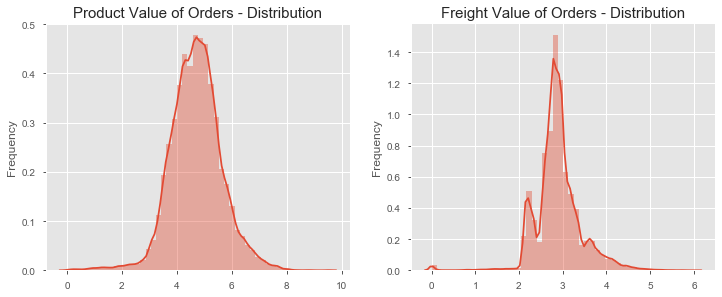

In [104]:
plt.figure(figsize=(12,10))

plt.subplot(221)
g = sns.distplot(np.log(df_train_save['payment_value'] + 1))
g.set_title("Product Value of Orders - Distribution", fontsize=15)
g.set_xlabel("")
g.set_ylabel("Frequency", fontsize=12)

plt.subplot(222)
g1 = sns.distplot(np.log(df_train_save['freight_value'] + 1))
g1.set_title("Freight Value of Orders - Distribution", fontsize=15)
g1.set_xlabel("")
g1.set_ylabel("Frequency", fontsize=12)

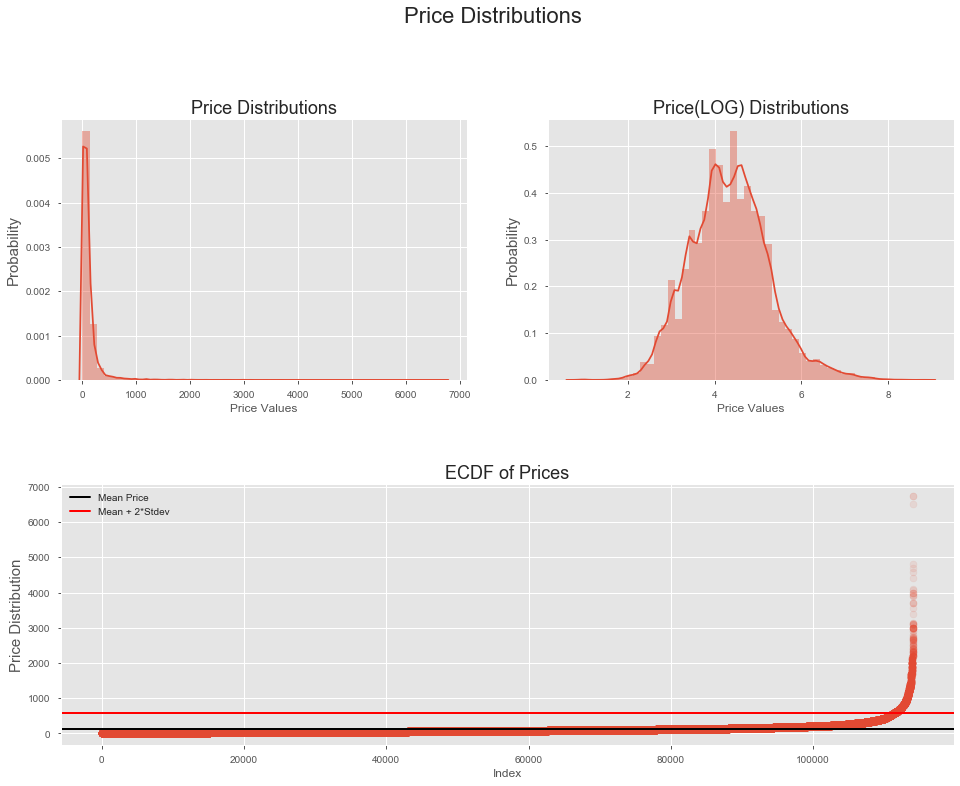

In [105]:
df_train_save['price'].fillna(-1, inplace=True)

plt.figure(figsize=(16,12))
plt.suptitle('Price Distributions', fontsize=22)
plt.subplot(221)
g = sns.distplot(df_train_save['price'])
g.set_title("Price Distributions", fontsize=18)
g.set_xlabel("Price Values")
g.set_ylabel("Probability", fontsize=15)

plt.subplot(222)
g1 = sns.distplot(np.log(df_train_save['price']+1.5))
g1.set_title("Price(LOG) Distributions", fontsize=18)
g1.set_xlabel("Price Values")
g1.set_ylabel("Probability", fontsize=15)

plt.subplot(212)
g4 = plt.scatter(range(df_train_save.shape[0]),
                 np.sort(df_train_save['price'].values), 
                 alpha=.1)
g4= plt.title("ECDF of Prices", fontsize=18)
g4 = plt.xlabel("Index")
g4 = plt.ylabel("Price Distribution", fontsize=15)
g4 = plt.axhline(df_train_save[df_train_save['price'] != -1]['price'].mean(), color='black', 
           label='Mean Price', linewidth=2)
g4 = plt.axhline(df_train_save[df_train_save['price'] != -1]['price'].mean() + (2.5*df_train_save[df_train_save['price'] != -1]['price'].std()),
                 color='red', 
           label='Mean + 2*Stdev', linewidth=2)
g4 = plt.legend()

plt.subplots_adjust(hspace = 0.4, top = 0.85)

plt.show()


In [106]:
df_train_save['price_log'] = np.log(df_train_save['price'] + 1.5)

In [107]:
df_train_save.drop(columns={'order_item_qty'})

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,customer_city,customer_state,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,Total_price,PurchaseDate,payment_value_log,price_log
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,sao paulo,SP,9350.0,maua,SP,housewares,38.71,2017-10-02 11:07:15,2.897016,3.449670
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,sao paulo,SP,9350.0,maua,SP,housewares,38.71,2017-10-02 11:07:15,0.693147,3.449670
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1.0,87285b34884572647811a353c7ac498a,...,sao paulo,SP,9350.0,maua,SP,housewares,38.71,2017-10-02 11:07:15,2.922624,3.449670
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28,1.0,87285b34884572647811a353c7ac498a,...,sao paulo,SP,9350.0,maua,SP,housewares,37.77,2017-08-15 20:05:16,3.631515,3.449670
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15,1.0,87285b34884572647811a353c7ac498a,...,sao paulo,SP,9350.0,maua,SP,housewares,37.77,2017-08-02 18:43:15,3.631515,3.449670
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119144,872b07190c0c9c0f13475d2141c4036a,814605f2161337c56520639099b0199f,delivered,2018-07-03 10:10:12,2018-07-05 16:22:38,2018-07-03 12:00:00,2018-07-10 17:18:49,2018-08-02,2.0,97de49733ccaac64d122444d8db709d1,...,belem,PA,5201.0,sao paulo,SP,books_imported,84.36,2018-07-05 16:22:38,5.128241,4.197052
119145,522eec5aa38ae3153b1c1a94e013947e,39eda8beee70b851aa9ba9040fb44615,delivered,2018-07-05 16:25:40,2018-07-06 02:35:18,2018-07-06 10:27:00,2018-07-09 18:16:53,2018-07-27,1.0,5b668636d65ddf4e4109c6d8fb13ea56,...,paranagua,PR,5201.0,sao paulo,SP,books_imported,63.41,2018-07-06 02:35:18,4.149622,3.839237
119147,1dbff949801376b8795a093d31cfe205,0cbd2df3d6e9d8b1eaf5cfefc44886bc,delivered,2018-05-16 14:50:54,2018-05-16 15:18:42,2018-05-18 12:10:00,2018-05-21 17:14:08,2018-05-28,1.0,90797f195eb7bb9dae050697a25f35ce,...,ribeirao pires,SP,5201.0,sao paulo,SP,books_imported,66.38,2018-05-16 15:18:42,4.195396,4.102478
119148,6775b950cdc4da0ce39b261032f92c84,c4d135422be0d4333f506acde8af9419,delivered,2018-06-13 12:19:26,2018-06-13 17:39:14,2018-06-15 13:09:00,2018-06-16 17:48:30,2018-06-28,1.0,3e72533d34a1779d818ac8a73403387c,...,sao paulo,SP,5201.0,sao paulo,SP,books_imported,31.42,2018-06-13 17:39:14,3.447445,3.238286


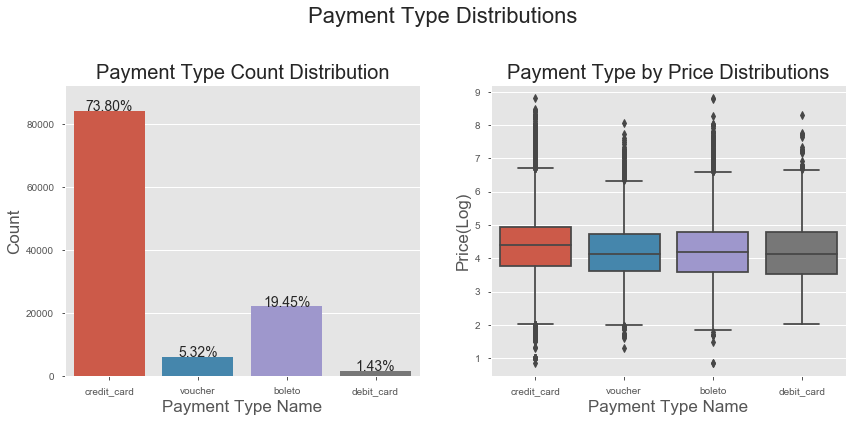

In [108]:
total = len(df_train_save)

plt.figure(figsize=(14,6))

plt.suptitle('Payment Type Distributions', fontsize=22)

plt.subplot(121)
g = sns.countplot(x='payment_type', data=df_train_save[df_train_save['payment_type'] != 'not_defined'])
g.set_title("Payment Type Count Distribution", fontsize=20)
g.set_xlabel("Payment Type Name", fontsize=17)
g.set_ylabel("Count", fontsize=17)

sizes = []
for p in g.patches:
    height = p.get_height()
    sizes.append(height)
    g.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center", fontsize=14) 
    
g.set_ylim(0, max(sizes) * 1.1)

plt.subplot(122)
g = sns.boxplot(x='payment_type', y='price_log', data=df_train_save[df_train_save['payment_type'] != 'not_defined'])
g.set_title("Payment Type by Price Distributions", fontsize=20)
g.set_xlabel("Payment Type Name", fontsize=17)
g.set_ylabel("Price(Log)", fontsize=17)

plt.subplots_adjust(hspace = 0.5, top = 0.8)

plt.show()

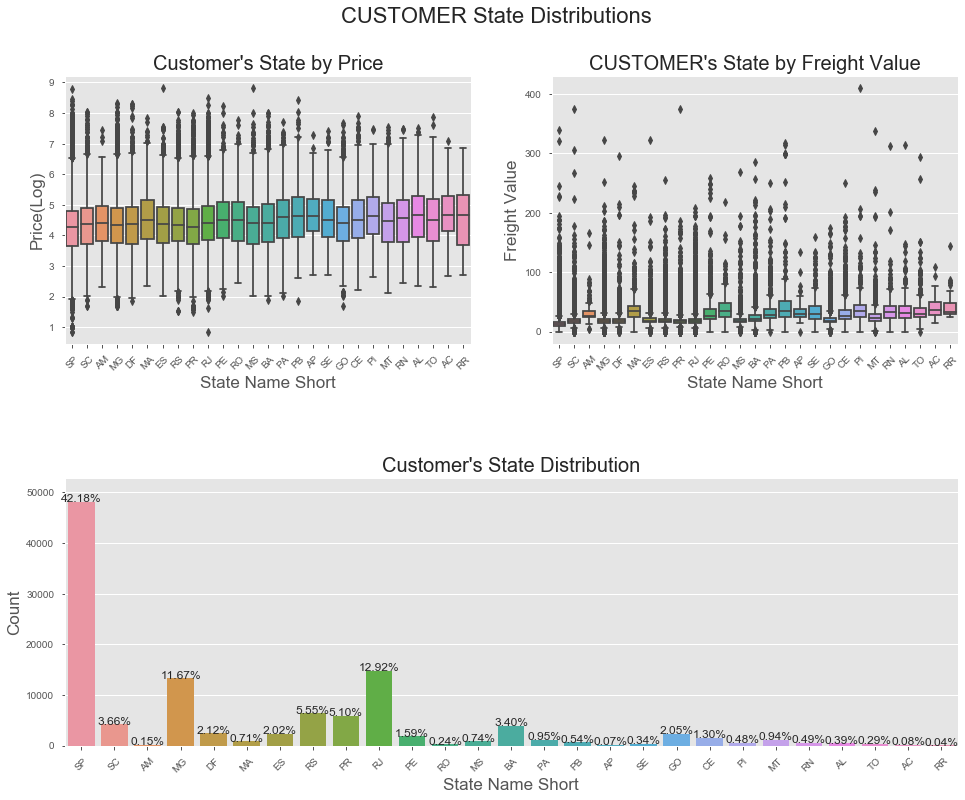

In [109]:
plt.figure(figsize=(16,12))

plt.suptitle('CUSTOMER State Distributions', fontsize=22)

plt.subplot(212)
g = sns.countplot(x='customer_state', data=df_train_save, orient='h')
g.set_title("Customer's State Distribution", fontsize=20)
g.set_xlabel("State Name Short", fontsize=17)
g.set_ylabel("Count", fontsize=17)
g.set_xticklabels(g.get_xticklabels(),rotation=45)
sizes = []
for p in g.patches:
    height = p.get_height()
    sizes.append(height)
    g.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center", fontsize=12) 
g.set_ylim(0, max(sizes) * 1.1)

plt.subplot(221)
g2 = sns.boxplot(x='customer_state', y='price_log', 
                 data=df_train_save[df_train_save['price'] != -1])
g2.set_title("Customer's State by Price", fontsize=20)
g2.set_xlabel("State Name Short", fontsize=17)
g2.set_ylabel("Price(Log)", fontsize=17)
g2.set_xticklabels(g2.get_xticklabels(),rotation=45)

plt.subplot(222)
g3 = sns.boxplot(x='customer_state', y='freight_value', 
                 data=df_train_save[df_train_save['price'] != -1])
g3.set_title("CUSTOMER's State by Freight Value", fontsize=20)
g3.set_xlabel("State Name Short", fontsize=17)
g3.set_ylabel("Freight Value", fontsize=17)
g3.set_xticklabels(g3.get_xticklabels(),rotation=45)

plt.subplots_adjust(hspace = 0.5, top = 0.9)

plt.show()

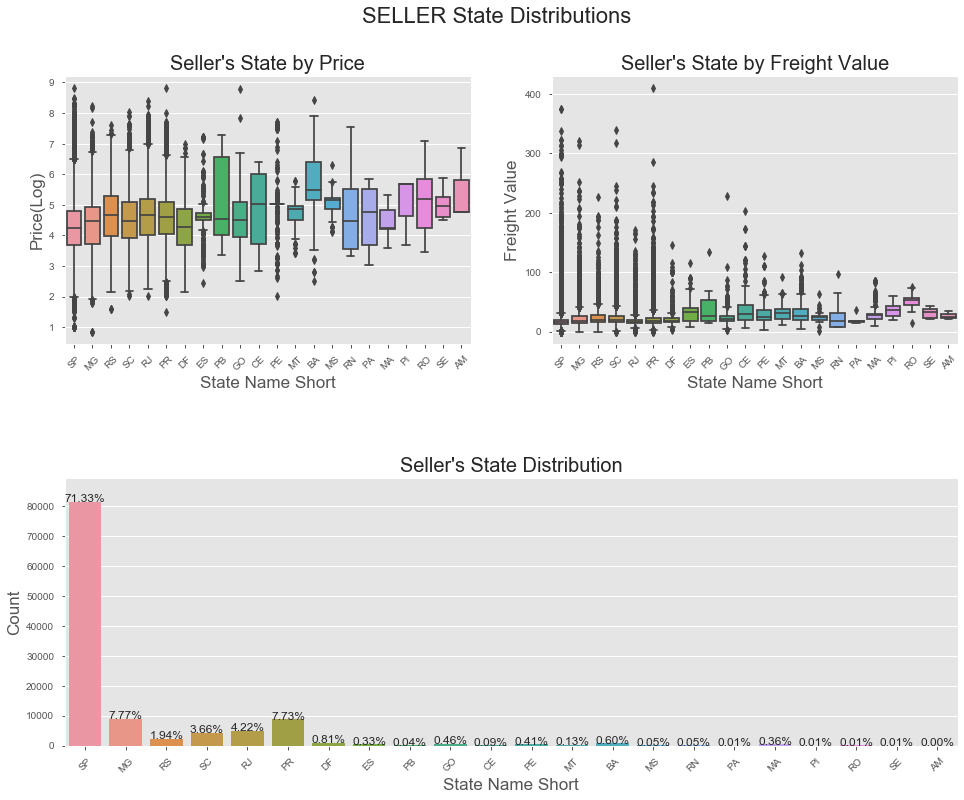

In [110]:
plt.figure(figsize=(16,12))

plt.suptitle('SELLER State Distributions', fontsize=22)

plt.subplot(212)
g = sns.countplot(x='seller_state', data=df_train_save, orient='h')
g.set_title("Seller's State Distribution", fontsize=20)
g.set_xlabel("State Name Short", fontsize=17)
g.set_ylabel("Count", fontsize=17)
g.set_xticklabels(g.get_xticklabels(),rotation=45)
sizes = []
for p in g.patches:
    height = p.get_height()
    sizes.append(height)
    g.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center", fontsize=12) 
g.set_ylim(0, max(sizes) * 1.1)

plt.subplot(221)
g2 = sns.boxplot(x='seller_state', y='price_log', 
                 data=df_train_save[df_train_save['price'] != -1])
g2.set_title("Seller's State by Price", fontsize=20)
g2.set_xlabel("State Name Short", fontsize=17)
g2.set_ylabel("Price(Log)", fontsize=17)
g2.set_xticklabels(g2.get_xticklabels(),rotation=45)

plt.subplot(222)
g3 = sns.boxplot(x='seller_state', y='freight_value', 
                 data=df_train_save[df_train_save['price'] != -1])
g3.set_title("Seller's State by Freight Value", fontsize=20)
g3.set_xlabel("State Name Short", fontsize=17)
g3.set_ylabel("Freight Value", fontsize=17)
g3.set_xticklabels(g3.get_xticklabels(),rotation=45)

plt.subplots_adjust(hspace = 0.5, top = 0.9)

plt.show()

In [111]:
# Setting regions
sudeste = ['SP', 'RJ', 'ES','MG']
nordeste= ['MA', 'PI', 'CE', 'RN', 'PE', 'PB', 'SE', 'AL', 'BA']
norte =  ['AM', 'RR', 'AP', 'PA', 'TO', 'RO', 'AC']
centro_oeste = ['MT', 'GO', 'MS' ,'DF' ]
sul = ['SC', 'RS', 'PR']

df_train_save.loc[df_train_save['customer_state'].isin(sudeste), 'cust_Region'] = 'Southeast'
df_train_save.loc[df_train_save['customer_state'].isin(nordeste), 'cust_Region'] = 'Northeast'
df_train_save.loc[df_train_save['customer_state'].isin(norte), 'cust_Region'] = 'North'
df_train_save.loc[df_train_save['customer_state'].isin(centro_oeste), 'cust_Region'] = 'Midwest'
df_train_save.loc[df_train_save['customer_state'].isin(sul), 'cust_Region'] = 'South'

In [112]:
df_train_save[['customer_state','seller_state','freight_value','cust_Region']]

,customer_state,seller_state,freight_value,cust_Region
0,SP,SP,8.72,Southeast
1,SP,SP,8.72,Southeast
2,SP,SP,8.72,Southeast
3,SP,SP,7.78,Southeast
4,SP,SP,7.78,Southeast
...,...,...,...,...
119144,PA,SP,19.37,North
119145,PR,SP,18.42,South
119147,SP,SP,7.39,Southeast
119148,SP,SP,7.43,Southeast


In [113]:
cross_heatmap(df_train_save, ['seller_state', 'cust_Region'], 
              values=df_train_save['freight_value'], aggfunc='mean')

cust_Region,Midwest,North,Northeast,South,Southeast
seller_state,,,,,
AM,nan,nan,28.255,nan,25.29
BA,30.2734,47.3425,22.8956,40.2995,33.6532
CE,65.4567,85.614,29.2903,53.125,47.6023
DF,12.9276,58.3719,27.6785,26.3957,19.5434
ES,36.8958,60.0229,37.368,40.3368,28.7968
GO,14.5629,26.5959,33.5713,30.6411,23.7597
MA,27.1502,28.859,19.4109,42.6607,31.9002
MG,27.0674,42.5082,34.2734,29.0052,21.138
MS,26.2286,21.41,29.4123,25.6,21.6087


In [114]:
df_train_save['ord_new'] = df_train_save['order_item_id'].copy()

#codage des id entre 7 et 10 et au dessus de 10 en une seule catégorie
df_train_save.loc[df_train_save['order_item_id'].isin([7,8,9,10]), 'ord_new'] = '7 to 10'
df_train_save.loc[(df_train_save['order_item_id'] > 10), 'ord_new'] = '10 to 20'

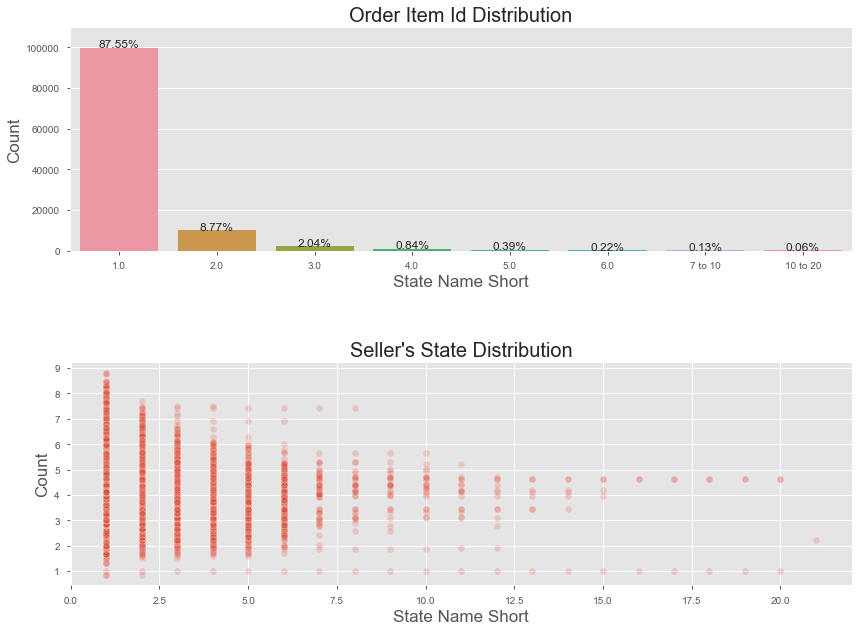

In [115]:
plt.figure(figsize=(14,10))


plt.subplot(211)
g = sns.countplot(x='ord_new', data=df_train_save)
g.set_title("Order Item Id Distribution", fontsize=20)
g.set_xlabel("State Name Short", fontsize=17)
g.set_ylabel("Count", fontsize=17)
sizes = []
for p in g.patches:
    height = p.get_height()
    sizes.append(height)
    g.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center", fontsize=12) 
g.set_ylim(0, max(sizes) * 1.1)

plt.subplot(212)
g1 = sns.scatterplot(x='order_item_id', y='price_log',
                     data=df_train_save, alpha=.2)
g1.set_title("Seller's State Distribution", fontsize=20)
g1.set_xlabel("State Name Short", fontsize=17)
g1.set_ylabel("Count", fontsize=17)

plt.subplots_adjust(hspace = 0.5, top = 0.9)

plt.show()

In [116]:
round(pd.crosstab(df_train_save['order_item_id'], df_train_save['review_score'], normalize='index') *100,2).T

order_item_id,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,...,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0
review_score,,,,,,,,,,,,,,,,,,,,,
1,10.03,21.52,25.16,28.00,28.57,32.42,42.62,41.67,51.72,53.85,...,53.85,62.5,71.43,60.0,100.0,100.0,100.0,100.0,100.0,100.0
2,3.13,5.75,6.29,6.27,5.58,4.30,3.28,0.00,0.00,0.00,...,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,8.32,9.41,9.39,8.78,9.38,10.16,13.11,13.89,13.79,15.38,...,7.69,12.5,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,19.62,16.12,16.16,15.88,16.74,16.02,14.75,19.44,17.24,11.54,...,15.38,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,58.90,47.21,43.00,41.07,39.73,37.11,26.23,25.00,17.24,19.23,...,23.08,25.0,28.57,40.0,0.0,0.0,0.0,0.0,0.0,0.0


In [117]:
pd.crosstab(df_train_save['order_item_id'], df_train_save['order_id']).T

order_item_id,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,...,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0
order_id,,,,,,,,,,,,,,,,,,,,,
00010242fe8c5a6d1ba2dd792cb16214,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
00018f77f2f0320c557190d7a144bdd3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
000229ec398224ef6ca0657da4fc703e,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
00024acbcdf0a6daa1e931b038114c75,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
00042b26cf59d7ce69dfabb4e55b4fd9,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fffc94f6ce00a00581880bf54a75a037,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
fffcd46ef2263f404302a634eb57f7eb,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
fffce4705a9662cd70adb13d4a31832d,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [118]:
#df_train['order_seller_qty'] = df_train.groupby(['order_id','seller_id']).order_id.transform('count')

In [119]:
df_train.drop_duplicates(inplace=True)

In [120]:
pd.set_option('display.max_columns', None)
df_train

,customer_unique_id,customer_city,customer_state,average_total_price_spent_by_customer,mean_review_score_by_customer,mean_quantity_of_product_ordered_by_customer,number_of_product_ordered_per_customer
0,7c396fd4830fd04220f754e42b4e5bff,sao paulo,SP,40.060000,4.250000,2.0,4
4,3a51803cc0d012c3b5dc8b7528cb05f7,sao paulo,SP,37.770000,4.000000,1.0,1
5,ef0996a1a279c26e7ecbd737be23d235,sao paulo,SP,37.770000,5.000000,1.0,1
6,e781fdcc107d13d865fc7698711cc572,florianopolis,SC,44.090000,3.000000,1.0,1
7,7a1de9bde89aedca8c5fbad489c5571c,sao paulo,SP,155.666667,2.333333,1.0,3
...,...,...,...,...,...,...,...
114044,c5df80808db02b2e08abd92b9d964b9b,belem,PA,84.360000,5.000000,1.0,2
114046,9790c90c5b3a1a5237c11433331af1cb,paranagua,PR,63.410000,1.000000,1.0,1
114047,1de8fb735d8252498d9a2f82a68c57e0,ribeirao pires,SP,66.380000,5.000000,1.0,1
114048,5f684afb3d1a02f2787e80cb0eee6e02,sao paulo,SP,31.420000,5.000000,1.0,1


In [121]:
customer_data=df_train

customer_data['customer_city'] = customer_data['customer_city'].astype('category')
customer_data['customer_state'] = customer_data['customer_state'].astype('category')


customer_data['customer_city'] = customer_data['customer_city'].cat.codes
customer_data['customer_state'] = customer_data['customer_state'].cat.codes

In [122]:
customer_data = customer_data.dropna()

In [123]:
customer_data=customer_data.drop_duplicates()
customer_data

,customer_unique_id,customer_city,customer_state,average_total_price_spent_by_customer,mean_review_score_by_customer,mean_quantity_of_product_ordered_by_customer,number_of_product_ordered_per_customer
0,7c396fd4830fd04220f754e42b4e5bff,sao paulo,SP,40.060000,4.250000,2.0,4
4,3a51803cc0d012c3b5dc8b7528cb05f7,sao paulo,SP,37.770000,4.000000,1.0,1
5,ef0996a1a279c26e7ecbd737be23d235,sao paulo,SP,37.770000,5.000000,1.0,1
6,e781fdcc107d13d865fc7698711cc572,florianopolis,SC,44.090000,3.000000,1.0,1
7,7a1de9bde89aedca8c5fbad489c5571c,sao paulo,SP,155.666667,2.333333,1.0,3
...,...,...,...,...,...,...,...
114044,c5df80808db02b2e08abd92b9d964b9b,belem,PA,84.360000,5.000000,1.0,2
114046,9790c90c5b3a1a5237c11433331af1cb,paranagua,PR,63.410000,1.000000,1.0,1
114047,1de8fb735d8252498d9a2f82a68c57e0,ribeirao pires,SP,66.380000,5.000000,1.0,1
114048,5f684afb3d1a02f2787e80cb0eee6e02,sao paulo,SP,31.420000,5.000000,1.0,1


In [124]:
customer_data.set_index('customer_unique_id',inplace=True)

In [125]:
customer_data

,customer_city,customer_state,average_total_price_spent_by_customer,mean_review_score_by_customer,mean_quantity_of_product_ordered_by_customer,number_of_product_ordered_per_customer
customer_unique_id,,,,,,
7c396fd4830fd04220f754e42b4e5bff,sao paulo,SP,40.060000,4.250000,2.0,4
3a51803cc0d012c3b5dc8b7528cb05f7,sao paulo,SP,37.770000,4.000000,1.0,1
ef0996a1a279c26e7ecbd737be23d235,sao paulo,SP,37.770000,5.000000,1.0,1
e781fdcc107d13d865fc7698711cc572,florianopolis,SC,44.090000,3.000000,1.0,1
7a1de9bde89aedca8c5fbad489c5571c,sao paulo,SP,155.666667,2.333333,1.0,3
...,...,...,...,...,...,...
c5df80808db02b2e08abd92b9d964b9b,belem,PA,84.360000,5.000000,1.0,2
9790c90c5b3a1a5237c11433331af1cb,paranagua,PR,63.410000,1.000000,1.0,1
1de8fb735d8252498d9a2f82a68c57e0,ribeirao pires,SP,66.380000,5.000000,1.0,1


In [126]:
rfmTableformerge

,recency,monetary,frequency
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,141.90,1
0000b849f77a49e4a4ce2b2a4ca5be3f,113,27.19,1
0000f46a3911fa3c0805444483337064,536,86.22,1
0000f6ccb0745a6a4b88665a16c9f078,320,43.62,1
0004aac84e0df4da2b147fca70cf8255,287,196.89,1
...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,446,2067.42,2
fffea47cd6d3cc0a88bd621562a9d061,261,84.58,1
ffff371b4d645b6ecea244b27531430a,567,112.46,1


In [127]:
customer_data_merge = customer_data.merge(rfmTableformerge, on = 'customer_unique_id')
customer_data_merge.drop(columns=['number_of_product_ordered_per_customer','customer_city','customer_state'],inplace=True)
customer_data_merge

,average_total_price_spent_by_customer,mean_review_score_by_customer,mean_quantity_of_product_ordered_by_customer,recency,monetary,frequency
customer_unique_id,,,,,,
7c396fd4830fd04220f754e42b4e5bff,40.060000,4.250000,2.0,331,160.24,4
3a51803cc0d012c3b5dc8b7528cb05f7,37.770000,4.000000,1.0,378,37.77,1
ef0996a1a279c26e7ecbd737be23d235,37.770000,5.000000,1.0,391,37.77,1
e781fdcc107d13d865fc7698711cc572,44.090000,3.000000,1.0,308,44.09,1
7a1de9bde89aedca8c5fbad489c5571c,155.666667,2.333333,1.0,269,467.00,3
...,...,...,...,...,...,...
c5df80808db02b2e08abd92b9d964b9b,84.360000,5.000000,1.0,54,168.72,2
9790c90c5b3a1a5237c11433331af1cb,63.410000,1.000000,1.0,54,63.41,1
1de8fb735d8252498d9a2f82a68c57e0,66.380000,5.000000,1.0,104,66.38,1


In [128]:
customer_data_merge=customer_data_merge.drop_duplicates()
customer_data_merge=customer_data_merge.dropna()
customer_data_merge

,average_total_price_spent_by_customer,mean_review_score_by_customer,mean_quantity_of_product_ordered_by_customer,recency,monetary,frequency
customer_unique_id,,,,,,
7c396fd4830fd04220f754e42b4e5bff,40.060000,4.250000,2.0,331,160.24,4
3a51803cc0d012c3b5dc8b7528cb05f7,37.770000,4.000000,1.0,378,37.77,1
ef0996a1a279c26e7ecbd737be23d235,37.770000,5.000000,1.0,391,37.77,1
e781fdcc107d13d865fc7698711cc572,44.090000,3.000000,1.0,308,44.09,1
7a1de9bde89aedca8c5fbad489c5571c,155.666667,2.333333,1.0,269,467.00,3
...,...,...,...,...,...,...
c5df80808db02b2e08abd92b9d964b9b,84.360000,5.000000,1.0,54,168.72,2
9790c90c5b3a1a5237c11433331af1cb,63.410000,1.000000,1.0,54,63.41,1
1de8fb735d8252498d9a2f82a68c57e0,66.380000,5.000000,1.0,104,66.38,1


In [129]:
customer_data_merge.sort_values(by=['recency'], na_position='first')

,average_total_price_spent_by_customer,mean_review_score_by_customer,mean_quantity_of_product_ordered_by_customer,recency,monetary,frequency
customer_unique_id,,,,,,
1041688b50cfd8ef6df6086a1746a30c,32.230000,4.5,1.0,0,64.46,2
9906fc374d7fd8d7a8574dd27b1c0c0a,60.333333,1.0,1.0,0,181.00,3
0c6d7218d5f3fa14514fd29865269993,178.250000,5.0,1.0,0,178.25,1
55cfdb1ec3c5bf60d9ccc0d5f276f8a9,260.500000,5.0,1.0,0,260.50,1
a3bf67d0b92528d2fe5c379dd905bf66,128.990000,5.0,1.0,0,128.99,1
...,...,...,...,...,...,...
0829f7df6577d5a4b65439bea701405f,267.490000,3.0,1.0,694,267.49,1
10e89fd8e5c745f81bec101207ba4d7d,92.270000,1.0,1.0,694,92.27,1
5f7e36fb1d42d0b1c408b5b41bc52bb3,144.940000,3.0,1.0,694,144.94,1


In [130]:
customer_data_merge.describe().T

,count,mean,std,min,25%,50%,75%,max
average_total_price_spent_by_customer,90124.0,147.105194,198.924834,9.341429,57.82,96.80,163.77,6929.31
mean_review_score_by_customer,90124.0,4.130361,1.295179,1.000000,4.00,5.00,5.00,5.00
mean_quantity_of_product_ordered_by_customer,90124.0,1.050286,0.384850,1.000000,1.00,1.00,1.00,26.00
recency,90124.0,236.324741,152.953231,0.000000,112.00,217.00,345.00,694.00
monetary,90124.0,175.021734,261.278679,10.070000,64.10,111.72,190.37,13664.08
frequency,90124.0,1.243576,0.855888,1.000000,1.00,1.00,1.00,75.00


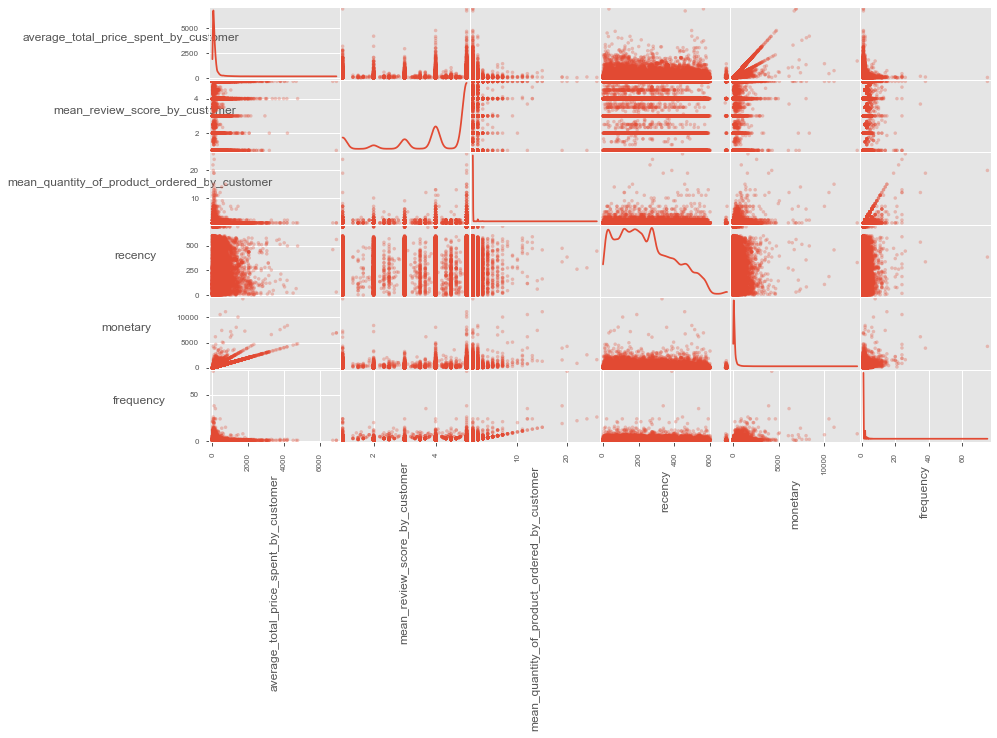

In [131]:
from IPython.display import display # Allows the use of display() for DataFrames

# Produce a scatter matrix for each pair of features in the data
axs = pd.plotting.scatter_matrix(customer_data_merge, alpha = 0.3, figsize = (14,8), diagonal = 'kde');
n = len(customer_data_merge.columns)
for x in range(n):
    for y in range(n):
        # to get the axis of subplots
        ax = axs[x, y]
        # to make x axis name vertical  
        ax.xaxis.label.set_rotation(90)
        # to make y axis name horizontal 
        ax.yaxis.label.set_rotation(0)
        # to make sure y axis names are outside the plot area
        ax.yaxis.labelpad = 50

(6.5, -0.5)

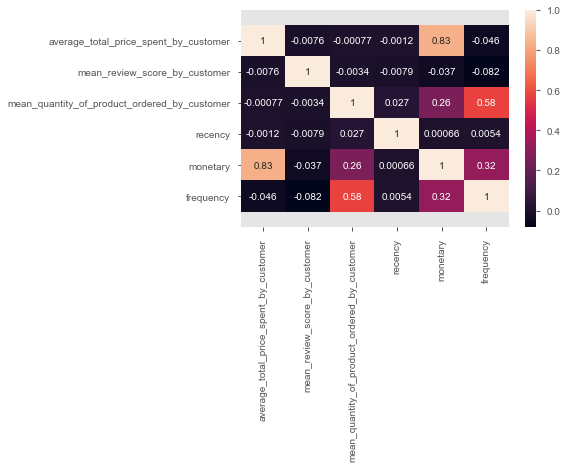

In [132]:
import seaborn as sns

ax = sns.heatmap(customer_data_merge.corr(), annot=True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

{'whiskers': [<matplotlib.lines.Line2D at 0x1c30cb7cc88>,
 'caps': [<matplotlib.lines.Line2D at 0x1c30cb7c940>,
 'boxes': [<matplotlib.lines.Line2D at 0x1c30cb86198>],
 'medians': [<matplotlib.lines.Line2D at 0x1c30cb65320>],
 'fliers': [<matplotlib.lines.Line2D at 0x1c30cb659b0>],
 'means': []}

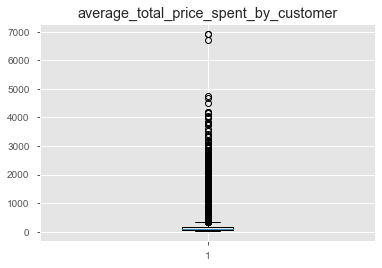

In [133]:
fig1, ax1 = plt.subplots()
ax1.set_title('average_total_price_spent_by_customer')
ax1.boxplot(customer_data_merge['average_total_price_spent_by_customer'])

{'whiskers': [<matplotlib.lines.Line2D at 0x1c307d6cf60>,
 'caps': [<matplotlib.lines.Line2D at 0x1c307623710>,
 'boxes': [<matplotlib.lines.Line2D at 0x1c307d6cb70>],
 'medians': [<matplotlib.lines.Line2D at 0x1c307623e10>],
 'fliers': [<matplotlib.lines.Line2D at 0x1c307623f28>],
 'means': []}

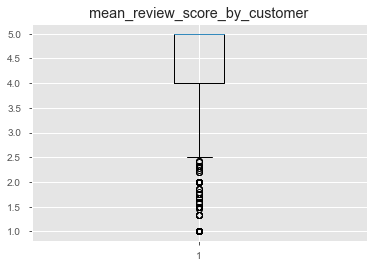

In [134]:
fig1, ax1 = plt.subplots()
ax1.set_title('mean_review_score_by_customer')
ax1.boxplot(customer_data_merge['mean_review_score_by_customer'])

{'whiskers': [<matplotlib.lines.Line2D at 0x1c30de38b70>,
 'caps': [<matplotlib.lines.Line2D at 0x1c30702ef28>,
 'boxes': [<matplotlib.lines.Line2D at 0x1c30702e668>],
 'medians': [<matplotlib.lines.Line2D at 0x1c3081138d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x1c308113c50>],
 'means': []}

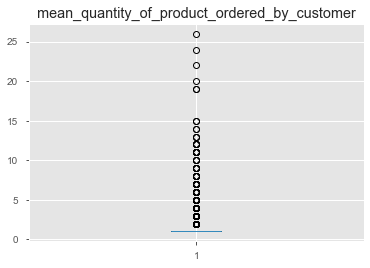

In [135]:
fig1, ax1 = plt.subplots()
ax1.set_title('mean_quantity_of_product_ordered_by_customer')
ax1.boxplot(customer_data_merge['mean_quantity_of_product_ordered_by_customer'])

{'whiskers': [<matplotlib.lines.Line2D at 0x1c308610f28>,
 'caps': [<matplotlib.lines.Line2D at 0x1c30862a978>,
 'boxes': [<matplotlib.lines.Line2D at 0x1c308610da0>],
 'medians': [<matplotlib.lines.Line2D at 0x1c30862ae10>],
 'fliers': [<matplotlib.lines.Line2D at 0x1c3086ad438>],
 'means': []}

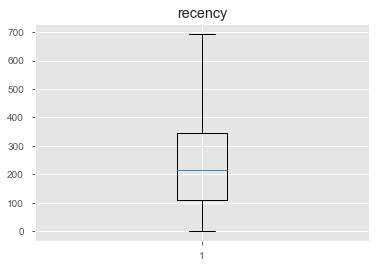

In [136]:
fig1, ax1 = plt.subplots()
ax1.set_title('recency')
ax1.boxplot(customer_data_merge['recency'])

{'whiskers': [<matplotlib.lines.Line2D at 0x1c305ae0518>,
 'caps': [<matplotlib.lines.Line2D at 0x1c305ae0c88>,
 'boxes': [<matplotlib.lines.Line2D at 0x1c305ae0128>],
 'medians': [<matplotlib.lines.Line2D at 0x1c308d193c8>],
 'fliers': [<matplotlib.lines.Line2D at 0x1c308d19748>],
 'means': []}

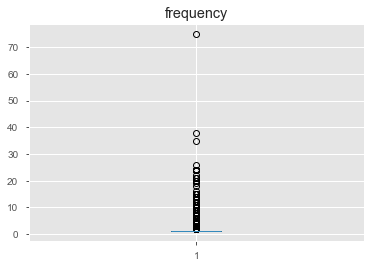

In [137]:
fig1, ax1 = plt.subplots()
ax1.set_title('frequency')
ax1.boxplot(customer_data_merge['frequency'])

{'whiskers': [<matplotlib.lines.Line2D at 0x1c32e5a78d0>,
 'caps': [<matplotlib.lines.Line2D at 0x1c32e5a7dd8>,
 'boxes': [<matplotlib.lines.Line2D at 0x1c32e5a74e0>],
 'medians': [<matplotlib.lines.Line2D at 0x1c3074a6780>],
 'fliers': [<matplotlib.lines.Line2D at 0x1c3074a6b00>],
 'means': []}

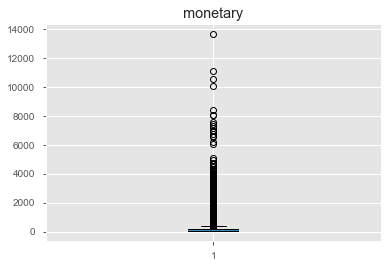

In [138]:
fig1, ax1 = plt.subplots()
ax1.set_title('monetary')
ax1.boxplot(customer_data_merge['monetary'])

In [139]:
kmeans1 = KMeans(n_clusters=5)
mms = StandardScaler().fit(customer_data_merge)
data_transformed = mms.transform(customer_data_merge)

In [140]:
x = kmeans1.fit_predict(customer_data_merge)
x

array([0, 0, 0, ..., 4, 4, 1])

In [141]:
def plot_clustering(data, labels, title=None):
    x_min, x_max = np.min(data, axis=0), np.max(data, axis=0)
    data = (data - x_min) / (x_max - x_min)
    fig = plt.figure(1, figsize=(4, 3))
    plt.figure(figsize=(6, 4))
    

    plt.scatter(data[:, 3], data[:, 2],
                 c=labels.astype(np.float),cmap='viridis')

    plt.xticks([])
    plt.yticks([])
    if title is not None:
        plt.title(title, size=17)
    plt.axis('off')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

In [142]:
def plot_3d(data_transformed, labels):
    fig = plt.figure(1, figsize=(4, 3))
    ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

    ax.scatter(data_transformed[:, 1], data_transformed[:, 2], data_transformed[:, 4],
               c=labels.astype(np.float), edgecolor='k',cmap='viridis')

    ax.w_xaxis.set_ticklabels([])
    ax.w_yaxis.set_ticklabels([])
    ax.w_zaxis.set_ticklabels([])
#     ax.set_xlabel('x')
#     ax.set_ylabel('y')
#     ax.set_zlabel('z')
#     ax.set_title('Grafico')
    ax.dist = 12

    plt.figure(figsize=(6, 4))

In [143]:
kmeans1.fit(data_transformed)
labels = kmeans1.labels_
kmeans1.cluster_centers_

 # cluster count
print(pd.Series(kmeans1.labels_).value_counts())
#plot_clustering(data_transformed, labels)

#plot_3d(data_transformed, labels)
plt.show()

0    41001
2    30923
1    15657
3     2357
4      186
dtype: int64


In [144]:
labels = kmeans1.labels_

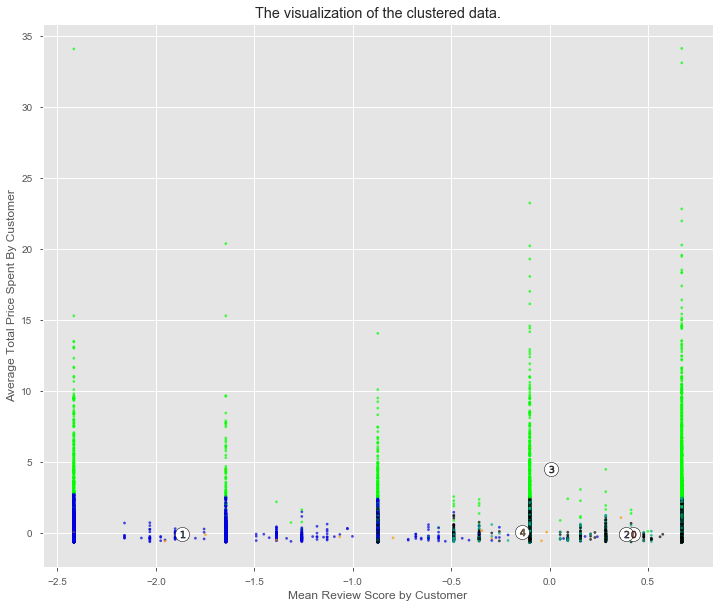

In [145]:
import matplotlib.cm as cm

plt.figure(figsize=(12, 10))
# 2nd Plot showing the actual clusters formed
colors = cm.nipy_spectral(labels.astype(float) / 5)
plt.scatter(data_transformed[:, 1], data_transformed[:, 0], marker='.', s=30, lw=0, alpha=0.7,
            c=colors, edgecolor='k')

# Labeling the clusters
centers = kmeans1.cluster_centers_
#labels = ['Cluster 0','Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4']
# Draw white circles at cluster centers
plt.scatter(centers[:, 1], centers[:, 0], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
     plt.scatter(c[1], c[0], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

plt.title("The visualization of the clustered data.")
plt.xlabel("Mean Review Score by Customer")
plt.ylabel("Average Total Price Spent By Customer")


plt.show()

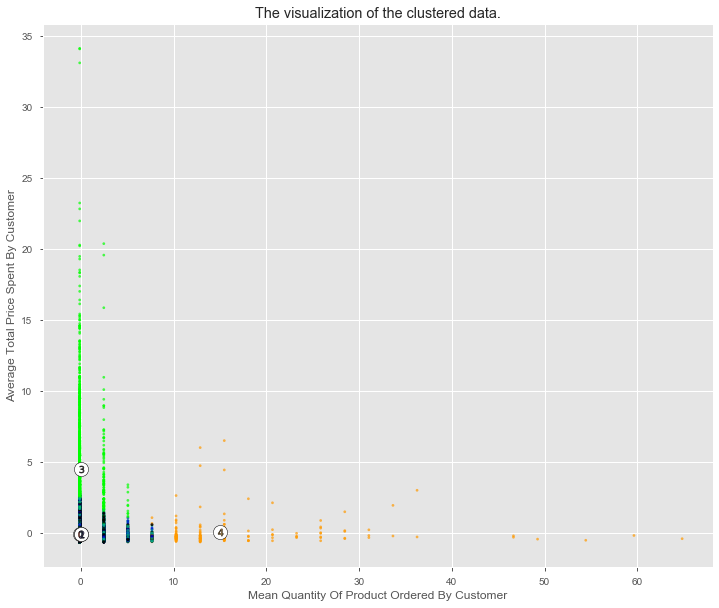

In [146]:
plt.figure(figsize=(12, 10))
# 2nd Plot showing the actual clusters formed
colors = cm.nipy_spectral(labels.astype(float) / 5)
plt.scatter(data_transformed[:, 2], data_transformed[:, 0], marker='.', s=30, lw=0, alpha=0.7,
            c=colors, edgecolor='k')

# Labeling the clusters
centers = kmeans1.cluster_centers_
# Draw white circles at cluster centers
plt.scatter(centers[:, 2], centers[:, 0], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
     plt.scatter(c[2], c[0], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

plt.title("The visualization of the clustered data.")
plt.xlabel("Mean Quantity Of Product Ordered By Customer")
plt.ylabel("Average Total Price Spent By Customer")

plt.show()

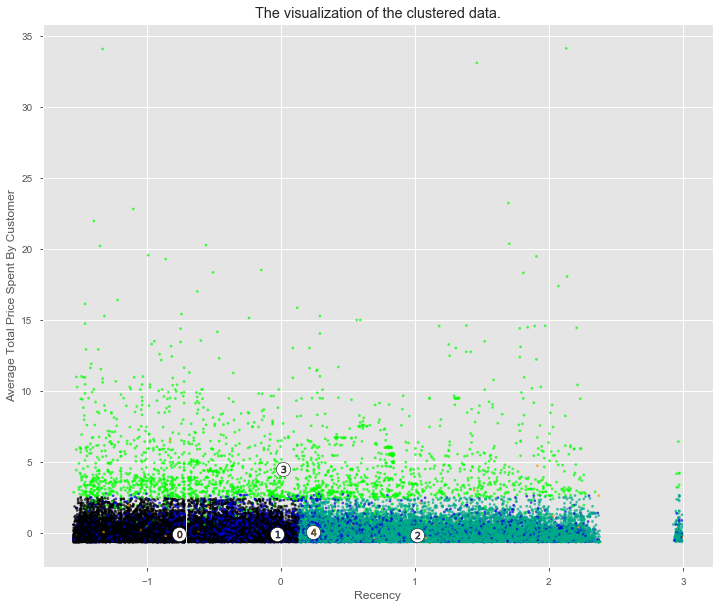

In [147]:
plt.figure(figsize=(12, 10))
# 2nd Plot showing the actual clusters formed
colors = cm.nipy_spectral(labels.astype(float) / 5)
plt.scatter(data_transformed[:, 3], data_transformed[:, 0], marker='.', s=30, lw=0, alpha=0.7,
            c=colors, edgecolor='k')

# Labeling the clusters
centers = kmeans1.cluster_centers_
# Draw white circles at cluster centers
plt.scatter(centers[:, 3], centers[:, 0], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
     plt.scatter(c[3], c[0], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

plt.title("The visualization of the clustered data.")
plt.xlabel("Recency")
plt.ylabel("Average Total Price Spent By Customer")

plt.show()

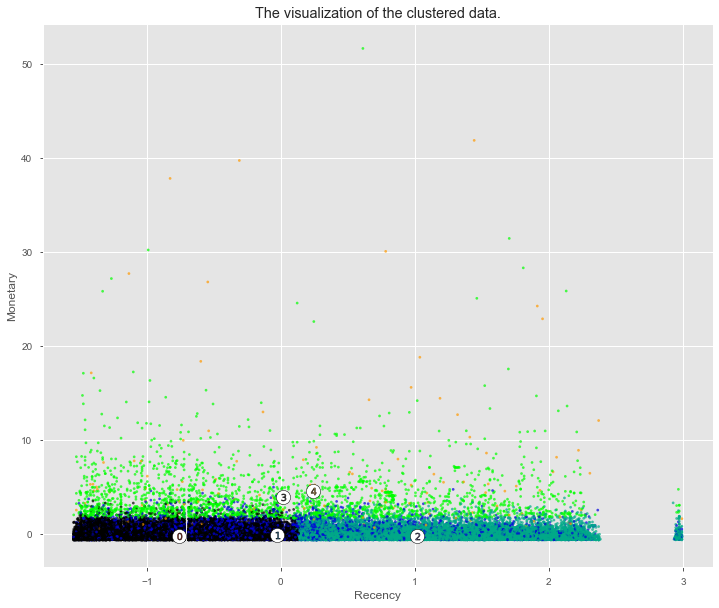

In [148]:
plt.figure(figsize=(12, 10))
# 2nd Plot showing the actual clusters formed
colors = cm.nipy_spectral(labels.astype(float) / 5)
plt.scatter(data_transformed[:, 3], data_transformed[:, 4], marker='.', s=30, lw=0, alpha=0.7,
            c=colors, edgecolor='k')

# Labeling the clusters
centers = kmeans1.cluster_centers_
# Draw white circles at cluster centers
plt.scatter(centers[:, 3], centers[:, 4], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
     plt.scatter(c[3], c[4], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

plt.title("The visualization of the clustered data.")
plt.xlabel("Recency")
plt.ylabel("Monetary")

plt.show()

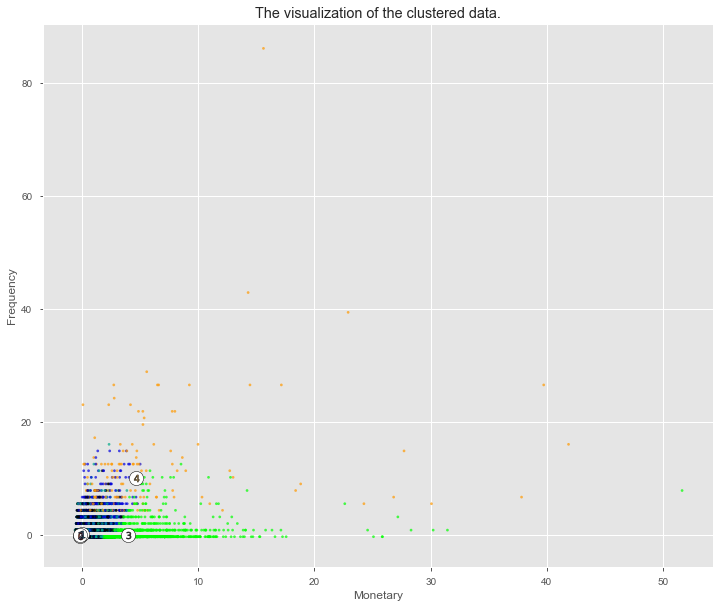

In [149]:
plt.figure(figsize=(12, 10))
# 2nd Plot showing the actual clusters formed
colors = cm.nipy_spectral(labels.astype(float) / 5)
plt.scatter(data_transformed[:, 4], data_transformed[:, 5], marker='.', s=30, lw=0, alpha=0.7,
            c=colors, edgecolor='k')

# Labeling the clusters
centers = kmeans1.cluster_centers_
# Draw white circles at cluster centers
plt.scatter(centers[:, 4], centers[:, 5], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
     plt.scatter(c[4], c[5], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

plt.title("The visualization of the clustered data.")
plt.xlabel("Monetary")
plt.ylabel("Frequency")

plt.show()

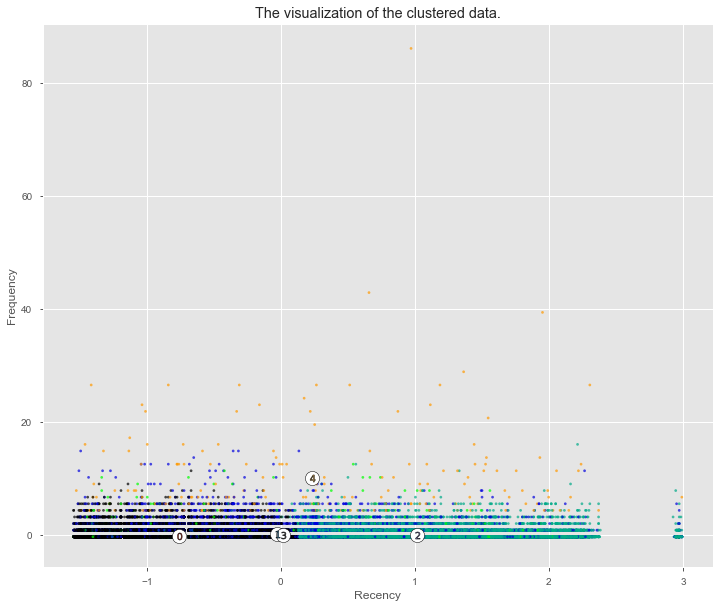

In [150]:
plt.figure(figsize=(12, 10))
# 2nd Plot showing the actual clusters formed
colors = cm.nipy_spectral(labels.astype(float) / 5)
plt.scatter(data_transformed[:, 3], data_transformed[:, 5], marker='.', s=30, lw=0, alpha=0.7,
            c=colors, edgecolor='k')

# Labeling the clusters
centers = kmeans1.cluster_centers_
# Draw white circles at cluster centers
plt.scatter(centers[:,3], centers[:, 5], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
     plt.scatter(c[3], c[5], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

plt.title("The visualization of the clustered data.")
plt.xlabel("Recency")
plt.ylabel("Frequency")

plt.show()

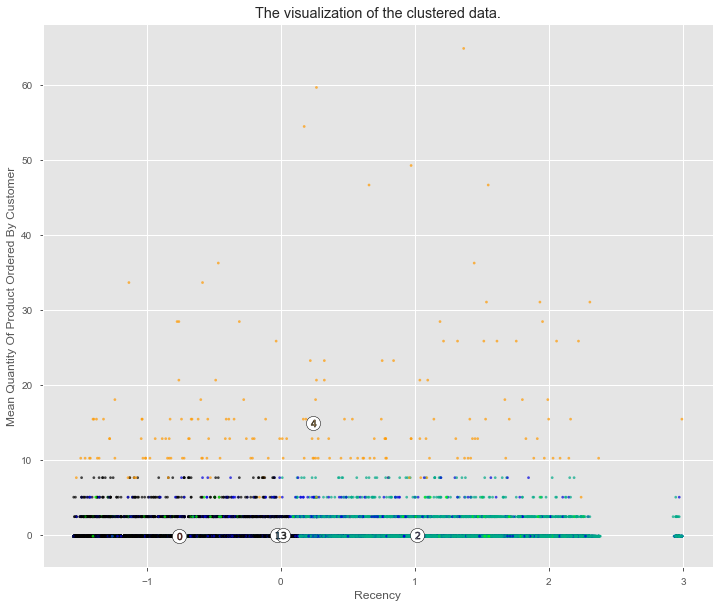

In [151]:
plt.figure(figsize=(12, 10))
# 2nd Plot showing the actual clusters formed
colors = cm.nipy_spectral(labels.astype(float) / 5)
plt.scatter(data_transformed[:, 3], data_transformed[:, 2], marker='.', s=30, lw=0, alpha=0.7,
            c=colors, edgecolor='k')

# Labeling the clusters
centers = kmeans1.cluster_centers_
# Draw white circles at cluster centers
plt.scatter(centers[:, 3], centers[:, 2], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
     plt.scatter(c[3], c[2], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

plt.title("The visualization of the clustered data.")
plt.xlabel("Recency")
plt.ylabel("Mean Quantity Of Product Ordered By Customer")

plt.show()

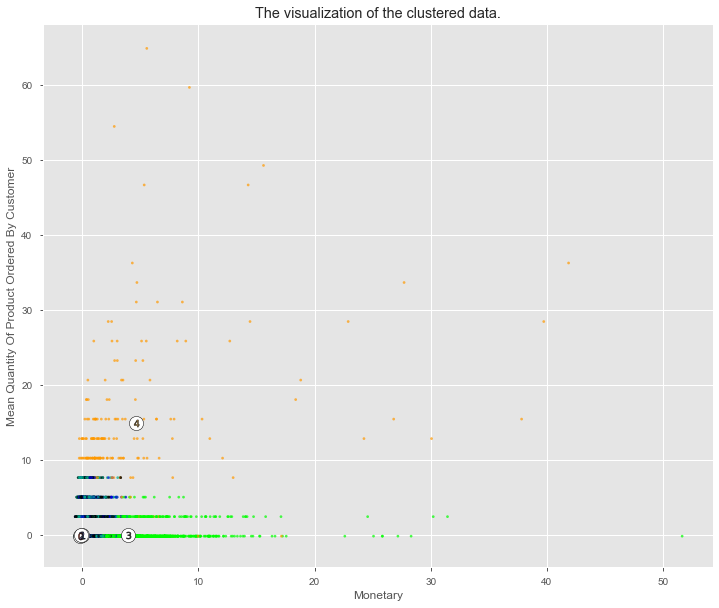

In [152]:
plt.figure(figsize=(12, 10))
# 2nd Plot showing the actual clusters formed
colors = cm.nipy_spectral(labels.astype(float) / 5)
plt.scatter(data_transformed[:, 4], data_transformed[:, 2], marker='.', s=30, lw=0, alpha=0.7,
            c=colors, edgecolor='k')

# Labeling the clusters
centers = kmeans1.cluster_centers_
# Draw white circles at cluster centers
plt.scatter(centers[:, 4], centers[:, 2], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
     plt.scatter(c[4], c[2], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

plt.title("The visualization of the clustered data.")
plt.xlabel("Monetary")
plt.ylabel("Mean Quantity Of Product Ordered By Customer")

plt.show()

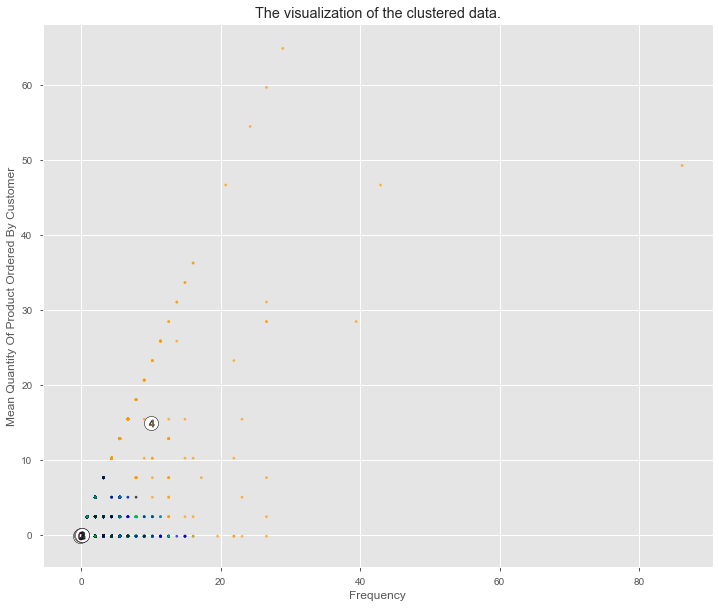

In [153]:
plt.figure(figsize=(12, 10))
# 2nd Plot showing the actual clusters formed
colors = cm.nipy_spectral(labels.astype(float) / 5)
plt.scatter(data_transformed[:, 5], data_transformed[:, 2], marker='.', s=30, lw=0, alpha=0.7,
            c=colors, edgecolor='k')

# Labeling the clusters
centers = kmeans1.cluster_centers_
# Draw white circles at cluster centers
plt.scatter(centers[:, 5], centers[:, 2], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
     plt.scatter(c[5], c[2], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

plt.title("The visualization of the clustered data.")
plt.xlabel("Frequency")
plt.ylabel("Mean Quantity Of Product Ordered By Customer")

plt.show()

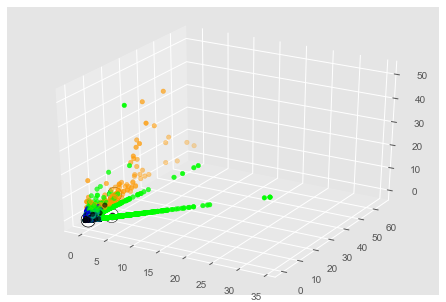

In [154]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D

colors = cm.nipy_spectral(labels.astype(float) / 5)
fig = pyplot.figure()
ax = Axes3D(fig)

ax.scatter(data_transformed[:, 0], data_transformed[:, 2], data_transformed[:, 4],c = colors, marker='o')
# Labeling the clusters
centers = kmeans1.cluster_centers_
# Draw white circles at cluster centers
ax.scatter(centers[:, 0], centers[:, 2], centers[:, 4], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
     ax.scatter(c[0], c[2], c[4],marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')
pyplot.show()

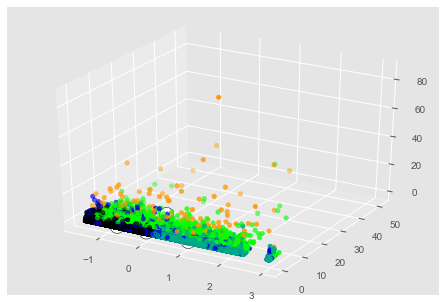

In [155]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D

colors = cm.nipy_spectral(labels.astype(float) / 5)
fig = pyplot.figure()
ax = Axes3D(fig)

ax.scatter(data_transformed[:, 3], data_transformed[:, 4], data_transformed[:, 5],c = colors, marker='o')
# Labeling the clusters
centers = kmeans1.cluster_centers_
# Draw white circles at cluster centers
ax.scatter(centers[:, 3], centers[:, 4], centers[:, 5], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
     ax.scatter(c[3], c[4], c[5],marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')
pyplot.show()

In [156]:
data_transformed

array([[-0.53812179,  0.09237323,  2.46776146,  0.61898518, -0.0565749 ,
         3.22056269],
       [-0.54963374, -0.10065135, -0.13066519,  0.92627036, -0.52531074,
        -0.28458978],
       [-0.54963374,  0.671447  , -0.13066519,  1.01126413, -0.52531074,
        -0.28458978],
       ...,
       [-0.40580977,  0.671447  , -0.13066519, -0.86513684, -0.41581019,
        -0.28458978],
       [-0.58155552,  0.671447  , -0.13066519, -1.04820035, -0.54961442,
        -0.28458978],
       [ 3.30707053,  0.671447  , -0.13066519, -1.40125141,  2.41099567,
        -0.28458978]])

In [157]:
kmeans1.cluster_centers_

array([[-1.21733863e-01,  4.22688950e-01, -5.10646076e-02,
        -7.57845522e-01, -1.35194723e-01, -8.01510461e-02],
       [-1.04918091e-01, -1.86867558e+00, -1.38521400e-02,
        -2.96603347e-02, -3.48688356e-02,  1.92910773e-01],
       [-1.27407803e-01,  3.86368327e-01, -1.95021031e-02,
         1.01684230e+00, -1.33111142e-01, -5.86580947e-02],
       [ 4.49193937e+00,  4.64333138e-03,  5.37535310e-02,
         1.96803091e-02,  3.97000397e+00,  8.48440581e-02],
       [ 2.50464908e-02, -1.40610564e-01,  1.49849135e+01,
         2.36513207e-01,  4.64555003e+00,  1.01052349e+01]])

In [158]:
renormalized_cluster_data=mms.inverse_transform(kmeans1.cluster_centers_)
print(renormalized_cluster_data.shape)
renormalized_cluster_data

(5, 6)


array([[1.22889440e+02, 4.67781559e+00, 1.03063415e+00, 1.20410463e+02,
        1.39698431e+02, 1.17497561e+00],
       [1.26234496e+02, 1.71010492e+00, 1.04495530e+00, 2.31788123e+02,
        1.65911301e+02, 1.40868455e+00],
       [1.21760758e+02, 4.63077415e+00, 1.04278092e+00, 3.91853193e+02,
        1.40242823e+02, 1.19337106e+00],
       [1.04065853e+03, 4.13637471e+00, 1.07097323e+00, 2.39334892e+02,
        1.21229337e+03, 1.31619210e+00],
       [1.52087535e+02, 3.94824596e+00, 6.81720430e+00, 2.72500000e+02,
        1.38879817e+03, 9.89247312e+00]])

In [159]:
centers = pd.DataFrame(renormalized_cluster_data, columns = customer_data_merge.columns)
df_centers = pd.DataFrame(centers, columns= centers.columns)
ClusterCountNbCust = pd.Series(kmeans1.labels_).value_counts()
df_centers.insert(0,'ClusterCountNbCust',ClusterCountNbCust)
PercentageNbCust = (df_centers['ClusterCountNbCust']/(df_centers['ClusterCountNbCust'].sum())*100).round(2)
df_centers.insert(0,'PercentageNbCust',PercentageNbCust)
df_centers.index=['Cluster 0','Cluster 1','Cluster 2','Cluster 3','Cluster 4']
df_centers.index.name = 'NbClusters'
df_centers['ClusterName']=['Cluster 0','Cluster 1','Cluster 2','Cluster 3','Cluster 4']
df_centers

,PercentageNbCust,ClusterCountNbCust,average_total_price_spent_by_customer,mean_review_score_by_customer,mean_quantity_of_product_ordered_by_customer,recency,monetary,frequency,ClusterName
NbClusters,,,,,,,,,
Cluster 0,45.49,41001,122.889440,4.677816,1.030634,120.410463,139.698431,1.174976,Cluster 0
Cluster 1,17.37,15657,126.234496,1.710105,1.044955,231.788123,165.911301,1.408685,Cluster 1
Cluster 2,34.31,30923,121.760758,4.630774,1.042781,391.853193,140.242823,1.193371,Cluster 2
Cluster 3,2.62,2357,1040.658531,4.136375,1.070973,239.334892,1212.293370,1.316192,Cluster 3
Cluster 4,0.21,186,152.087535,3.948246,6.817204,272.500000,1388.798172,9.892473,Cluster 4


In [160]:
df_centers.describe()

,PercentageNbCust,ClusterCountNbCust,average_total_price_spent_by_customer,mean_review_score_by_customer,mean_quantity_of_product_ordered_by_customer,recency,monetary,frequency
count,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
mean,20.000000,18024.800000,312.726152,3.820663,2.201310,251.177334,609.388819,2.997139
std,19.717642,17773.425027,407.116448,1.220799,2.580405,97.288890,634.104126,3.855783
min,0.210000,186.000000,121.760758,1.710105,1.030634,120.410463,139.698431,1.174976
25%,2.620000,2357.000000,122.889440,3.948246,1.042781,231.788123,140.242823,1.193371
50%,17.370000,15657.000000,126.234496,4.136375,1.044955,239.334892,165.911301,1.316192
75%,34.310000,30923.000000,152.087535,4.630774,1.070973,272.500000,1212.293370,1.408685
max,45.490000,41001.000000,1040.658531,4.677816,6.817204,391.853193,1388.798172,9.892473


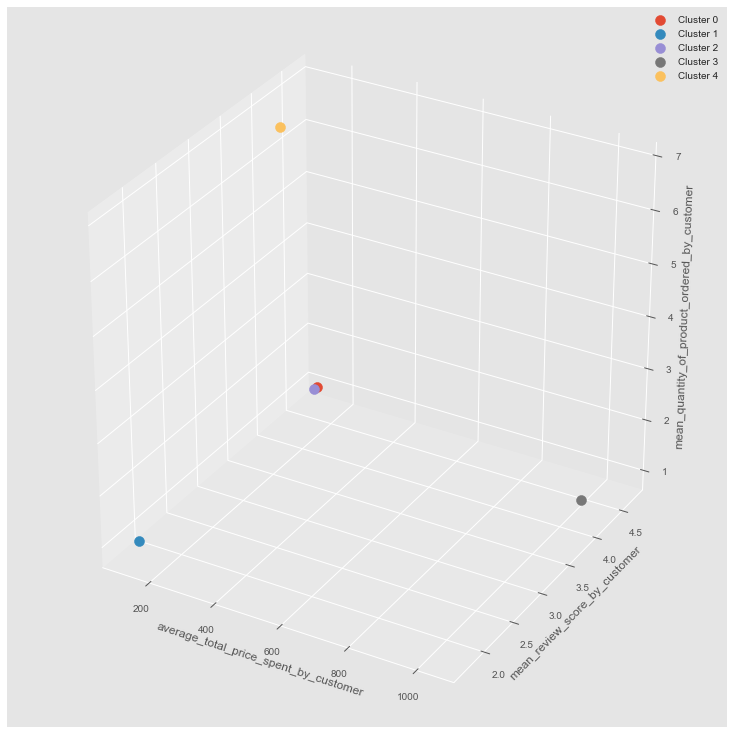

In [161]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 10))
ax = Axes3D(fig)

for NbClusters,row in df_centers.iterrows():
 ax.scatter(row['average_total_price_spent_by_customer'], row['mean_review_score_by_customer'], row['mean_quantity_of_product_ordered_by_customer'] ,label=NbClusters, s=100)

ax.set_xlabel('average_total_price_spent_by_customer')
ax.set_ylabel('mean_review_score_by_customer')
ax.set_zlabel('mean_quantity_of_product_ordered_by_customer')
ax.legend()
plt.show()

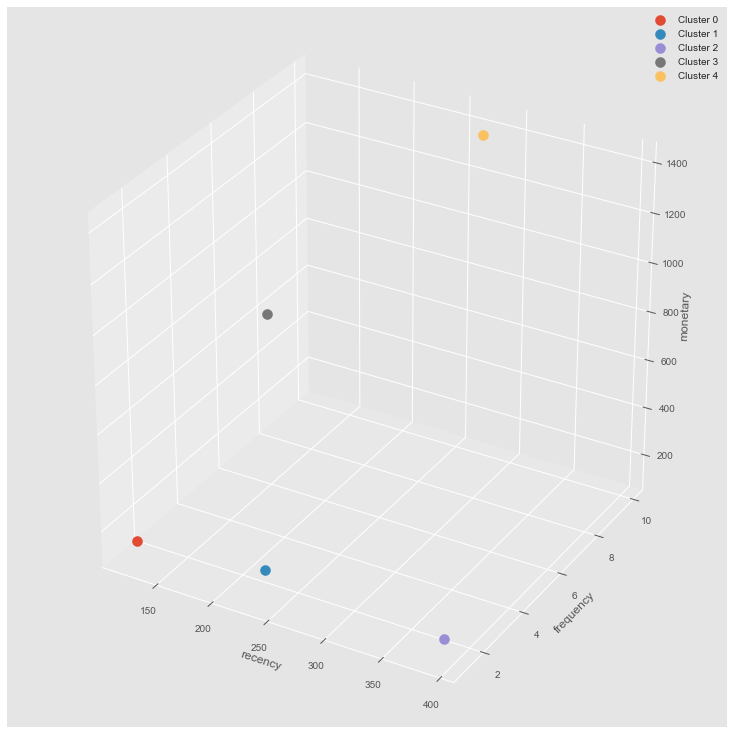

In [162]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 10))
ax = Axes3D(fig)

for NbClusters,row in df_centers.iterrows():
 ax.scatter(row['recency'], row['frequency'], row['monetary'] ,label=NbClusters, s=100)

ax.set_xlabel('recency')
ax.set_ylabel('frequency')
ax.set_zlabel('monetary')
ax.legend()
pyplot.show()

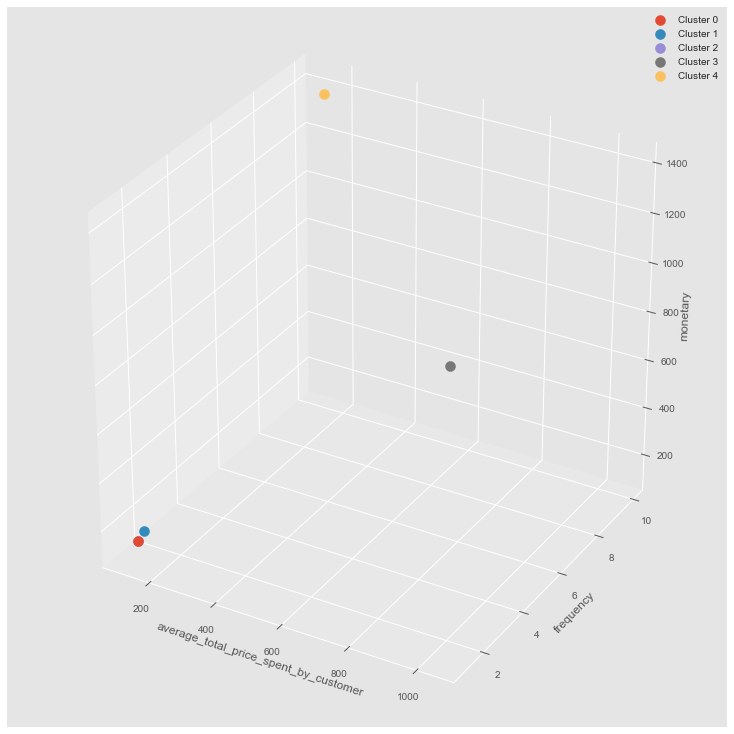

In [163]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 10))
ax = Axes3D(fig)

for NbClusters,row in df_centers.iterrows():
 ax.scatter(row['average_total_price_spent_by_customer'], row['frequency'], row['monetary'] ,label=NbClusters, s=100)

ax.set_xlabel('average_total_price_spent_by_customer')
ax.set_ylabel('frequency')
ax.set_zlabel('monetary')
ax.legend()
pyplot.show()

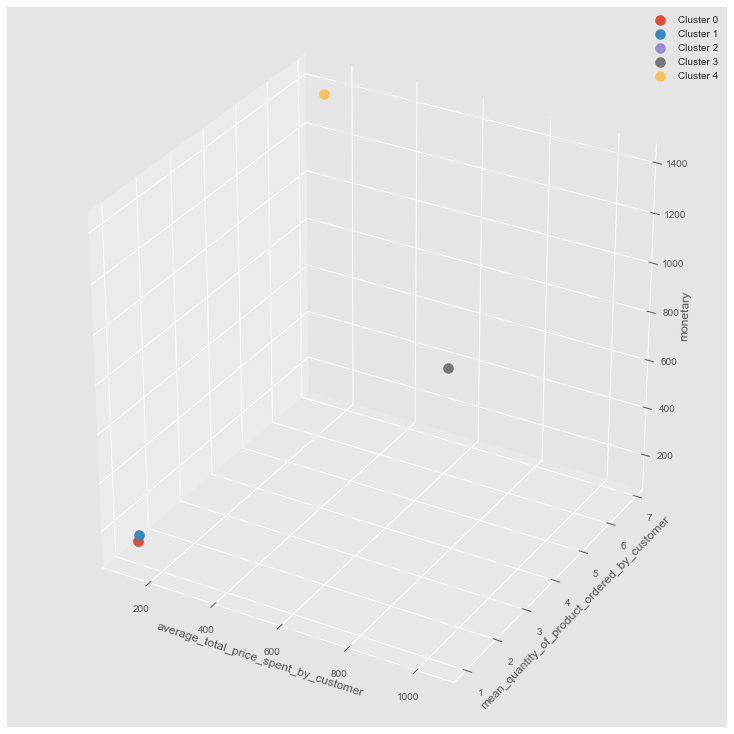

In [164]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 10))
ax = Axes3D(fig)

for NbClusters,row in df_centers.iterrows():
 ax.scatter(row['average_total_price_spent_by_customer'], row['mean_quantity_of_product_ordered_by_customer'], row['monetary'] ,label=NbClusters, s=100)

ax.set_xlabel('average_total_price_spent_by_customer')
ax.set_ylabel('mean_quantity_of_product_ordered_by_customer')
ax.set_zlabel('monetary')
ax.legend()
pyplot.show()

In [165]:
import plotly.express as px

fig = px.scatter_3d(df_centers, x='average_total_price_spent_by_customer', y='mean_quantity_of_product_ordered_by_customer', z='monetary',
              color='ClusterName')
fig.show()

In [166]:
import plotly.express as px

fig = px.scatter_3d(df_centers, x='recency', y='frequency', z='monetary',
              color='ClusterName')
fig.show()

In [167]:
import plotly.express as px

fig = px.scatter_3d(df_centers, x='average_total_price_spent_by_customer', y='frequency', z='monetary',
              color='ClusterName')
fig.show()

In [168]:
import plotly.express as px

fig = px.scatter_3d(df_centers, x='average_total_price_spent_by_customer', y='mean_quantity_of_product_ordered_by_customer', z='mean_review_score_by_customer',
              color='ClusterName')
fig.show()

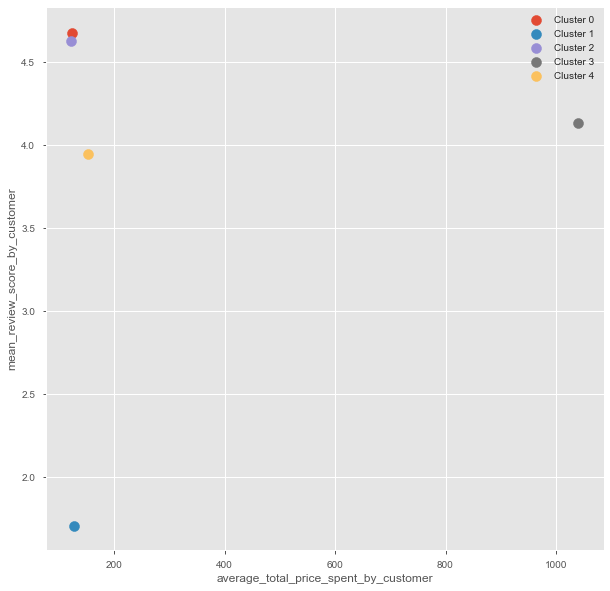

In [169]:
fig = plt.figure(figsize=(10, 10))


for NbClusters,row in df_centers.iterrows():
 plt.scatter(row['average_total_price_spent_by_customer'], row['mean_review_score_by_customer'], label=NbClusters, s=100)

plt.xlabel('average_total_price_spent_by_customer')
plt.ylabel('mean_review_score_by_customer')
plt.legend()
plt.show()

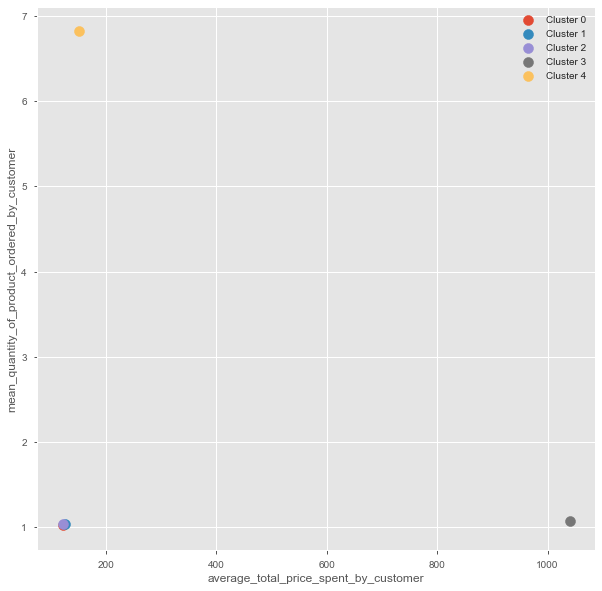

In [170]:
fig = plt.figure(figsize=(10, 10))

for NbClusters,row in df_centers.iterrows():
 plt.scatter(row['average_total_price_spent_by_customer'], row['mean_quantity_of_product_ordered_by_customer'], label=NbClusters, s=100)

plt.xlabel('average_total_price_spent_by_customer')
plt.ylabel('mean_quantity_of_product_ordered_by_customer')
plt.legend()
plt.show()

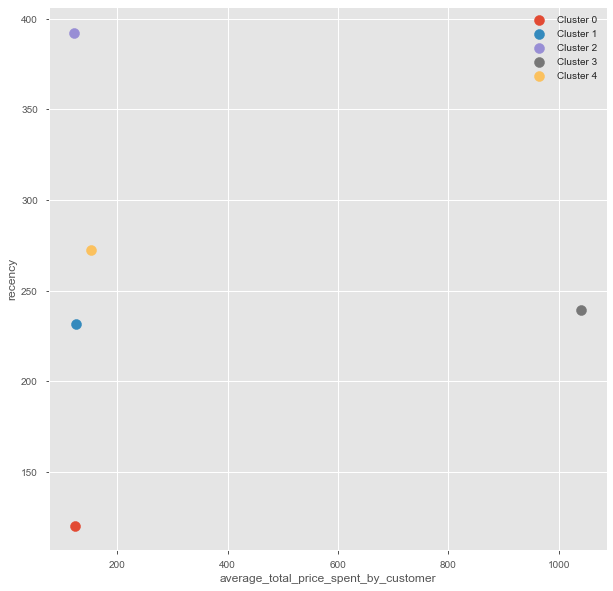

In [171]:
fig = plt.figure(figsize=(10, 10))

for NbClusters,row in df_centers.iterrows():
 plt.scatter(row['average_total_price_spent_by_customer'], row['recency'], label=NbClusters, s=100)

plt.xlabel('average_total_price_spent_by_customer')
plt.ylabel('recency')
plt.legend()
plt.show()

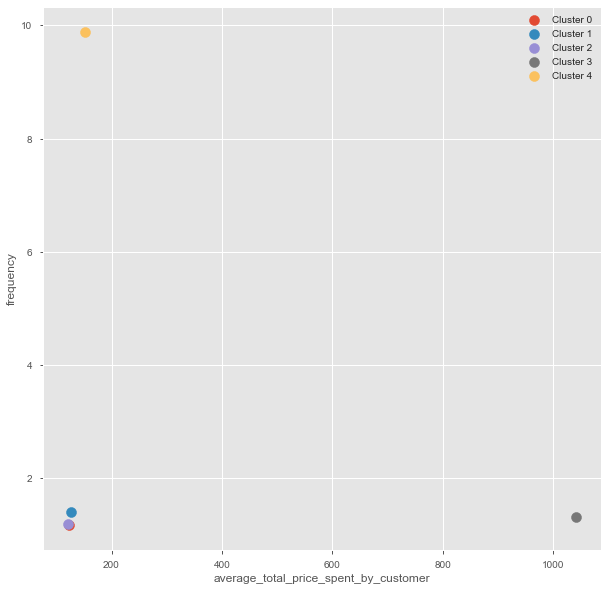

In [172]:
fig = plt.figure(figsize=(10, 10))

for NbClusters,row in df_centers.iterrows():
 plt.scatter(row['average_total_price_spent_by_customer'], row['frequency'], label=NbClusters, s=100)

plt.xlabel('average_total_price_spent_by_customer')
plt.ylabel('frequency')
plt.legend()
plt.show()

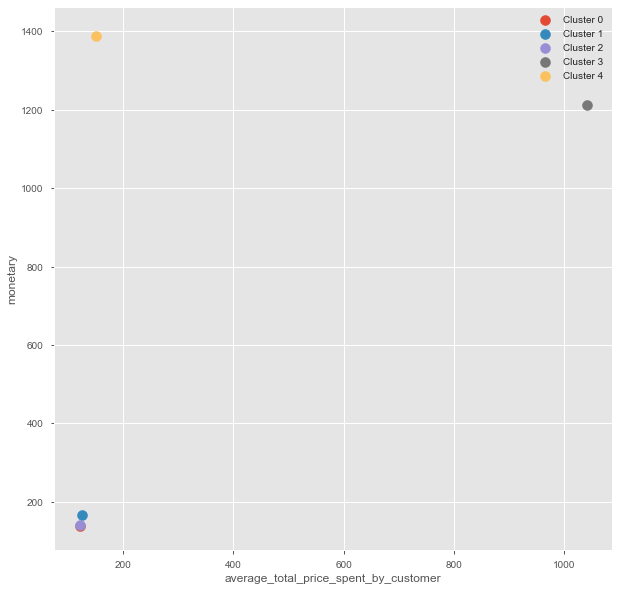

In [173]:
fig = plt.figure(figsize=(10, 10))

for NbClusters,row in df_centers.iterrows():
 plt.scatter(row['average_total_price_spent_by_customer'], row['monetary'], label=NbClusters, s=100)

plt.xlabel('average_total_price_spent_by_customer')
plt.ylabel('monetary')
plt.legend()
plt.show()

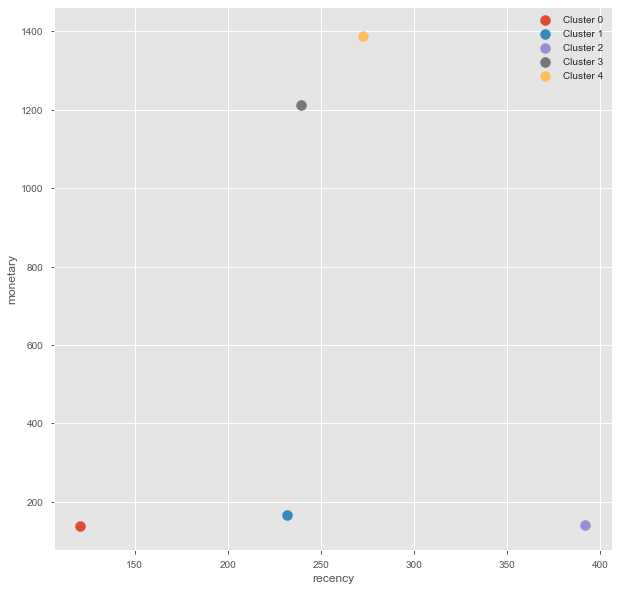

In [174]:
fig = plt.figure(figsize=(10, 10))

for NbClusters,row in df_centers.iterrows():
 plt.scatter(row['recency'], row['monetary'], label=NbClusters, s=100)

plt.xlabel('recency')
plt.ylabel('monetary')
plt.legend()
plt.show()

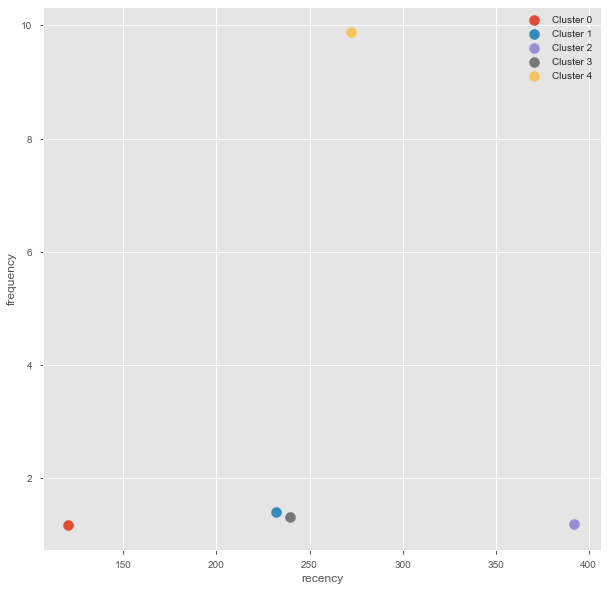

In [175]:
fig = plt.figure(figsize=(10, 10))

for NbClusters,row in df_centers.iterrows():
 plt.scatter(row['recency'], row['frequency'], label=NbClusters, s=100)

plt.xlabel('recency')
plt.ylabel('frequency')
plt.legend()
plt.show()

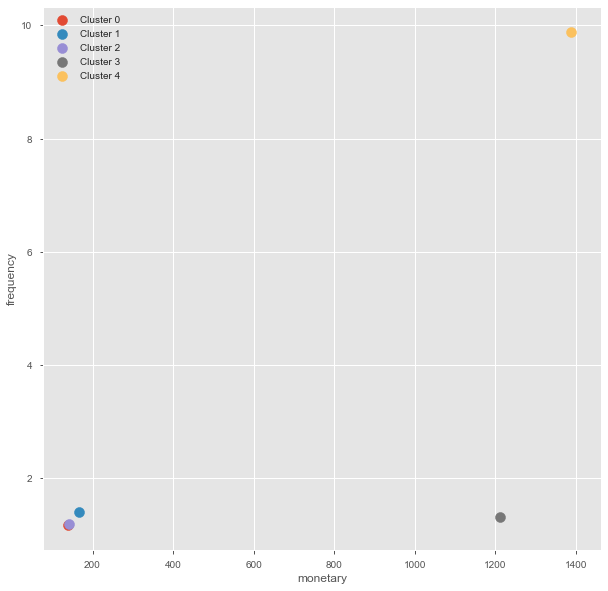

In [176]:
fig = plt.figure(figsize=(10, 10))

for NbClusters,row in df_centers.iterrows():
 plt.scatter(row['monetary'], row['frequency'], label=NbClusters, s=100)

plt.xlabel('monetary')
plt.ylabel('frequency')
plt.legend()
plt.show()

In [177]:
import plotly.express as px
import pandas as pd
df = pd.DataFrame(dict(
    r=renormalized_cluster_data[0],
    theta=customer_data_merge.columns))
fig = px.line_polar(df, r='r', theta='theta', line_close=True)
#fig.update_traces(fill='toself')
fig.show()

In [178]:
import plotly.express as px
import pandas as pd
df = pd.DataFrame(dict(
    r=renormalized_cluster_data[1],
    theta=customer_data_merge.columns))
fig = px.line_polar(df, r='r', theta='theta', line_close=True)
#fig.update_traces(fill='toself')
fig.show()

In [179]:
import plotly.express as px
import pandas as pd
df = pd.DataFrame(dict(
    r=renormalized_cluster_data[2],
    theta=customer_data_merge.columns))
fig = px.line_polar(df, r='r', theta='theta', line_close=True)
#fig.update_traces(fill='toself')
fig.show()

In [180]:
import plotly.express as px
import pandas as pd
df = pd.DataFrame(dict(
    r=renormalized_cluster_data[3],
    theta=customer_data_merge.columns))
fig = px.line_polar(df, r='r', theta='theta', line_close=True)
#fig.update_traces(fill='toself')
fig.show()

In [181]:
import plotly.express as px
import pandas as pd
df = pd.DataFrame(dict(
    r=renormalized_cluster_data[4],
    theta=customer_data_merge.columns))
fig = px.line_polar(df, r='r', theta='theta', line_close=True)
#fig.update_traces(fill='toself')
fig.show()

In [182]:
import plotly.graph_objects as go

categories = customer_data_merge.columns

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=renormalized_cluster_data[0],
      theta=categories,
      fill='toself',
      name='Cluster A'
))
fig.add_trace(go.Scatterpolar(
      r=renormalized_cluster_data[1],
      theta=categories,
      fill='toself',
      name='Cluster B'
))
fig.add_trace(go.Scatterpolar(
      r=renormalized_cluster_data[2],
      theta=categories,
      fill='toself',
      name='Cluster C'
))
fig.add_trace(go.Scatterpolar(
      r=renormalized_cluster_data[3],
      theta=categories,
      fill='toself',
      name='Cluster D'
))
fig.add_trace(go.Scatterpolar(
      r=renormalized_cluster_data[4],
      theta=categories,
      fill='toself',
      name='Cluster E'
))
fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[0, 1200]
    )),
  showlegend=False
)

fig.show()

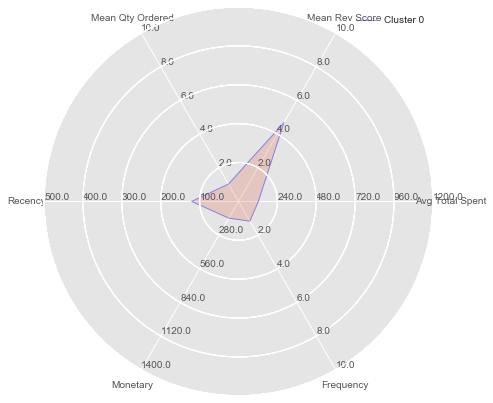

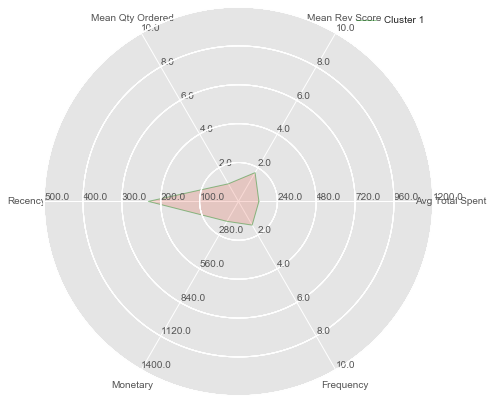

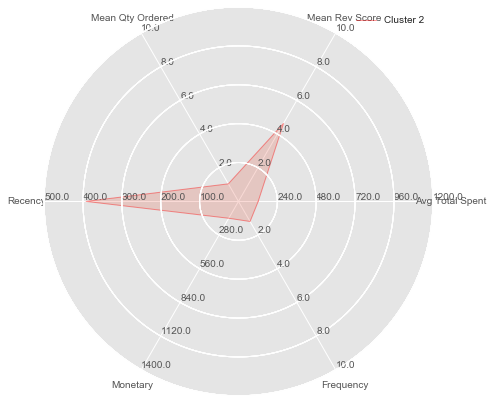

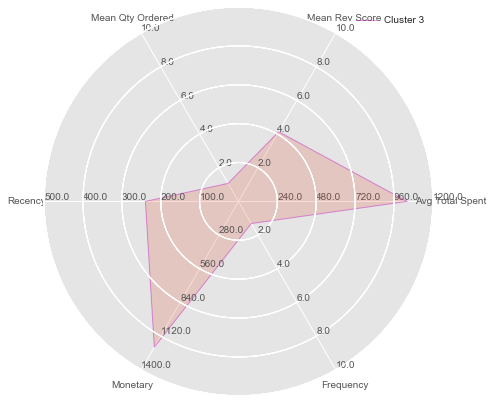

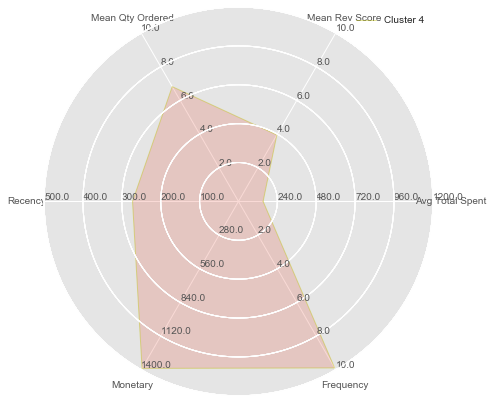

In [183]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns # improves plot aesthetics


def _invert(x, limits):
    """inverts a value x on a scale from
    limits[0] to limits[1]"""
    return limits[1] - (x - limits[0])

def _scale_data(data, ranges):
    """scales data[1:] to ranges[0],
    inverts if the scale is reversed"""
    for d, (y1, y2) in zip(data[1:], ranges[1:]):
        assert (y1 <= d <= y2) or (y2 <= d <= y1)
    x1, x2 = ranges[0]
    d = data[0]
    if x1 > x2:
        d = _invert(d, (x1, x2))
        x1, x2 = x2, x1
    sdata = [d]
    for d, (y1, y2) in zip(data[1:], ranges[1:]):
        if y1 > y2:
            d = _invert(d, (y1, y2))
            y1, y2 = y2, y1
        sdata.append((d-y1) / (y2-y1) 
                     * (x2 - x1) + x1)
    return sdata

class ComplexRadar():
    def __init__(self, fig, variables, ranges,
                 n_ordinate_levels=6):
        angles = np.arange(0, 360, 360./len(variables))

        axes = [fig.add_axes([0.1,0.1,0.9,0.9],polar=True,
                label = "axes{}".format(i)) 
                for i in range(len(variables))]
        l, text = axes[0].set_thetagrids(angles, 
                                         labels=variables)
        [txt.set_rotation(angle-90) for txt, angle 
             in zip(text, angles)]
        for ax in axes[1:]:
            ax.patch.set_visible(False)
            ax.grid("off")
            ax.xaxis.set_visible(False)
        for i, ax in enumerate(axes):
            grid = np.linspace(*ranges[i], 
                               num=n_ordinate_levels)
            gridlabel = ["{}".format(round(x,2)) 
                         for x in grid]
            if ranges[i][0] > ranges[i][1]:
                grid = grid[::-1] # hack to invert grid
                          # gridlabels aren't reversed
            gridlabel[0] = "" # clean up origin
            ax.set_rgrids(grid, labels=gridlabel,
                         angle=angles[i])
            #ax.spines["polar"].set_visible(False)
            ax.set_ylim(*ranges[i])
        # variables for plotting
        self.angle = np.deg2rad(np.r_[angles, angles[0]])
        self.ranges = ranges
        self.ax = axes[0]
    def plot(self, data, *args, **kw):
        sdata = _scale_data(data, self.ranges)
        self.ax.plot(self.angle, np.r_[sdata, sdata[0]], *args, **kw)
    def fill(self, data, *args, **kw):
        sdata = _scale_data(data, self.ranges)
        self.ax.fill(self.angle, np.r_[sdata, sdata[0]], *args, **kw)

# example data
variables = ('Avg Total Spent','Mean Rev Score','Mean Qty Ordered','Recency',
           'Monetary','Frequency')
             
data =(df_centers['average_total_price_spent_by_customer'][0],df_centers['mean_review_score_by_customer'][0],df_centers['mean_quantity_of_product_ordered_by_customer'][0],df_centers['recency'][0],df_centers['monetary'][0],df_centers['frequency'][0])
data2 =(df_centers['average_total_price_spent_by_customer'][1],df_centers['mean_review_score_by_customer'][1],df_centers['mean_quantity_of_product_ordered_by_customer'][1],df_centers['recency'][1],df_centers['monetary'][1],df_centers['frequency'][1])
data3 =(df_centers['average_total_price_spent_by_customer'][2],df_centers['mean_review_score_by_customer'][2],df_centers['mean_quantity_of_product_ordered_by_customer'][2],df_centers['recency'][2],df_centers['monetary'][2],df_centers['frequency'][2])
data4 =(df_centers['average_total_price_spent_by_customer'][3],df_centers['mean_review_score_by_customer'][3],df_centers['mean_quantity_of_product_ordered_by_customer'][3],df_centers['recency'][3],df_centers['monetary'][3],df_centers['frequency'][3])
data5 =(df_centers['average_total_price_spent_by_customer'][4],df_centers['mean_review_score_by_customer'][4],df_centers['mean_quantity_of_product_ordered_by_customer'][4],df_centers['recency'][4],df_centers['monetary'][4],df_centers['frequency'][4])


ranges = [(0,1200), (0,10), (0,10),
         (0,500), (0,1400),(0,10)]            
# plotting
fig1 = plt.figure(figsize=(6,6))
fig2 = plt.figure(figsize=(6,6))
fig3 = plt.figure(figsize=(6,6))
fig4 = plt.figure(figsize=(6,6))
fig5 = plt.figure(figsize=(6,6))

radar = ComplexRadar(fig1, variables, ranges)
radar2 = ComplexRadar(fig2, variables, ranges)
radar3 = ComplexRadar(fig3, variables, ranges)
radar4 = ComplexRadar(fig4, variables, ranges)
radar5 = ComplexRadar(fig5, variables, ranges)

radar.plot(data,"-", lw=1, color="b", alpha=0.4, label = 'Cluster 0')
radar2.plot(data2,"-", lw=1, color="g", alpha=0.4, label = 'Cluster 1')
radar3.plot(data3,"-", lw=1, color="r", alpha=0.4, label = 'Cluster 2')
radar4.plot(data4,"-", lw=1, color="m", alpha=0.4, label = 'Cluster 3')
radar5.plot(data5,"-", lw=1, color="y", alpha=0.4, label = 'Cluster 4')

radar.fill(data, alpha=0.2)
radar2.fill(data2, alpha=0.2)
radar3.fill(data3, alpha=0.2)
radar4.fill(data4, alpha=0.2)
radar5.fill(data5, alpha=0.2)

radar.ax.legend()
radar2.ax.legend()
radar3.ax.legend()
radar4.ax.legend()
radar5.ax.legend()

plt.show()   

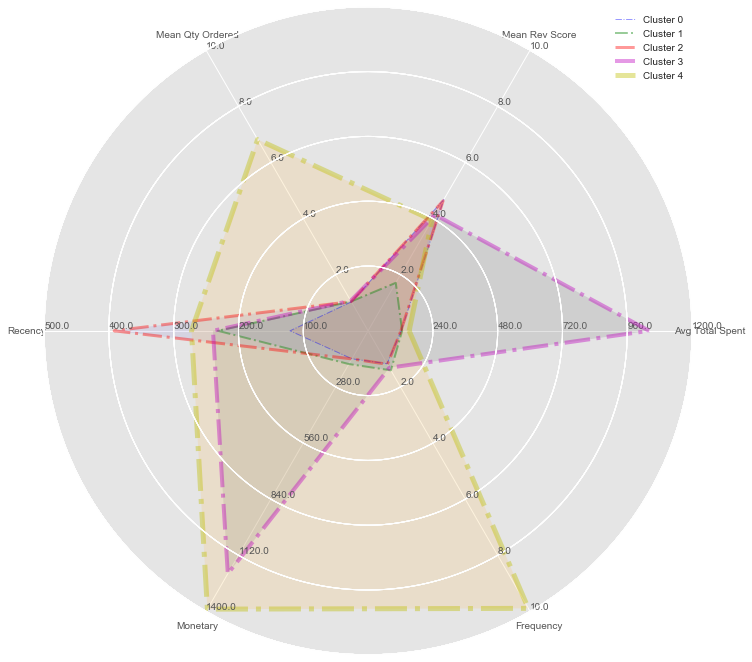

In [184]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns # improves plot aesthetics


def _invert(x, limits):
    """inverts a value x on a scale from
    limits[0] to limits[1]"""
    return limits[1] - (x - limits[0])

def _scale_data(data, ranges):
    """scales data[1:] to ranges[0],
    inverts if the scale is reversed"""
    for d, (y1, y2) in zip(data[1:], ranges[1:]):
        assert (y1 <= d <= y2) or (y2 <= d <= y1)
    x1, x2 = ranges[0]
    d = data[0]
    if x1 > x2:
        d = _invert(d, (x1, x2))
        x1, x2 = x2, x1
    sdata = [d]
    for d, (y1, y2) in zip(data[1:], ranges[1:]):
        if y1 > y2:
            d = _invert(d, (y1, y2))
            y1, y2 = y2, y1
        sdata.append((d-y1) / (y2-y1) 
                     * (x2 - x1) + x1)
    return sdata

class ComplexRadar():
    def __init__(self, fig, variables, ranges,
                 n_ordinate_levels=6):
        angles = np.arange(0, 360, 360./len(variables))

        axes = [fig.add_axes([0.1,0.1,0.9,0.9],polar=True,
                label = "axes{}".format(i)) 
                for i in range(len(variables))]
        l, text = axes[0].set_thetagrids(angles, 
                                         labels=variables)
        [txt.set_rotation(angle-90) for txt, angle 
             in zip(text, angles)]
        for ax in axes[1:]:
            ax.patch.set_visible(False)
            ax.grid("off")
            ax.xaxis.set_visible(False)
        for i, ax in enumerate(axes):
            grid = np.linspace(*ranges[i], 
                               num=n_ordinate_levels)
            gridlabel = ["{}".format(round(x,2)) 
                         for x in grid]
            if ranges[i][0] > ranges[i][1]:
                grid = grid[::-1] # hack to invert grid
                          # gridlabels aren't reversed
            gridlabel[0] = "" # clean up origin
            ax.set_rgrids(grid, labels=gridlabel,
                         angle=angles[i])
            #ax.spines["polar"].set_visible(False)
            ax.set_ylim(*ranges[i])
        # variables for plotting
        self.angle = np.deg2rad(np.r_[angles, angles[0]])
        self.ranges = ranges
        self.ax = axes[0]
    def plot(self, data, *args, **kw):
        sdata = _scale_data(data, self.ranges)
        self.ax.plot(self.angle, np.r_[sdata, sdata[0]], *args, **kw)
    def fill(self, data, *args, **kw):
        sdata = _scale_data(data, self.ranges)
        self.ax.fill(self.angle, np.r_[sdata, sdata[0]], *args, **kw)

# example data
variables = ('Avg Total Spent','Mean Rev Score','Mean Qty Ordered','Recency',
           'Monetary','Frequency')
             
data =(df_centers['average_total_price_spent_by_customer'][0],df_centers['mean_review_score_by_customer'][0],df_centers['mean_quantity_of_product_ordered_by_customer'][0],df_centers['recency'][0],df_centers['monetary'][0],df_centers['frequency'][0])
data2 =(df_centers['average_total_price_spent_by_customer'][1],df_centers['mean_review_score_by_customer'][1],df_centers['mean_quantity_of_product_ordered_by_customer'][1],df_centers['recency'][1],df_centers['monetary'][1],df_centers['frequency'][1])
data3 =(df_centers['average_total_price_spent_by_customer'][2],df_centers['mean_review_score_by_customer'][2],df_centers['mean_quantity_of_product_ordered_by_customer'][2],df_centers['recency'][2],df_centers['monetary'][2],df_centers['frequency'][2])
data4 =(df_centers['average_total_price_spent_by_customer'][3],df_centers['mean_review_score_by_customer'][3],df_centers['mean_quantity_of_product_ordered_by_customer'][3],df_centers['recency'][3],df_centers['monetary'][3],df_centers['frequency'][3])
data5 =(df_centers['average_total_price_spent_by_customer'][4],df_centers['mean_review_score_by_customer'][4],df_centers['mean_quantity_of_product_ordered_by_customer'][4],df_centers['recency'][4],df_centers['monetary'][4],df_centers['frequency'][4])


ranges = [(0,1200), (0,10), (0,10),
         (0,500), (0,1400),(0,10)]     

# plotting
fig1 = plt.figure(figsize=(10, 10))
radar = ComplexRadar(fig1, variables, ranges)
radar.plot(data,"-.", lw=1, color="b", alpha=0.4, label = 'Cluster 0')
radar.plot(data2,"-.", lw=2, color="g", alpha=0.4, label = 'Cluster 1')
radar.plot(data3,"-.", lw=3, color="r", alpha=0.4, label = 'Cluster 2')
radar.plot(data4,"-.", lw=4, color="m", alpha=0.4, label = 'Cluster 3')
radar.plot(data5,"-.", lw=5, color="y", alpha=0.4, label = 'Cluster 4')
radar.fill(data, alpha=0.2)
radar.fill(data2, alpha=0.2)
radar.fill(data3, alpha=0.2)
radar.fill(data4, alpha=0.2)
radar.fill(data5, alpha=0.2)
radar.ax.legend()
plt.show()   

In [185]:
import matplotlib.pyplot as plt
import matplotlib.transforms as mtrans
import mpl_toolkits.axes_grid1.inset_locator as inset

import seaborn

seaborn.set(style='ticks')
%matplotlib inline

def connect_spines(left_ax, right_ax, left_y, right_y, **line_kwds):
    left_trans = mtrans.blended_transform_factory(left_ax.transData, left_ax.transAxes)
    right_trans = mtrans.blended_transform_factory(right_ax.transData, right_ax.transAxes)

    left_data_trans = left_ax.transScale + left_ax.transLimits
    right_data_trans = right_ax.transScale + right_ax.transLimits
    
    left_pos = left_data_trans.transform((0, left_y))[1]
    right_pos = right_data_trans.transform((0, right_y))[1]
    
    bbox = mtrans.Bbox.from_extents(0, left_pos, 0, right_pos)
    right_bbox = mtrans.TransformedBbox(bbox, right_trans)
    left_bbox = mtrans.TransformedBbox(bbox, left_trans)

    connecter = inset.BboxConnector(left_bbox, right_bbox, loc1=3, loc2=2, **line_kwds)
    connecter.set_clip_on(False)

    return connecter

In [186]:
df_centers2=df_centers.drop(columns={'PercentageNbCust','ClusterCountNbCust','ClusterName'})
df_centers2.describe()

,average_total_price_spent_by_customer,mean_review_score_by_customer,mean_quantity_of_product_ordered_by_customer,recency,monetary,frequency
count,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
mean,312.726152,3.820663,2.201310,251.177334,609.388819,2.997139
std,407.116448,1.220799,2.580405,97.288890,634.104126,3.855783
min,121.760758,1.710105,1.030634,120.410463,139.698431,1.174976
25%,122.889440,3.948246,1.042781,231.788123,140.242823,1.193371
50%,126.234496,4.136375,1.044955,239.334892,165.911301,1.316192
75%,152.087535,4.630774,1.070973,272.500000,1212.293370,1.408685
max,1040.658531,4.677816,6.817204,391.853193,1388.798172,9.892473


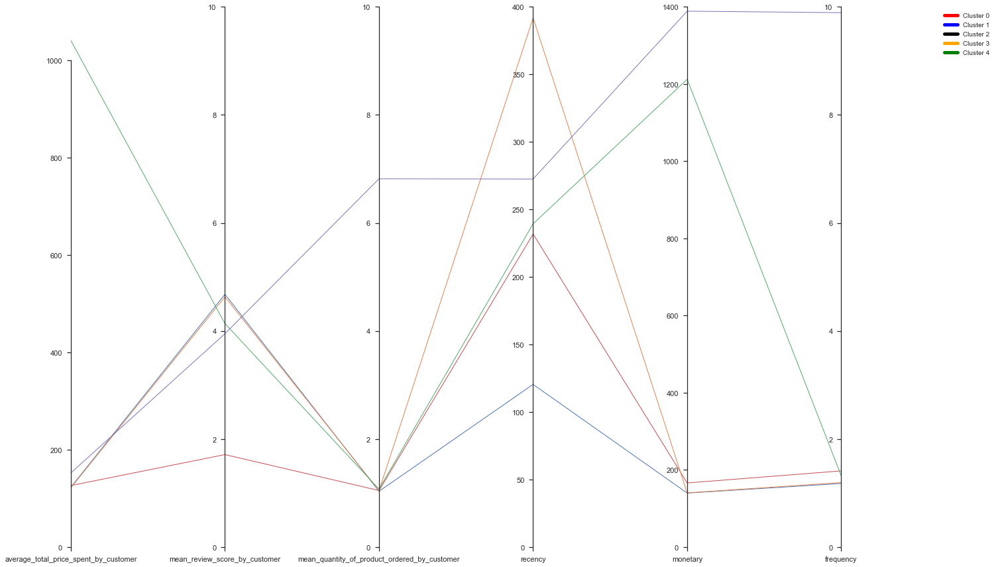

In [187]:
from matplotlib import collections
data = df_centers2.values
with seaborn.axes_style('ticks'):
    fig, axes = plt.subplots(ncols=6, figsize=(25,15))
    colors = dict(zip(np.unique(data[:, -1]), seaborn.color_palette(n_colors=5)))
    axes[0].set_ylim(0, 1110)
    axes[1].set_ylim(0, 10)
    axes[2].set_ylim(0, 10)
    axes[3].set_ylim(0, 400)
    axes[4].set_ylim(0, 1400)
    axes[5].set_ylim(0, 10)

    for n, (ax1, ax2) in enumerate(zip(axes[:-1], axes[1:])):
        lines = []
        for row in df_centers2.values:
            line = connect_spines(ax1, ax2, row[n], row[n+1], color=colors[row[-1]])
            ax1.add_line(line)

    for n, ax in enumerate(axes):
        ax.set_xticks([0])
        ax.set_xticklabels([df_centers2.columns[n]])

Cluster0 = plt.Line2D([],[], color='red',   ls="-",lw=5, label="Cluster 0")
Cluster1 = plt.Line2D([],[], color='blue',  ls="-",lw=5, label="Cluster 1")
Cluster2 = plt.Line2D([],[], color='black', ls="-",lw=5, label="Cluster 2")
Cluster3 = plt.Line2D([],[], color='orange', ls="-",lw=5, label="Cluster 3")
Cluster4 = plt.Line2D([],[], color='green', ls="-",lw=5, label="Cluster 4")
plt.legend(handles=[Cluster0, Cluster1,Cluster2,Cluster3,Cluster4],loc=1, prop={'size':10})

fig.subplots_adjust(wspace=0)
seaborn.despine(fig=fig, bottom=True, trim=True)

In [188]:
customer_data_merge['Cluster'] = x
customer_data_merge.head(10)

,average_total_price_spent_by_customer,mean_review_score_by_customer,mean_quantity_of_product_ordered_by_customer,recency,monetary,frequency,Cluster
customer_unique_id,,,,,,,
7c396fd4830fd04220f754e42b4e5bff,40.060000,4.250000,2.0,331,160.24,4,0
3a51803cc0d012c3b5dc8b7528cb05f7,37.770000,4.000000,1.0,378,37.77,1,0
ef0996a1a279c26e7ecbd737be23d235,37.770000,5.000000,1.0,391,37.77,1,0
e781fdcc107d13d865fc7698711cc572,44.090000,3.000000,1.0,308,44.09,1,0
7a1de9bde89aedca8c5fbad489c5571c,155.666667,2.333333,1.0,269,467.00,3,1
35c6ec4630637b3ec0da6e587f245f83,50.050000,4.000000,1.0,339,50.05,1,0
4e4fa2b85379e9db6dc59f873f0a9748,32.680000,5.000000,1.0,378,32.68,1,0
0b7a92bbb834394fd894c370ba568278,88.250000,3.000000,1.0,32,176.50,2,4
59f5e5c0ff8a1ca7026faa8c316693eb,79.760000,5.000000,1.0,29,79.76,1,4


In [189]:
customer_data_merge.describe().T

,count,mean,std,min,25%,50%,75%,max
average_total_price_spent_by_customer,90124.0,147.105194,198.924834,9.341429,57.82,96.80,163.77,6929.31
mean_review_score_by_customer,90124.0,4.130361,1.295179,1.000000,4.00,5.00,5.00,5.00
mean_quantity_of_product_ordered_by_customer,90124.0,1.050286,0.384850,1.000000,1.00,1.00,1.00,26.00
recency,90124.0,236.324741,152.953231,0.000000,112.00,217.00,345.00,694.00
monetary,90124.0,175.021734,261.278679,10.070000,64.10,111.72,190.37,13664.08
frequency,90124.0,1.243576,0.855888,1.000000,1.00,1.00,1.00,75.00
Cluster,90124.0,2.186199,1.903677,0.000000,0.00,4.00,4.00,4.00


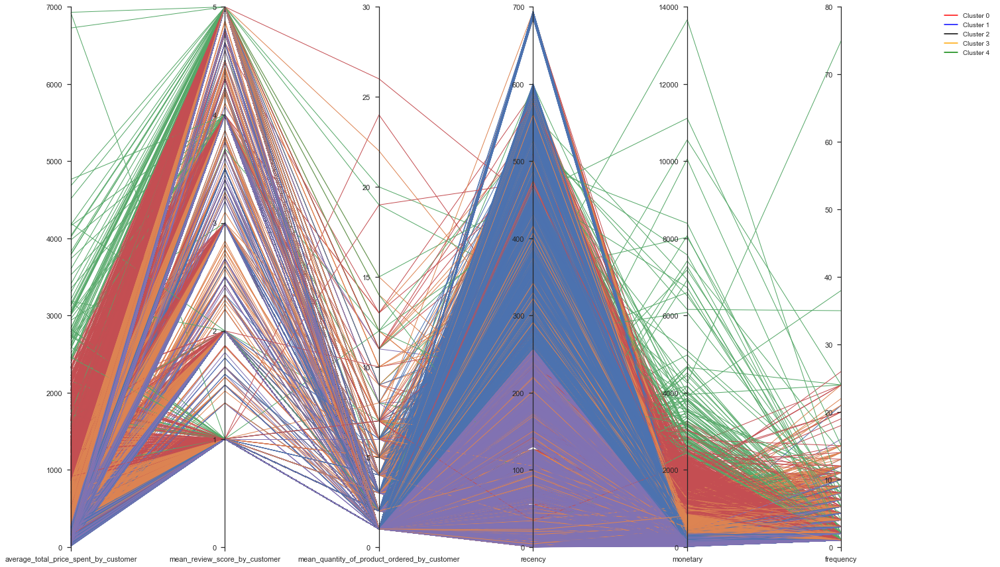

In [190]:
from matplotlib import collections
data = customer_data_merge.values
with seaborn.axes_style('ticks'):
    fig, axes = plt.subplots(ncols=6, figsize=(25,15))
    colors = dict(zip(np.unique(data[:, -1]), seaborn.color_palette(n_colors=5)))
    axes[0].set_ylim(0, 7000)
    axes[1].set_ylim(0, 5)
    axes[2].set_ylim(0, 30)
    axes[3].set_ylim(0, 700)
    axes[4].set_ylim(0, 14000)
    axes[5].set_ylim(0, 80)

    for n, (ax1, ax2) in enumerate(zip(axes[:-1], axes[1:])):
        lines = []
        for row in customer_data_merge.values:
            line = connect_spines(ax1, ax2, row[n], row[n+1], color=colors[row[-1]])
            ax1.add_line(line)

    for n, ax in enumerate(axes):
        ax.set_xticks([0])
        ax.set_xticklabels([customer_data_merge.columns[n]])

    Cluster0 = plt.Line2D([],[], color='red',   ls="-", label="Cluster 0")
Cluster1 = plt.Line2D([],[], color='blue',  ls="-", label="Cluster 1")
Cluster2 = plt.Line2D([],[], color='black', ls="-", label="Cluster 2")
Cluster3 = plt.Line2D([],[], color='orange', ls="-", label="Cluster 3")
Cluster4 = plt.Line2D([],[], color='green', ls="-", label="Cluster 4")
plt.legend(handles=[Cluster0, Cluster1,Cluster2,Cluster3,Cluster4],loc=1, prop={'size':10})
    
fig.subplots_adjust(wspace=0)
seaborn.despine(fig=fig, bottom=True, trim=True)

In [191]:
Sum_of_squared_distances = []
K = range(1,7)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data_transformed)
    Sum_of_squared_distances.append(km.inertia_)

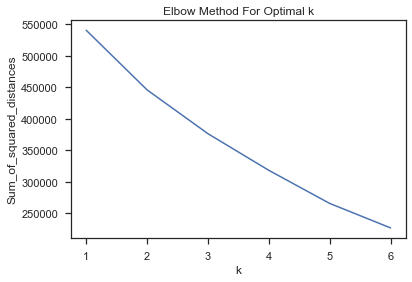

In [192]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.663002174790429
For n_clusters = 3 The average silhouette_score is : 0.35129237922514683
For n_clusters = 4 The average silhouette_score is : 0.35887139466222734
For n_clusters = 5 The average silhouette_score is : 0.3205413171173249
For n_clusters = 6 The average silhouette_score is : 0.34113491981080757
For n_clusters = 7 The average silhouette_score is : 0.3513683858572965


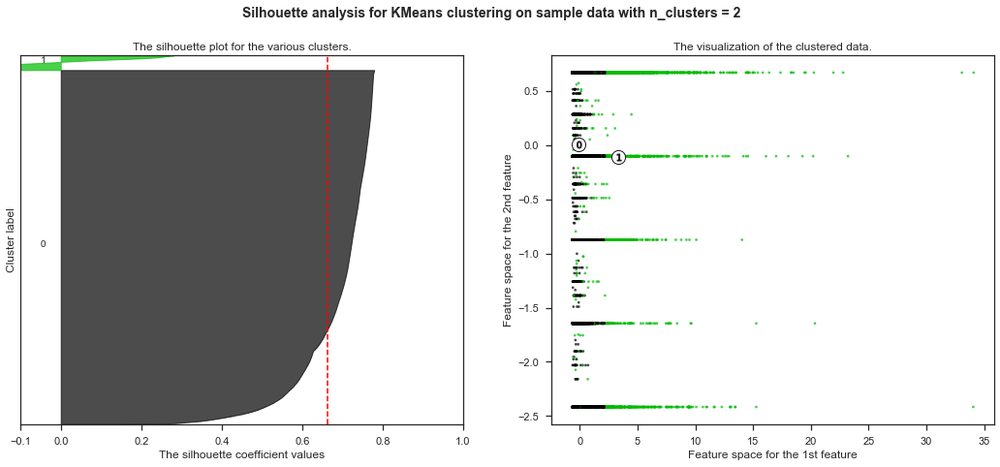

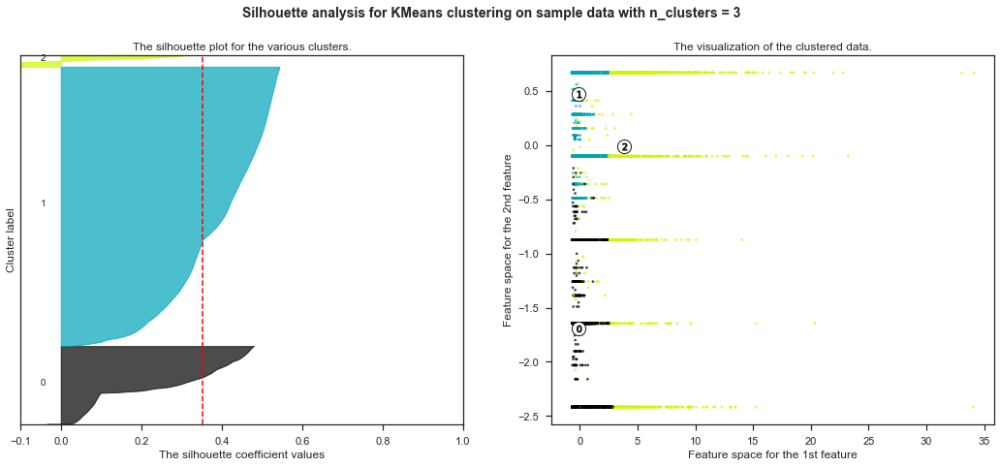

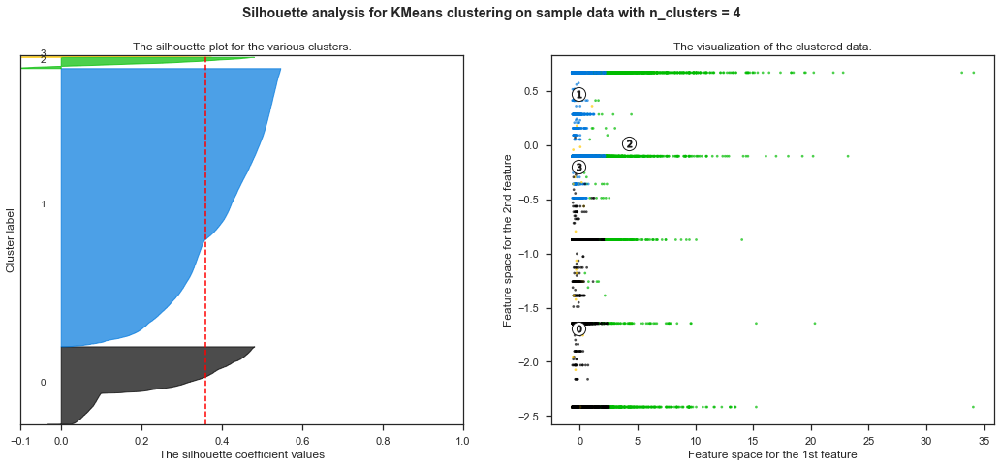

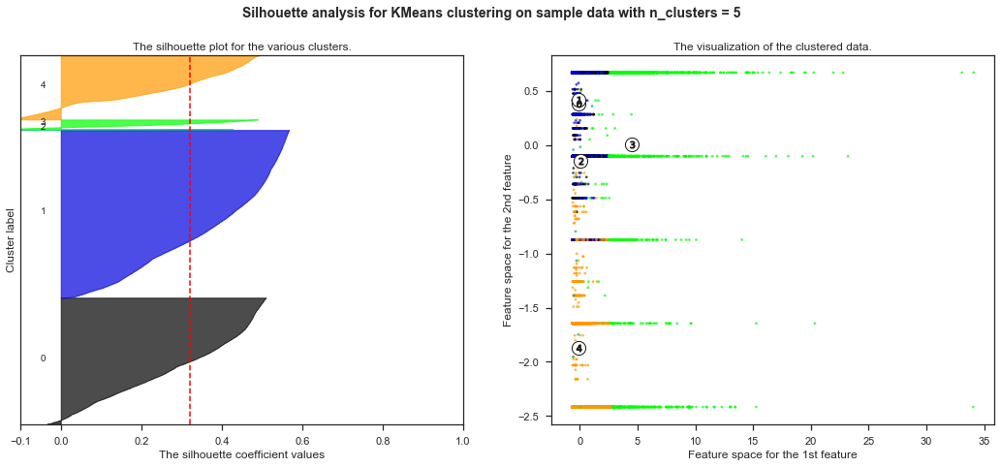

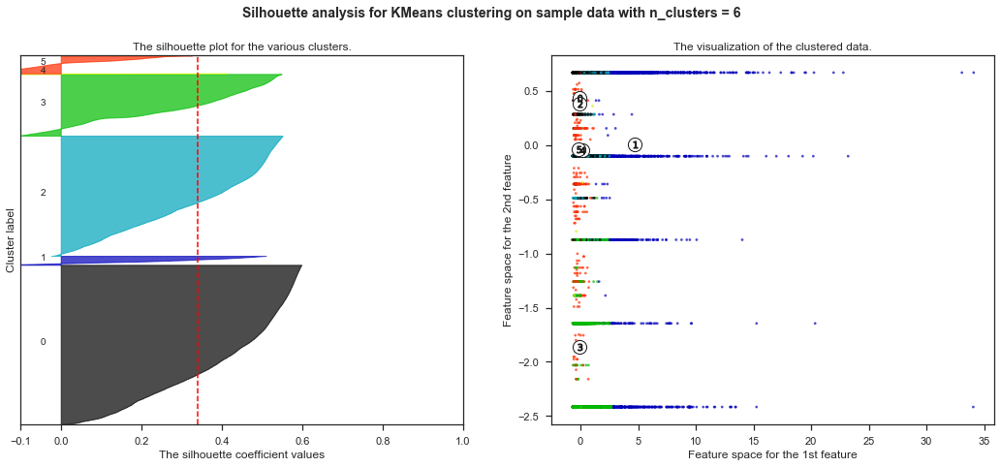

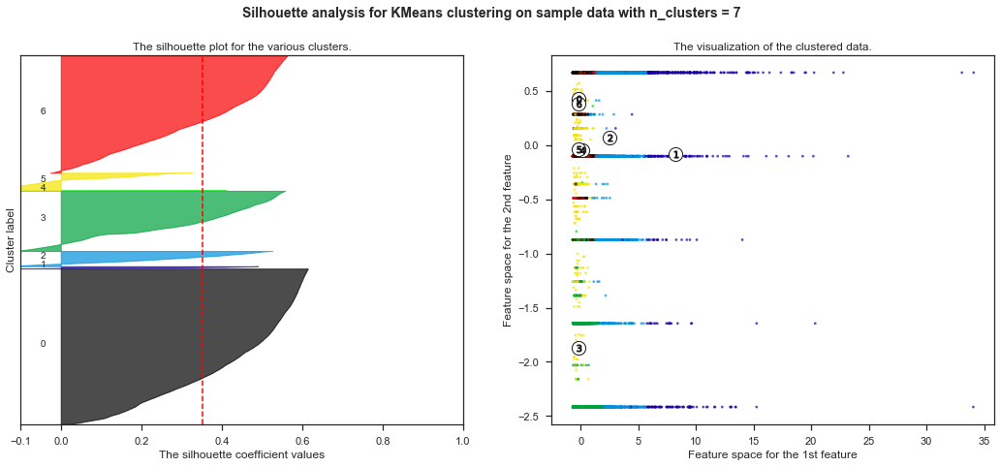

In [193]:
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

range_n_clusters = [2, 3, 4, 5, 6, 7]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(data_transformed) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(data_transformed)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(data_transformed, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data_transformed, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(data_transformed[:, 0], data_transformed[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

from sklearn.cluster import DBSCAN
from sklearn import metrics
X=customer_data_merge
X=StandardScaler().fit_transform(X)
dbscan = DBSCAN(eps=2, min_samples=2)
model = dbscan.fit(X)
labels= model.labels_

core_samples=np.zeros_like(labels, dtype=bool)
core_samples[dbscan.core_samples_indices_]=True
print(core_samples)

n_clusters=len(set(labels)) - (1 if -1 in labels else 0)
n_clusters_

print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X,labels))

In [194]:
%matplotlib inline
from gap_statistic import OptimalK

In [195]:
optimalK = OptimalK(parallel_backend='rust')
optimalK

OptimalK(n_jobs=4, parallel_backend="rust")

In [196]:
n_clusters = optimalK(data_transformed, cluster_array=np.arange(1, 15))
print('Optimal clusters: ', n_clusters)

Optimal clusters:  10


In [197]:
optimalK.gap_df

,n_clusters,gap_value,gap*,ref_dispersion_std,diff,diff*
0,1.0,-3.585717,-495705.506072,86.498892,-0.025152,521827.660797
1,2.0,-3.557999,-485592.847812,81.796098,0.027869,551428.697336
2,3.0,-3.584004,-494893.201734,59.391564,-0.032597,516180.801453
3,4.0,-3.550046,-482510.371776,43.362571,0.021709,545000.227312
4,5.0,-3.570583,-490354.335925,37.389345,-0.002549,533744.806142
5,6.0,-3.567028,-488726.301544,32.040496,-0.015668,522253.382734
6,7.0,-3.549593,-482465.359821,56.295645,-0.007460,523121.791373
7,8.0,-3.541322,-479891.906202,25.852432,0.001559,525500.028377
8,9.0,-3.541185,-479798.742855,54.127070,-0.022610,506573.289100
9,10.0,-3.517186,-470721.959293,44.282323,0.016938,528061.650031


In [ ]:
plt.plot(optimalK.gap_df.n_clusters, optimalK.gap_df.gap_value, linewidth=3)
plt.scatter(optimalK.gap_df[optimalK.gap_df.n_clusters == n_clusters].n_clusters,
            optimalK.gap_df[optimalK.gap_df.n_clusters == n_clusters].gap_value, s=250, c='r')
plt.grid(True)





plt.xlabel('Cluster Count')
plt.ylabel('Gap Value')
plt.title('Gap Values by Cluster Count')
plt.show()